#### This file presents the important parts of the analysis, namely:
* Loading, transforming and filtering the reconstructed profiles
* Preliminary exploration of the data
* Running a linear mixed model on all the genes
* Sort the genes according to the category they belong to with model selection
* Output a master file, and a file of plots, for all the genes
* Compare the results with the dataset from Atger
* Pathways analysis


## 1. Data loading, transforming and filtering

Start by importing the important modules

In [1]:
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import copy
import pandas as pd
import warnings
import seaborn as sn
import scipy.io
import signal
import warnings
from multiprocessing import Pool
from mixed_linear_model import MixedLM
import operator
import xlsxwriter
from matplotlib.backends.backend_pdf import PdfPages
from matplotlib.patches import Rectangle
matplotlib.rcParams['pdf.fonttype'] = 42
from scipy.stats import hypergeom
from matplotlib.cm import ScalarMappable
import os
from statsmodels.stats.multitest import multipletests
#plotly imports for 3D plotting
import plotly.graph_objs as go
import plotly
from plotly import __version__
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
init_notebook_mode(connected=True)

/Users/carmenrobinson/opt/anaconda3/envs/spatial/lib/python3.8/site-packages/statsmodels/compat/pandas.py:65: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import Int64Index as NumericIndex


Set a nice plotting style

In [2]:
plt.style.use('seaborn-whitegrid')
sn.set_style("whitegrid", {'xtick.direction': 'out', 'xtick.major.size': 6.0, 'xtick.minor.size': 3.0,
    'ytick.color': '.15', 'ytick.direction': 'out', 'ytick.major.size': 6.0, 'ytick.minor.size': 3.0, 
                           'font.family': ['DejaVu Sans'],})

First load and record the data in a dictionnary

In [3]:
def transform_data(x):
    return np.log2(x+10**-4)-np.log2(11*10**-5)

def invert_transform(y):
    return 2**(y+np.log2(11*10**-5))-10**-4 

dic_itz = {}
dic_itz_raw = {}
dic_struc = {'rep1': ['00A','06A','12A','18A'], 'rep2': ['00B','06B','12B','18B'], 'rep3': ['00C',None,'12C',None]}
for key, val in dic_struc.items():
    for x in val:
        if x is not None:
            load_path = 'Datasets/Profiles/ZT'+x+'.mat'
            mat = scipy.io.loadmat(load_path)
        for name, data, SD in zip(mat['all_genes'], mat['MeanGeneExp'], mat['SE']):
            if name[0][0] not in dic_itz_raw:
                dic_itz_raw[name[0][0]] = {'rep1' : np.array([]), 'rep1_std' :np.array([]), 'rep2' : np.array([]), 'rep2_std' : np.array([]), 'rep3' : np.array([]), 'rep3_std' :  np.array([])}
                dic_itz[name[0][0]] = {'rep1' : np.array([]), 'rep1_std' :np.array([]), 'rep2' : np.array([]), 'rep2_std' : np.array([]), 'rep3' : np.array([]), 'rep3_std' :  np.array([])}
            if x is None:
                data = [np.nan]*8
                SD = [np.nan]*8
            if len(dic_itz_raw[name[0][0]][key])>0:
                dic_itz_raw[name[0][0]][key] = np.vstack( (dic_itz_raw[name[0][0]][key],np.array(data) ))
                dic_itz_raw[name[0][0]][key+'_std']= np.vstack((dic_itz_raw[name[0][0]][key+'_std'],np.array(SD)))
                dic_itz[name[0][0]][key]= np.vstack( (dic_itz[name[0][0]][key],transform_data(np.array(data))))
                dic_itz[name[0][0]][key+'_std']= np.vstack( (dic_itz[name[0][0]][key+'_std'],transform_data(np.array(SD))))
            else:
                dic_itz_raw[name[0][0]][key] = np.array(data) 
                dic_itz_raw[name[0][0]][key+'_std']= np.array(SD)
                dic_itz[name[0][0]][key]= transform_data(np.array(data))
                dic_itz[name[0][0]][key+'_std']= transform_data(np.array(SD))  
        
#take transpose everywhere
for key in dic_itz:
    for key2 in ['rep1' , 'rep1_std', 'rep2', 'rep2_std', 'rep3', 'rep3_std']:
        dic_itz[key][key2] = dic_itz[key][key2].T
        dic_itz_raw[key][key2] = dic_itz_raw[key][key2].T

Define sets of reference genes

In [4]:
l_circadian = ['arntl', 'clock', 'npas2', 'nr1d1', 'nr1d2', 'per1', 'per2', 'cry1', 'cry2', 'dbp', 'tef', 'hlf', 
               'elovl3', 'rora', 'rorc']
l_zonated = ['glul', 'ass1','asl','cyp2f2','cyp1a2','pck1','cyp2e1', 'cdh2','cdh1','cyp7a1','acly', 'alb', "oat", 
             "aldob", 'cps1']

Look at how the replicate variance evolves with the gene expression

<ipython-input-6-71287521f729>:3: RuntimeWarning:

invalid value encountered in double_scalars



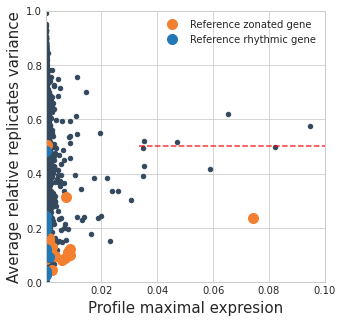

5058  genes remaining after filtering on replicates consistency


In [6]:
l_names = list(dic_itz.keys())
#compute list of variance per time condition and per zone condition and then average
l_var = np.array([ np.mean(np.nanvar([dic_itz[gene_name]['rep1'], dic_itz[gene_name]['rep2'],dic_itz[gene_name]['rep3']], axis = 0))/np.nanvar(np.vstack((dic_itz[gene_name]['rep1'], dic_itz[gene_name]['rep2'],dic_itz[gene_name]['rep3']))) for gene_name in l_names])
l_var = np.array([x if not np.isnan(x) else 10**-10 for x in l_var ])
l_exp_log = [invert_transform(np.nanmax(np.vstack((dic_itz[gene_name]['rep1'], dic_itz[gene_name]['rep2'],dic_itz[gene_name]['rep3']))))  for gene_name in l_names]
l_exp = [np.nanmax(np.vstack((dic_itz[gene_name]['rep1'], dic_itz[gene_name]['rep2'],dic_itz[gene_name]['rep3']))) for gene_name in l_names]

set_names_kept_2 = set()

#scatter plot
fig, ax = plt.subplots(figsize=(5,5))
plt.scatter(l_exp_log, l_var, s=20, alpha = 1, color = '#34495e')

#add reference genes
flag_c = True
flag_z = True
flag_u = True
for exp, var,  name in zip(l_exp_log, l_var, l_names):
    if name in l_zonated:
        if flag_z:
            plt.plot(exp, var, markersize = '20', marker = '.', lw = 0, color = "#F37F30", label = 'Reference zonated gene')
            flag_z = False
        else:
            plt.plot(exp, var, markersize = '20', marker = '.', lw = 0,color = "#F37F30")
    elif name in l_circadian:
        if flag_c:
            plt.plot(exp, var, markersize = '20', marker = '.', lw = 0,color = "#2178B4", label = 'Reference rhythmic gene')
            flag_c = False
        else:
            plt.plot(exp, var, markersize = '20', marker = '.', lw = 0,color = "#2178B4")
    if exp>10**-5 and var<0.5:
        set_names_kept_2.add(name)    
        

plt.xlim([10**-7,10**-1])
plt.ylim([0,1])
#plt.xscale('log', basex=10)
plt.xlabel('Profile maximal expresion', fontsize=15)
plt.ylabel('Average relative replicates variance', fontsize=15)
plt.legend()
plt.axhline(0.5, xmin = 0.335, ls='--', color = "red", alpha = 0.8)
plt.axvline(10**-5, ymax = 0.5, ls='--', color = "red", alpha = 0.8)
plt.savefig('Output/Filtering_consistency.pdf')
plt.show()

print(len(set_names_kept_2), ' genes remaining after filtering on replicates consistency')

## 2. Preliminary exploration of the data

Look at the expresssion in the dataset

TypeError: __init__() got an unexpected keyword argument 'basex'

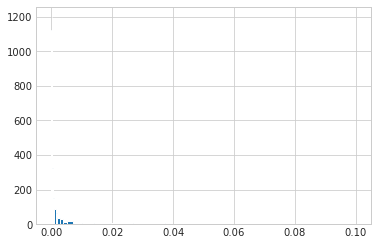

In [7]:
#plot the histogram of expression
l_exp = [ invert_transform(np.nanmax(np.vstack((dic_itz[gene_name]['rep1'], dic_itz[gene_name]['rep2'],dic_itz[gene_name]['rep3'])))) for gene_name in dic_itz]
plt.hist(l_exp, bins=np.logspace(-8,-1, 50))
plt.xscale('log', basex=10)
plt.xlabel('Maximal expresion')
plt.show()

Filter dataset

In [8]:
dic_itz_clean = {}
for name in set_names_kept_2:
    if 'mup' not in name and 'pisd' not in name:
        dic_itz_clean[name] = dic_itz[name]
l_names = list(dic_itz_clean.keys())

Plot the reference genes

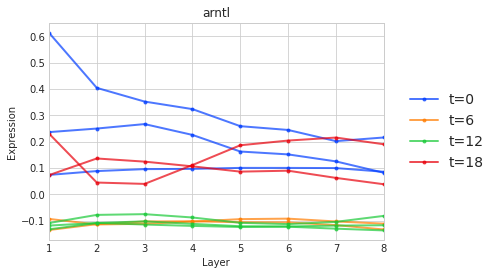

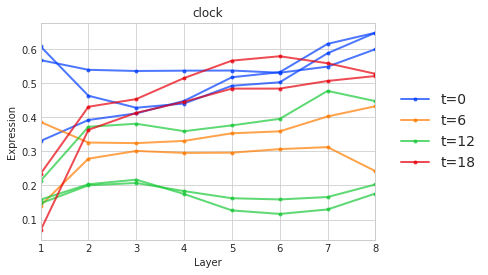

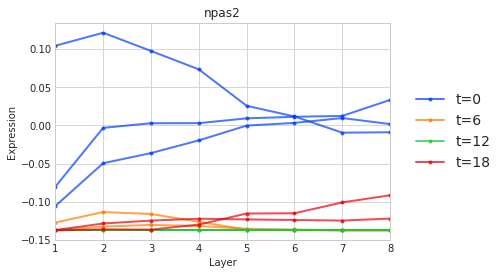

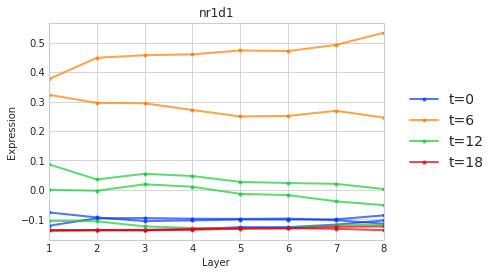

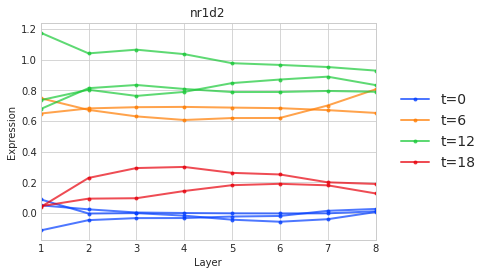

...

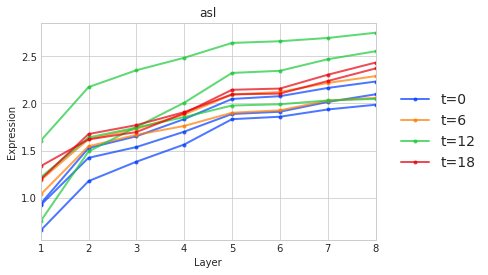

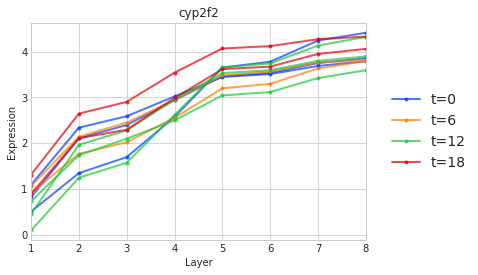

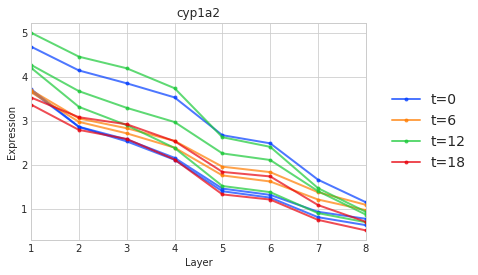

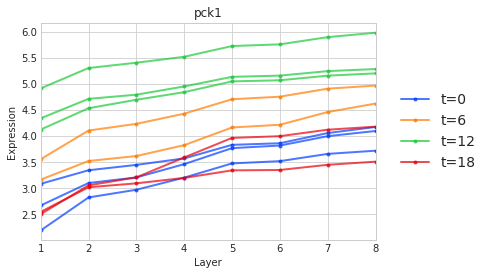

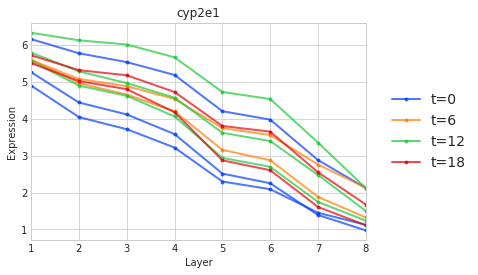

/Users/cdroin/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:4: MatplotlibDeprecationWarning:

Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.



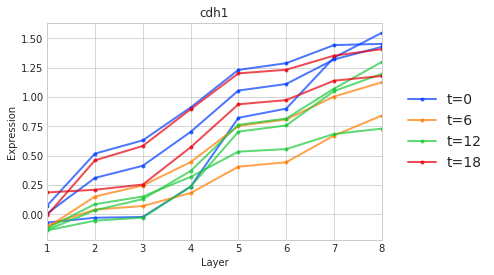

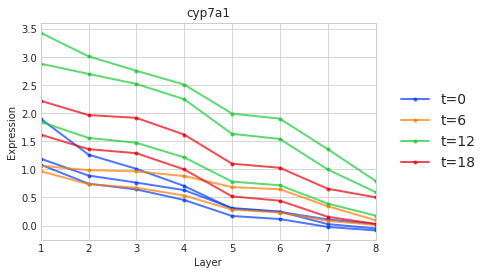

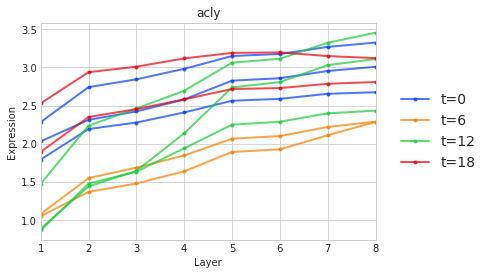

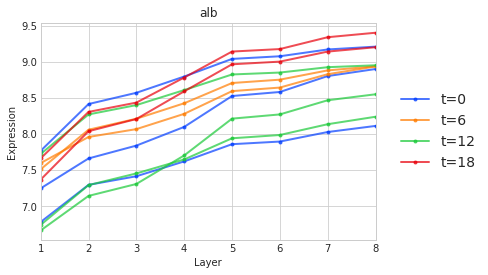

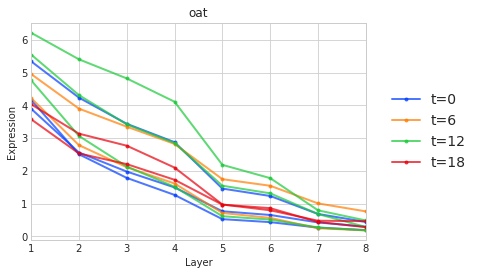

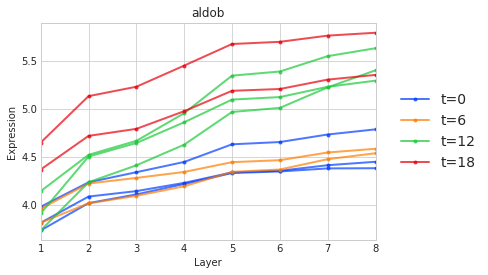

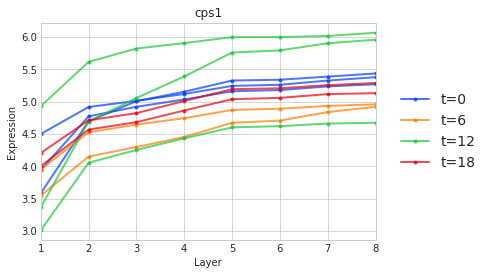

In [8]:
current_palette = sn.color_palette('bright')
def plot_gene_name(name_gene, dic_itz):
    #plt.figure(figsize=(5,5))
    ax = plt.subplot(111)
    for t in range(4):
        plt.plot(np.linspace(1,8,8, endpoint = True), dic_itz[name_gene]['rep1'][:,t], marker=".", label = 't='+str(t*6),  color = current_palette[t], lw = 2, alpha = 0.7)
        plt.plot(np.linspace(1,8,8, endpoint = True), dic_itz[name_gene]['rep2'][:,t],  marker=".",color = current_palette[t], lw = 2,  alpha = 0.7)
        plt.plot(np.linspace(1,8,8, endpoint = True), dic_itz[name_gene]['rep3'][:,t],  marker=".",color = current_palette[t], lw = 2, alpha = 0.7)
    plt.xlabel("Layer")
    plt.ylabel("Expression")
    plt.xlim([1,8])
    plt.legend()
    #ax.legend(loc='center left')
    plt.legend(bbox_to_anchor=(1.04, 0.5), loc='center left', fontsize=14)
    plt.title(str(name_gene))
    #plt.savefig('Output/'+str(name_gene)+'.pdf', facecolor = 'white')
    plt.show()
    plt.close()
    
for name_gene in l_circadian:
    try:
        plot_gene_name(name_gene, dic_itz_clean)
    except:
        pass
for name_gene in l_zonated:
    try:
        plot_gene_name(name_gene, dic_itz_clean)
    except:
        pass


Plot the spatial vs temporal variance

bug zonated


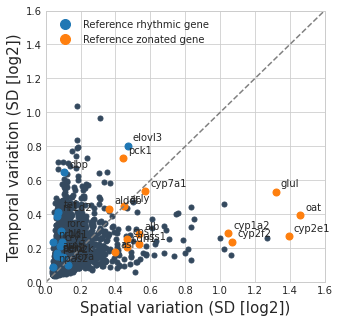

In [9]:
plt.figure(figsize=(5,5))

for idx_n, name in enumerate(dic_itz_clean):
    avg_data = np.nanmean( [dic_itz_clean[name]['rep1'],dic_itz_clean[name]['rep2'],dic_itz_clean[name]['rep3']], axis = 0)
    x = np.nanmean(np.nanvar(avg_data , axis= 0))**0.5 +2**-5 
    y = np.nanmean(np.nanvar(avg_data, axis =1))**0.5 +2**-5
    if idx_n==0:
        plt.plot(x, y, '.', color = '#34495e', markersize = 10, alpha = 1)#, label = 'Filtered profile')
    else:
        plt.plot(x, y, '.', color = '#34495e', markersize = 10, alpha = 1)

for name in l_circadian:
    try:
        avg_data = np.nanmean( [dic_itz_clean[name]['rep1'],dic_itz_clean[name]['rep2'],dic_itz_clean[name]['rep3']], axis = 0)
        x = np.nanmean(np.nanvar(avg_data , axis= 0))**0.5 +2**-5 
        y = np.nanmean(np.nanvar(avg_data, axis =1))**0.5 +2**-5
        plt.plot(x, y, marker = '.', markersize = 14, color = 'C0')
        plt.text(x+0.03, y+0.03, name)
    except:
        print("bug circadian")
for name in l_zonated:
    try:
        avg_data = np.nanmean( [dic_itz_clean[name]['rep1'],dic_itz_clean[name]['rep2'],dic_itz_clean[name]['rep3']], axis = 0)
        x = np.nanmean(np.nanvar(avg_data , axis= 0))**0.5 +2**-5 
        y = np.nanmean(np.nanvar(avg_data, axis =1))**0.5 +2**-5
        plt.plot(x, y, marker = '.', markersize = 14, color = 'C1')
        plt.text(x+0.03, y+0.03, name)
    except:
        print("bug zonated")

plt.plot(-100, -100,  color = 'C0', marker = '.', markersize = 20, lw=0, label = 'Reference rhythmic gene')
plt.plot(-100, -100,  color = 'C1', marker = '.', markersize = 20, lw =0, label = 'Reference zonated gene')

plt.plot([0,2.5], [0,2.5], '--', color = 'grey')
plt.legend()
plt.xlim([0,1.6])
plt.ylim([0,1.6])
plt.xlabel('Spatial variation (SD [log2])', fontsize=15)
plt.ylabel('Temporal variation (SD [log2])', fontsize=15)
plt.savefig('Output/SD_X_T.pdf')
plt.show()

Plot raw profiles without fit

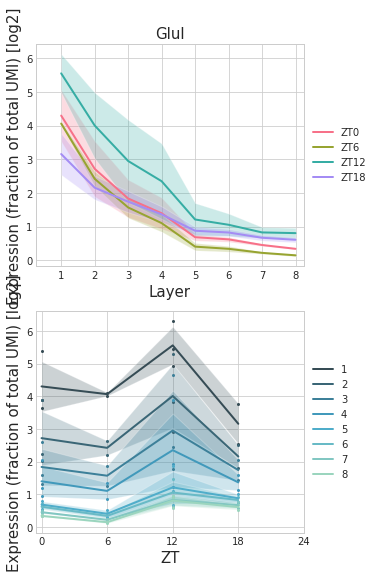

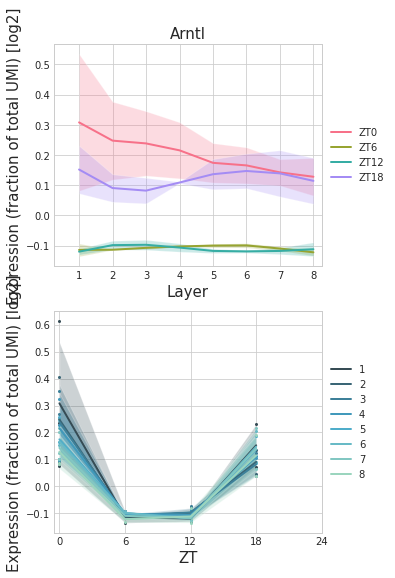

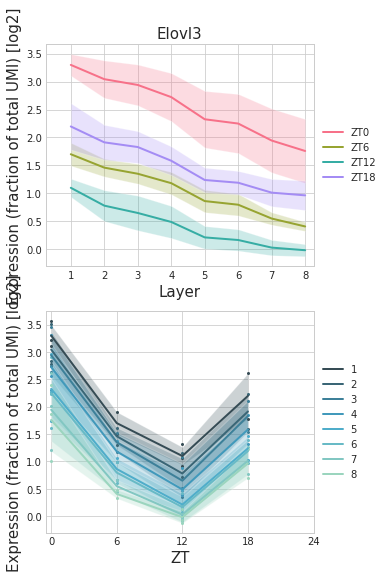

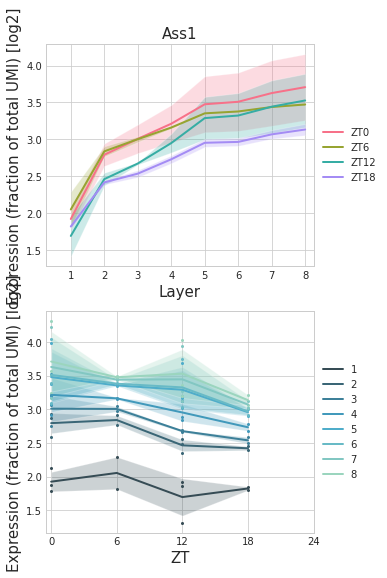

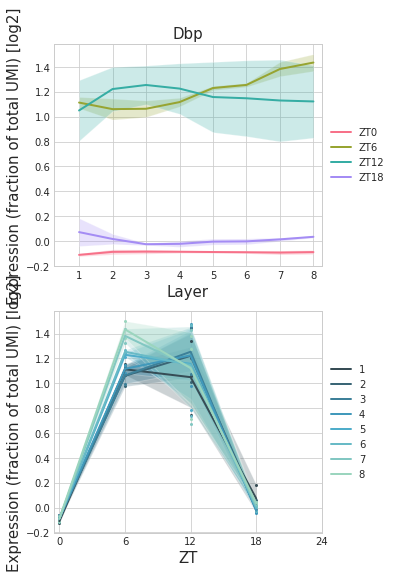

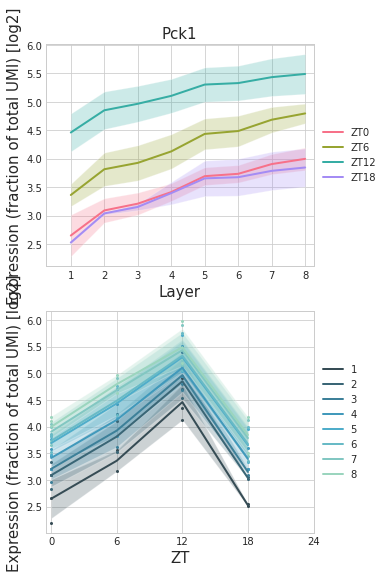

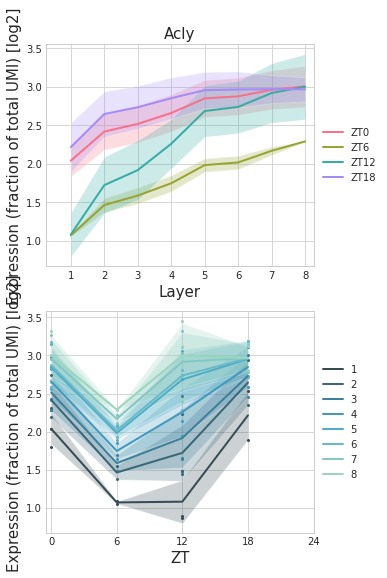

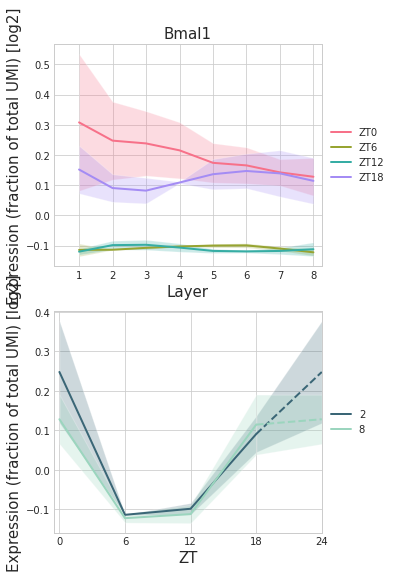

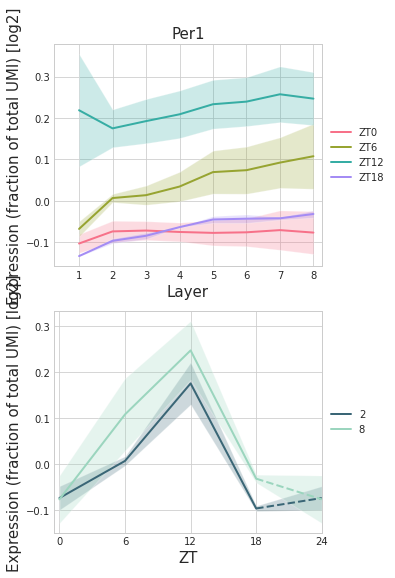

In [10]:
color1 = sn.color_palette("husl", 4) 
color2 = sn.color_palette("GnBu_d",8)
color3 = sn.color_palette("husl", 24)
def plot_gene_without_fit(name_gene, title = '', log = False, filter_layers = False):
    dic = dic_itz_raw
    if log:
        dic = dic_itz_clean
    f, (ax1, ax2) = plt.subplots(2, 1, figsize=(6,9))
    
    for t in range(4):
        #ax1.plot(np.linspace(1,8,8, endpoint = True), dic[name_gene]['rep1'][:,t], '.' ,   color = color1[t], markersize=4)
        #ax1.plot(np.linspace(1,8,8, endpoint = True), dic[name_gene]['rep2'][:,t], '.' ,  color = color1[t], markersize=4)
        #ax1.plot(np.linspace(1,8,8, endpoint = True), dic[name_gene]['rep3'][:,t],  '.' , color = color1[t], markersize=4)#, label = 't='+str(int(t*6)))
        pass
    
    #plot avg
    for t in range(4):
        avg = np.nanmean((dic[name_gene]['rep1'][:,t],dic[name_gene]['rep2'][:,t],dic[name_gene]['rep3'][:,t]), axis = 0)
        std = np.nanstd((dic[name_gene]['rep1'][:,t],dic[name_gene]['rep2'][:,t],dic[name_gene]['rep3'][:,t]), axis = 0)
        ax1.plot(np.linspace(1,8,8, endpoint = True), avg, label = 'ZT'+str(int(t*6)), color = color1[int(t)], lw = 2)
        ax1.fill_between(np.linspace(1,8,8, endpoint = True), avg+std, avg-std, facecolor=color1[int(t)], alpha=0.25)

    box = ax1.get_position()
    ax1.set_position([box.x0, box.y0, box.width * 0.8, box.height])
    # Put a legend to the right of the current axis
    ax1.legend(loc='center left', bbox_to_anchor=(1, 0.5))
    ax1.set_xlim([0.25,8.25])
    ax1.set_xticks([1,2,3,4,5,6,7,8])
    ax1.set_xlabel("Layer", fontsize=15)
    ax1.set_ylabel("Expression (fraction of total UMI)", fontsize=15)
    if log:
        ax1.set_ylabel("Expression (fraction of total UMI) [log2]", fontsize=15)
    ax1.set_title(title, fontsize=15) 
    
    for x in range(8):
        if filter_layers:
            if x==1 or x==7:
                #ax2.plot(np.linspace(0,18,4, endpoint = True), dic[name_gene]['rep1'][x,:], '.' ,   color = color2[x], markersize=4)
                #ax2.plot(np.linspace(0,18,4, endpoint = True), dic[name_gene]['rep2'][x,:], '.' ,  color = color2[x], markersize=4)
                #ax2.plot(np.linspace(0,18,4, endpoint = True), dic[name_gene]['rep3'][x,:],  '.' , color = color2[x], markersize=4)#, label = 'x='+str(x+1))
                pass
        else:
            ax2.plot(np.linspace(0,18,4, endpoint = True), dic[name_gene]['rep1'][x,:], '.' ,   color = color2[x], markersize=4)
            ax2.plot(np.linspace(0,18,4, endpoint = True), dic[name_gene]['rep2'][x,:], '.' ,  color = color2[x], markersize=4)
            ax2.plot(np.linspace(0,18,4, endpoint = True), dic[name_gene]['rep3'][x,:],  '.' , color = color2[x], markersize=4)#, label = 'x='+str(x+1))            
       
    for x in range(8):
        if filter_layers:
            if x==1 or x==7:
                avg = np.nanmean((dic[name_gene]['rep1'][x,:], dic[name_gene]['rep2'][x,:],dic[name_gene]['rep3'][x,:]), axis = 0)
                std = np.nanstd((dic[name_gene]['rep1'][x,:], dic[name_gene]['rep2'][x,:],dic[name_gene]['rep3'][x,:]), axis = 0)
                ax2.plot(np.linspace(0,18,4, endpoint = True), avg, label = ''+str(int((x+1))), color = color2[int(x)], lw = 2)
                ax2.fill_between(np.linspace(0,18,4, endpoint = True), avg+std, avg-std, facecolor=color2[int(x)], alpha=0.25)
                ax2.plot([18,24], [avg[-1],avg[0]], ls = '--', color = color2[int(x)], lw = 2)
                ax2.fill_between([18,24], [avg[-1]+std[-1],avg[0]+std[0]], [avg[-1]-std[-1],avg[0]-std[0]], facecolor=color2[int(x)], alpha=0.25)
        else:
            avg = np.nanmean((dic[name_gene]['rep1'][x,:], dic[name_gene]['rep2'][x,:],dic[name_gene]['rep3'][x,:]), axis = 0)
            std = np.nanstd((dic[name_gene]['rep1'][x,:], dic[name_gene]['rep2'][x,:],dic[name_gene]['rep3'][x,:]), axis = 0)
            ax2.plot(np.linspace(0,18,4, endpoint = True), avg, label = ''+str(int((x+1))), color = color2[int(x)], lw = 2)
            ax2.fill_between(np.linspace(0,18,4, endpoint = True), avg+std, avg-std, facecolor=color2[int(x)], alpha=0.25)
        
    #Shrink current axis by 10%
    box = ax2.get_position()
    ax2.set_position([box.x0, box.y0, box.width * 0.8, box.height])
    # Put a legend to the right of the current axis
    ax2.legend(loc='center left', bbox_to_anchor=(1, 0.5))
    #ax2.set_xlim([-0.5,18.5])
    ax2.set_xlim([-0.5,24])
    #ax2.set_xticks([0,6,12,18])
    ax2.set_xticks([0,6,12,18,24])
    ax2.set_xlabel("ZT", fontsize=15)
    ax2.set_ylabel("Expression (fraction of total UMI)", fontsize=15)
    if log:
        ax2.set_ylabel("Expression (fraction of total UMI) [log2]", fontsize=15)

    plt.savefig("Output/Fits/Raw_"+title+".pdf")
    plt.show()
    plt.close()
    
plot_gene_without_fit('glul', 'Glul', log = True)
plot_gene_without_fit('arntl', 'Arntl', log = True)
plot_gene_without_fit('elovl3', 'Elovl3', log = True)
plot_gene_without_fit('ass1', 'Ass1', log = True)
plot_gene_without_fit('dbp', 'Dbp', log = True)
plot_gene_without_fit('pck1', 'Pck1', log = True)
plot_gene_without_fit('acly', 'Acly', log = True)
plot_gene_without_fit('arntl', 'Bmal1', log = True, filter_layers = True)
plot_gene_without_fit('per1', 'Per1', log = True, filter_layers = True)


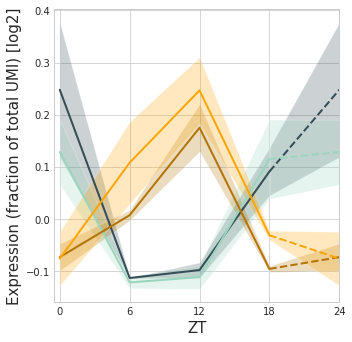

In [11]:
color1 = ['#344D56', 'grey', '#9AD5BD', '#b37400', '#ffa500']#sn.color_palette("husl", 4) 

def plot_2genes(name_gene1, name_gene2, title = '', log = False, filter_layers = False):
    dic = dic_itz_raw
    if log:
        dic = dic_itz_clean
        
    #f, (ax1, ax2) = plt.subplots(2, 1, figsize=(6,9))
    f, ax1 = plt.subplots(figsize=(5,5))

   
    for x in range(8):
        if filter_layers:
            if x==1 or x==7:
                if x==1:
                    color = color1[0]
                else:
                    color = color1[2]
                    
                name_gene = name_gene1
                avg = np.nanmean((dic[name_gene]['rep1'][x,:], dic[name_gene]['rep2'][x,:],dic[name_gene]['rep3'][x,:]), axis = 0)
                std = np.nanstd((dic[name_gene]['rep1'][x,:], dic[name_gene]['rep2'][x,:],dic[name_gene]['rep3'][x,:]), axis = 0)
                ax1.plot(np.linspace(0,18,4, endpoint = True), avg, label = ''+str(int((x+1))), color = color, lw = 2)
                ax1.fill_between(np.linspace(0,18,4, endpoint = True), avg+std, avg-std, facecolor=color, alpha=0.25)
                
                ax1.plot([18,24], [avg[-1],avg[0]], ls = '--', color = color, lw = 2)
                ax1.fill_between([18,24], [avg[-1]+std[-1],avg[0]+std[0]], [avg[-1]-std[-1],avg[0]-std[0]], facecolor=color, alpha=0.25)

    for x in range(8):
        if filter_layers:
            if x==1 or x==7:            
                if x==1:
                    color = color1[3]
                else:
                    color = color1[4]

                name_gene = name_gene2
                avg = np.nanmean((dic[name_gene]['rep1'][x,:], dic[name_gene]['rep2'][x,:],dic[name_gene]['rep3'][x,:]), axis = 0)
                std = np.nanstd((dic[name_gene]['rep1'][x,:], dic[name_gene]['rep2'][x,:],dic[name_gene]['rep3'][x,:]), axis = 0)
                ax1.plot(np.linspace(0,18,4, endpoint = True), avg, label = ''+str(int((x+1))), color = color, lw = 2)
                ax1.fill_between(np.linspace(0,18,4, endpoint = True), avg+std, avg-std, facecolor=color, alpha=0.25)
                ax1.plot([18,24], [avg[-1],avg[0]], ls = '--', color = color, lw = 2)
                ax1.fill_between([18,24], [avg[-1]+std[-1],avg[0]+std[0]], [avg[-1]-std[-1],avg[0]-std[0]], facecolor=color, alpha=0.25)                
                
    ax1.set_xlim([-0.5,24])
    #ax2.set_xticks([0,6,12,18])
    ax1.set_xticks([0,6,12,18,24])
    ax1.set_xlabel("ZT", fontsize=15)
    ax1.set_ylabel("Expression (fraction of total UMI)", fontsize=15)
    if log:
        ax1.set_ylabel("Expression (fraction of total UMI) [log2]", fontsize=15)
        #ax2.set_ylabel("Per1 expression (fraction of total UMI) [log2]", fontsize=15)
    #ax2.set_title(title+ ' (log data + fit)')

    plt.tight_layout()
    plt.savefig("Output/Fits/Raw_"+title+".pdf")
    plt.show()
    plt.close()

plot_2genes("arntl", "per1", title = 'Bmal1-Per1', log = True, filter_layers = True)

## 3. Do Mixed Model linear regression

First, create the functions needed for regression

In [9]:
np.seterr(divide='raise')
w = 2*np.pi/24

def return_explained_variance(Y, Y_pred, dic_re = None):    
    #get model prediction
    y_formatted = np.zeros((80,40))
    for idx, val in enumerate(Y_pred):
        y_formatted[int(idx/40), int(idx%40)] = val
        
    #convert into same format as Y
    Y_p = np.zeros((8,10))
    for x in range(8):
        for t in range(4):
            Y_p[x,t] = y_formatted[x*10,t*10]
            Y_p[x,4+t] = y_formatted[x*10,t*10]
            if t==0:
                Y_p[x,8] = y_formatted[x*10,t*10]
            elif t==2:
                Y_p[x,9] = y_formatted[x*10,t*10]
                
    if dic_re is not None:
        for x in range(8):
            for idx_t in range(10):
                Y_p[x,idx_t]+=dic_re[idx_t]
            
    #compute unexplained variance
    var_res = 0
    var_tot = 0
    mean = np.mean(Y)
    var_tot = np.sum( (np.array(Y)-mean)**2 )
    var_res = np.sum( (np.array(Y)-Y_p)**2 )
    if var_tot>0:    
        #return (1-var_res/var_tot)*var_tot
        return (var_tot-var_res)/80
    else:
        return 0.
    
    
def make_2D_regression(Y, predict, force_complete = False, formula = None, force_R = False):
    #get dic of design
    Xx, Xt, dic_lm, vect_structure = return_full_design_matrix(precise = False, replicates = True)
    #add response
    flat_Y = []
    for y in Y: #dim 8*(4*2)
        flat_Y.extend(y)
    flat_Y = np.array(flat_Y)
    dic_lm['y'] = flat_Y
    data = pd.DataFrame(dic_lm)

    l_formula = return_l_formula(force_complete = force_complete, formula = formula, force_R = force_R)
    model, selected, bic, l_schwartz, dic_re = select_model_last(data, vect_structure, l_formula )
    B = model._results.params
    SE = model._results.bse

    
    if predict:
        dic_par = {x+str(i) : 0 for i in range(3) for x in ['mu', 'a', 'b']}
        for par, val in zip(selected,B):
            dic_par[par] = val
        Xx_pred, Xt_pred, dic_lm_pred, vect_structure = return_full_design_matrix(precise = True, replicates = False)
        Y_pred = np.ones(len(Xx_pred)*len(Xt_pred)) * dic_par['mu0']
        for par in dic_lm_pred:
            Y_pred += dic_lm_pred[par] * dic_par[par]
            
        var_exp = return_explained_variance(Y, Y_pred)
        var_exp_re = return_explained_variance(Y, Y_pred, dic_re)
        return selected, B, SE, bic, l_schwartz, Xx_pred, Xt_pred, Y_pred, var_exp, var_exp_re
    else:
        return selected, B, SE, bic, l_schwartz


def return_full_design_matrix(precise = False, replicates = False):
    if precise:
        factor = 10
    else:
        factor = 1
    Xx = np.linspace(0,7,8*factor,endpoint = True)
    Xt =  np.linspace(0,24,4*factor,endpoint = False)
    Xt_rep3 =  np.linspace(0,24,2*factor,endpoint = False)
    if replicates:
        Xt = np.concatenate((Xt,Xt, Xt_rep3))
    X_space = []
    X_cos = []
    X_sin = []
    vect_structure = []
    for x in Xx:
        for idx_t, t in enumerate(Xt):
            X_space.append(x)
            X_cos.append(np.cos(w*t))
            X_sin.append(np.sin(w*t))
            vect_structure+=[idx_t]

    #convert everything into array
    X_space = np.array(X_space)
    X_cos = np.array(X_cos)
    X_sin = np.array(X_sin)
    vect_structure = np.array(vect_structure)

    dic_lm = {}
    for deg in range(3):
        if deg==0:
            dic_lm['a' + str(deg)] = X_space**deg*X_cos
            dic_lm['b' + str(deg)] = X_space**deg*X_sin
        if deg==1:
            dic_lm['a' + str(deg)] = X_space**deg*X_cos
            dic_lm['b' + str(deg)] = X_space**deg*X_sin
            dic_lm['mu' + str(deg)] = X_space*deg
        elif deg==2:
            dic_lm['a' + str(deg)] = 0.5*(3*X_space**deg-1)*X_cos
            dic_lm['b' + str(deg)] = 0.5*(3*X_space**deg-1)*X_sin
            dic_lm['mu' + str(deg)] = 0.5*(3*X_space**deg-1)

    return Xx, Xt, dic_lm, vect_structure

def return_l_formula(force_complete, formula = None, force_R = False):
    if formula is not None:
        return [formula]
    elif force_complete:
        l_formula = ['y ~ 1+a0+b0+a1+b1+a2+b2+mu1+mu2']
    elif force_R:
        l_formula = ['y ~ 1+a0+b0']
    else:
        
        l_formula = ['y ~ 1',
                    'y ~ 1+mu1',
                    'y ~ 1+mu2',
                    'y ~ 1+mu1+mu2',
                    'y ~ 1+a0+b0',
                    'y ~ 1+a0+b0+a1+b1',
                    'y ~ 1+a0+b0+mu1',
                    'y ~ 1+a0+b0+mu2',
                    'y ~ 1+a0+b0+mu1+mu2',
                    'y ~ 1+a0+b0+a1+b1+mu1',
                    'y ~ 1+a0+b0+a1+b1+mu2',
                    'y ~ 1+a0+b0+a1+b1+mu1+mu2',
                 
                    ]   
    return l_formula

def select_model_last(data, vect_structure, l_formula):
    if vect_structure is None:
        print('BUG, need vect_structure')
    #print('New gene')
    l_set = [ set( formula[6:].split('+')+['mu0']) for formula in l_formula]
    try:
        l_set[0].remove('')
    except:
        pass
    
    l_bic = []
    l_llf = []
    l_model = []
    l_re = []
    params = None

    for formula, set_f in zip(l_formula, l_set):
        model = MixedLM.from_formula(formula, data, re_formula='1', groups=vect_structure)
        model.sigma0 = 0.15
        model = model.fit(do_cg = True, reml = False, start_params = None, method='nm')
        llf = model.llf
        bic = -2*llf +1*np.log(10)+len(set_f)*np.log(80)
        l_bic.append(bic)
        l_llf.append(llf)
        l_re.append(model.random_effects)
        l_model.append(model)
    selected_model_idx = np.argmin(l_bic)
    min_bic = np.min(l_bic)

    #compute shwartz weights
    sum_diff = np.sum([np.exp(-0.5*(bic-min_bic)) for bic in l_bic])
    l_schwartz = [np.exp(-0.5*(bic-min_bic))/sum_diff for bic in l_bic]
    
    #select on shwartz weights
    l_schwartz_save = copy.copy(l_schwartz)
    
    #if several models have equivalent bic, keep the most complex model
    l_bic_unsorted = copy.copy(l_bic)
    l_bic, l_idx = zip(*sorted(zip(l_bic, list(range(len(l_bic)))), reverse = False))
    best_bic = l_bic[0]
    best_idx = l_idx[0]
    l_equivalent = []
    for bic,idx in zip(l_bic, l_idx):
        if abs((best_bic-bic)/best_bic)<0.01:
            best_bic = bic
            best_idx = idx
            l_equivalent.append(idx)
        else:
            break
            
    if len(l_equivalent)>1:
        #choose the model with the hightest number of parameters in l_equivalent
        l_num_parameters = [len(l_set[idx]) for idx in l_equivalent]
        l_equivalent_selected = [idx_model for idx_model, num_parameters in zip(l_equivalent, l_num_parameters) if num_parameters == np.max(l_num_parameters)]
        #choose the model with the lowest bic among those the most complex
        l_bic_equivalent = [l_bic_unsorted[idx_model] for idx_model in l_equivalent_selected]
        #print("corresponding bic list is: ", l_bic_equivalent)
        best_idx = l_equivalent_selected[np.argmin(l_bic_equivalent)]
        selected_model_idx = best_idx
    
    return l_model[selected_model_idx], ['mu0']+[x for x in l_formula[selected_model_idx][6:].split('+') if x!=''],\
            l_bic[selected_model_idx], l_schwartz_save, l_re[selected_model_idx]

Then, do the regressions and store the result in a dictionnary.

In [14]:
from tqdm import tqdm

In [14]:
def compute_regressions_mp(arg):
    print("compute")
    [name_gene, force_complete] = arg
    
    array_gene_time =np.concatenate( (dic_itz[name_gene]['rep1'], dic_itz[name_gene]['rep2'], dic_itz[name_gene]['rep3'][:,[0,2]]), axis = 1)
    selected, B, SE,  bic, l_schwartz, Xx_pred, Xt_pred, Y_pred, var_exp, var_exp_re = make_2D_regression(array_gene_time, predict = True, force_complete = force_complete)
    return [selected, B, SE, bic, l_schwartz, Xx_pred, Xt_pred, Y_pred, var_exp, var_exp_re]    

#l_names =  l_names[:100] ##kann angepasst werden für test 
dic_reg = {}
l_arg = [(x, False) for x in l_names]
n_cpu = 1   #muss angepasst werden 
warnings.simplefilter("ignore")
original_sigint_handler = signal.signal(signal.SIGINT, signal.SIG_IGN)
signal.signal(signal.SIGINT, original_sigint_handler)
pool = Pool(n_cpu)
print("test1")  ##extra
try:
    print("test2") ##extra
    results = pool.map(compute_regressions_mp, l_arg) ##tqdm?
    
except Exception as e: 
    print(e)
    print("BUG")
    pool.terminate()
else:
    print("Normal termination")
pool.close()
pool.join()
for name_gene, reg in zip(l_names, results):
    dic_reg[name_gene] = reg

test1
test2


KeyboardInterrupt: 

Make a few 3D plots to check that everything worked fine. First, define the function to plot in 3D.

In [14]:
def compute_figure_3D_tab_3(reg_2D, array_gene_time):
    selected, B, SE,  bic, l_schwartz, Xx_pred, Xt_pred, Y_pred, var_exp, var_exp_re = reg_2D
    y_formatted = np.zeros((80,40))
    for idx, val in enumerate(Y_pred):
        y_formatted[int(idx/40), int(idx%40)] = val

    #plot gene vs prediction
    x = [i for i in range(8) for j in range(4)]
    y = [j for i in range(8) for j in range(0,24,6)]
    z_1 = [array_gene_time[i][j] for i in range(8) for j in range(4)]
    z_2 = [array_gene_time[i][j] for i in range(8) for j in range(4,8)]
    array_gene_time = np.insert(array_gene_time, 9, np.nan, axis = 1)
    array_gene_time = np.insert(array_gene_time,11, np.nan, axis = 1)
    z_3 = [array_gene_time[i][j] for i in range(8) for j in range(8,12)]

    points_1 = go.Scatter3d( x = y, y = x, z = z_1 , name = "Experimental points", mode = 'markers',
                            marker=dict(color='rgb(37, 253, 233)', size=4, symbol='circle', line=dict( color='rgba(217, 217, 217, 0.14)',  width=1 ), opacity=0.8))
    points_2 = go.Scatter3d( x = y, y = x, z = z_2 , name = "Experimental points", mode = 'markers',
                            marker=dict(color='rgb(37, 253, 233)', size=4, symbol='circle', line=dict( color='rgba(217, 217, 217, 0.14)',  width=1 ), opacity=0.8))
    points_3 = go.Scatter3d( x = y, y = x, z = z_3 , name = "Experimental points", mode = 'markers',
                            marker=dict(color='rgb(37, 253, 233)', size=4, symbol='circle', line=dict( color='rgba(217, 217, 217, 0.14)',  width=1 ), opacity=0.8))
    fit = go.Surface( x = Xt_pred, y = Xx_pred, z = y_formatted , name = "Linear fit", opacity = 0.7, showscale = False, hoverinfo = 'none',)


    zoom_factor = 6.5
    camera = dict( up=dict(x=0, y=0, z=1), center=dict(x=0, y=0, z=0), eye=dict(x=0.25*zoom_factor, y=0.01*zoom_factor, z=0.02*zoom_factor))
    
    layout = go.Layout(
                        scene = dict(
                        xaxis = dict(title='Time (h)'),
                        yaxis = dict(title='Spatial position (layer)'),
                        zaxis = dict(title='Expression', type = 'linear'),
                        camera = camera,
                        aspectmode = 'manual',
                        aspectratio =dict(x = 1, y = 2, z = 0.5)
                        ),
                        title = '<b>Spatiotemporal representation</b>',
                        margin=dict(r=0, l=0, b=0, t=0),
                        #width=80%,
                        showlegend=False
                        )
    
    figure = go.Figure(data=[ fit, points_1, points_2, points_3], layout=layout)

    return figure

def compute_figure_3D_mpl(reg_2D, array_gene_time):
    selected, B, SE,  bic, l_schwartz, Xx_pred, Xt_pred, Y_pred, var_exp, var_exp_re = reg_2D
    y_formatted = np.zeros((80,40))
    for idx, val in enumerate(Y_pred):
        y_formatted[int(idx/40), int(idx%40)] = val

    #plot gene vs prediction
    x = [i for i in range(8) for j in range(4)]
    y = [j for i in range(8) for j in range(0,24,6)]
    z_1 = [array_gene_time[i][j] for i in range(8) for j in range(4)]
    z_2 = [array_gene_time[i][j] for i in range(8) for j in range(4,8)]
    array_gene_time = np.insert(array_gene_time, 9, np.nan, axis = 1)
    array_gene_time = np.insert(array_gene_time,11, np.nan, axis = 1)
    z_3 = [array_gene_time[i][j] for i in range(8) for j in range(8,12)]

    # Make the plot
    # Create light source object.
    ls = LightSource(azdeg=0, altdeg=65)
    fig = plt.figure(figsize = (20,10))
    ax = fig.gca(projection='3d')
    X, Y = np.meshgrid(Xt_pred, Xx_pred)
    ax.plot_surface(X, Y, y_formatted, cmap=plt.cm.YlOrRd, linewidth=0, edgecolor='none', alpha=0.8)
    
    ax.scatter(y, x, np.array(z_1), c="C1", alpha = 1)
    ax.scatter(y, x, np.array(z_2), c="C1", alpha = 1)
    ax.scatter(y, x, np.array(z_3), c="C1", alpha = 1)
    # Rotate it
    ax.view_init(30, 30)
    
    ax.set_ylabel("Layer")
    ax.set_xlabel("Time")
    ax.set_zlabel("Expression")
    plt.show()

Then plot a few genes, with not trivial models.

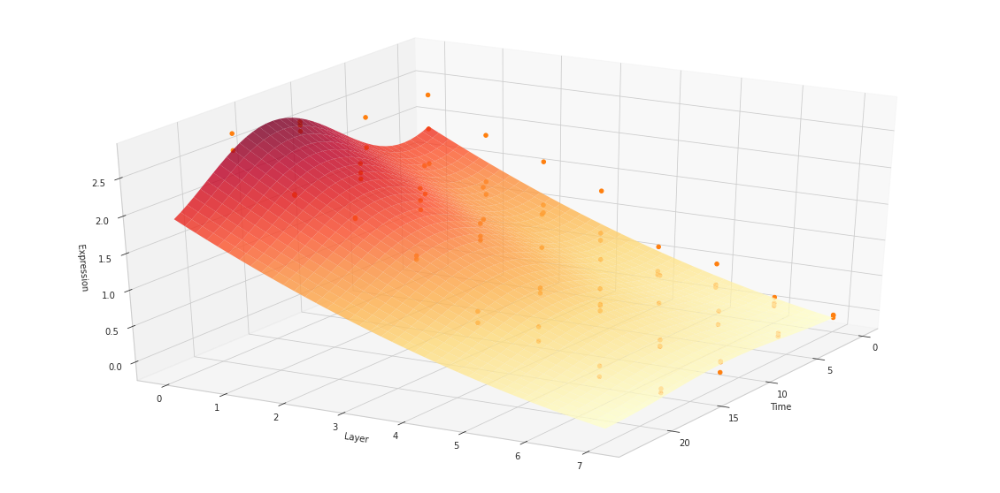

In [15]:
from mpl_toolkits.mplot3d import Axes3D
import plotly.io as pio
import time
from matplotlib.colors import LightSource

idx = 0
for name_gene, reg in dic_reg.items():
    if name_gene=="aldh3a2":
        [selected, B, SE, bic, l_schwartz, Xx_pred, Xt_pred, Y_pred, var_exp, var_exp_re] = reg
        if len(selected)>1:
            idx+=1
            array_gene_time =np.concatenate( (dic_itz[name_gene]['rep1'], dic_itz[name_gene]['rep2'], dic_itz[name_gene]['rep3'][:,[0,2]]), axis = 1)
            fig =compute_figure_3D_tab_3(reg, array_gene_time)
            iplot(fig)
            compute_figure_3D_mpl(reg, array_gene_time)

Look at the distribution of Schwartz weights for a few selected genes

tef


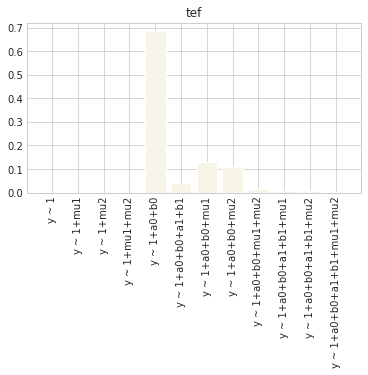

In [16]:
l_formula = return_l_formula(force_complete= False)
l_set = [ set( formula[6:].split('+')+['mu0']) for formula in l_formula]
l_set[0].remove('')

#for name_gene in l_names[:2]:
name_gene = 'tef'
l_score = dic_reg[name_gene][4]

#plot
print(name_gene)
height = l_score
bars = l_formula
color =['#F8F5E8']*len(l_score)
y_pos = np.arange(len(bars))
plt.bar(y_pos, height, color = color)
plt.xticks(y_pos, bars, rotation=90)
plt.subplots_adjust(bottom=0.4, top=0.99)
plt.title(name_gene)
plt.show()
plt.close()

## 4. Classify genes

First, create the functions needed for classification

In [17]:
def return_var_angle_amplitude(dic_param):
    """"""""""""""" Compute amplitude and angle deviation of a given model """""""""""""""
    X = np.arange(8)
    l_a = dic_param['a0'] + dic_param['a1']*X + dic_param['a2']*0.5*(3*X**2-1)
    l_b = dic_param['b0'] + dic_param['b1']*X + dic_param['b2']*0.5*(3*X**2-1)
    l_r = np.sqrt(l_a**2+l_b**2)
    l_angle = np.arctan2(l_b, l_a )
    l_angle = [angle for angle in l_angle if angle!=0]
    std_r =np.std(l_r)
    std_angle = scipy.stats.circstd(l_angle)
    return std_r, std_angle*24/(2*np.pi)
    
def compute_dic_cluster(dic_reg):
    """"""""""""""" Compute clusters of genes """""""""""""""
    dic_cluster = {'F' :[], 'Z' : [], 'R' : [], 'Z+R' : [],  'ZxR' : []}
    for name_gene in dic_reg:
        selected, B, SE, bic,l_schwartz, Xx_pred, Xt_pred, Y_pred, var_exp, var_exp_re = dic_reg[name_gene]
        set_selected = set(selected)
        if len(selected)==1:
            dic_cluster['F'].append(  (name_gene, selected, B,  bic, var_exp, var_exp_re)  )

        elif set_selected == set(['mu0', 'a0','b0']) or set_selected ==set(['mu0', 'a0']) or set_selected == set(['mu0', 'b0']):
            dic_cluster['R'].append( (name_gene, selected, B, bic, var_exp, var_exp_re)  )

        elif 'a0' not in selected and 'a1' not in selected and 'a2' not in selected and 'b0' not in selected and 'b1' not in selected and 'b2' not in selected:
            if 'mu1' in selected or 'mu2' in selected or 'mu3' in selected:
                dic_cluster['Z'].append(  (name_gene, selected, B, bic, var_exp, var_exp_re)  )
            else:
                print(selected)
                print('BUG in compute dic cluster')
        else:
            if 'a1' not in selected and 'a2' not in selected and 'b1' not in selected and 'b2' not in selected:
                dic_cluster['Z+R'].append([name_gene, selected, B, bic, var_exp, var_exp_re])
            else:
                dic_param = {'a0' : 0, 'a1' : 0, 'a2' : 0, 'b0' : 0, 'b1' : 0, 'b2' : 0, 'mu0' : 0, 'mu1' : 0, 'mu2' : 0}
                for name_par, par in zip(selected, B):
                    dic_param[name_par] = par
                std_r, std_angle = return_var_angle_amplitude(dic_param)
                dic_cluster['ZxR'].append([name_gene, selected, B, bic, var_exp, var_exp_re, std_r, std_angle])
            
        #sort all list per variance explained
        dic_cluster['F'] = sorted(dic_cluster['F'], key=operator.itemgetter(4), reverse=True)
        dic_cluster['Z'] = sorted(dic_cluster['Z'], key=operator.itemgetter(4), reverse=True)
        dic_cluster['R'] = sorted(dic_cluster['R'], key=operator.itemgetter(4), reverse=True)
        dic_cluster['Z+R'] = sorted(dic_cluster['Z+R'], key=operator.itemgetter(4), reverse=True)
        dic_cluster['ZxR'] = sorted(dic_cluster['ZxR'], key=operator.itemgetter(4), reverse=True)

    return dic_cluster

dic_cluster = compute_dic_cluster(dic_reg)

Define a function to plot the fits


In [18]:
cmap = matplotlib.cm.get_cmap('rainbow')
color = ['lightblue', 'coral','yellowgreen','pink']

def plot_gene_with_fit(name_gene, title = '', color = [cmap(x) for x in np.linspace(0,1,4,endpoint = True)], pp = None):
    #get model prediction
    selected, B, SE,  bic,  l_schwartz,Xx_pred, Xt_pred, Y_pred, var_exp, var_exp_re = dic_reg[name_gene]        
    y_formatted = np.zeros((80,40))
    for idx, val in enumerate(Y_pred):
        y_formatted[int(idx/40), int(idx%40)] = val
    
    #plot experimental points
    #plt.figure(figsize=(15,5))
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(15,5))
    for t in range(4):
        ax1.plot(np.linspace(0,7,8, endpoint = True), dic_itz[name_gene]['rep1'][:,t], 'o' ,   color = color[t], markersize=10)
        ax1.plot(np.linspace(0,7,8, endpoint = True), dic_itz[name_gene]['rep2'][:,t], 'v' ,  color = color[t], markersize=10)
        ax1.plot(np.linspace(0,7,8, endpoint = True), dic_itz[name_gene]['rep3'][:,t],  'p' , color = color[t], markersize=10)
    #plot fits
    for t in range(0,40,10):
        ax1.plot(np.linspace(0,7,80, endpoint = True), y_formatted[:,t], label = 't='+str(int(t*6/10)), color = color[int(t/10)], lw = 2)
    #ax.legend(loc='best')
    #Shrink current axis by 10%
    box = ax1.get_position()
    ax1.set_position([box.x0, box.y0, box.width * 0.8, box.height])
    # Put a legend to the right of the current axis
    ax1.legend(loc='center left', bbox_to_anchor=(1, 0.5))
    ax1.set_xlim([-0.5,7.5])
    ax1.set_xlabel("Layer")
    ax1.set_ylabel("Log2-Expression")
    ax1.set_title(title + ' (log data + fit)')   
    
    color = [cmap(x) for x in np.linspace(0,1,8,endpoint = True)]
    for x in range(8):
        ax2.plot(np.linspace(0,18,4, endpoint = True), dic_itz[name_gene]['rep1'][x,:], 'o' ,   color = color[x], markersize=10)
        ax2.plot(np.linspace(0,18,4, endpoint = True), dic_itz[name_gene]['rep2'][x,:], 'v' ,  color = color[x], markersize=10)
        ax2.plot(np.linspace(0,18,4, endpoint = True), dic_itz[name_gene]['rep3'][x,:],  'p' , color = color[x], markersize=10)
        
    for x in range(0,80,10):
        ax2.plot(np.linspace(0,24,40, endpoint = True), y_formatted[x,:], label = 'x='+str(int(x/10)), color = color[int(x/10)], lw = 2)
        
    #Shrink current axis by 10%
    box = ax2.get_position()
    ax2.set_position([box.x0, box.y0, box.width * 0.8, box.height])
    # Put a legend to the right of the current axis
    ax2.legend(loc='center left', bbox_to_anchor=(1, 0.5))
    ax2.set_xlim([-0.5,24])
    ax2.set_xlabel("Time")
    ax2.set_ylabel("Log2-Expression")
    ax2.set_title(title+ ' (log data + fit)')  
    

    if pp is not None:
        pp.savefig()
    else:
        plt.show()
    plt.close()
    
color1 = sn.color_palette("husl", 4) #['#3288BD', '#ABDDA4','#FDAE61','#D53E4F']
color2 = sn.color_palette("GnBu_d",8)#sn.color_palette("Reds",8)##['#D53E4F', '#F46D43','#FDAE61','#FEE08B', "#E6F598", "#ABDDA4", "#66C2A5", "#3288BD"]
color3 = sn.color_palette("husl", 24)
def plot_gene_with_fit_alt(name_gene, title = '', annotate_phase = False, force_R = 'False'):
    true_acrophase = None
    amplitude = None
    
    #get model prediction
    selected, B, SE,  bic,  l_schwartz,Xx_pred, Xt_pred, Y_pred, var_exp, var_exp_re = dic_reg[name_gene]
    if force_R:
        array_gene_time =np.concatenate( (dic_itz[name_gene]['rep1'], dic_itz[name_gene]['rep2'], dic_itz[name_gene]['rep3'][:,[0,2]]), axis = 1)
        selected, B, SE,  bic, l_schwartz, Xx_pred, Xt_pred, Y_pred, var_exp, var_exp_re = make_2D_regression(array_gene_time, predict = True, force_complete = False, force_R = True)        
        
    y_formatted = np.zeros((80,40))
    for idx, val in enumerate(Y_pred):
        y_formatted[int(idx/40), int(idx%40)] = val
    
    #plot experimental points
    #plt.figure(figsize=(15,5))
    f, (ax1, ax2) = plt.subplots(2, 1, figsize=(6,11))
    #f, (ax1, ax2) = plt.subplots(2, 1, figsize=(10,10))
    for t in range(4):
        ax1.plot(np.linspace(1,8,8, endpoint = True), dic_itz[name_gene]['rep1'][:,t], '.' ,   color = color1[t], markersize=10)
        ax1.plot(np.linspace(1,8,8, endpoint = True), dic_itz[name_gene]['rep2'][:,t], '.' ,  color = color1[t], markersize=10)
        ax1.plot(np.linspace(1,8,8, endpoint = True), dic_itz[name_gene]['rep3'][:,t],  '.' , color = color1[t], markersize=10)
    #plot fits
    for t in range(0,40,10):
        ax1.plot(np.linspace(1,8,80, endpoint = True), y_formatted[:,t], label = 't='+str(int(t*6/10)), color = color1[int(t/10)], lw = 2)
    #ax.legend(loc='best')
    #Shrink current axis by 10%
    box = ax1.get_position()
    ax1.set_position([box.x0, box.y0, box.width * 0.8, box.height])
    # Put a legend to the right of the current axis
    ax1.legend(loc='center left', bbox_to_anchor=(1, 0.5))
    ax1.set_xlim([0.25,8.25])
    ax1.set_xticks([1,2,3,4,5,6,7,8])
    ax1.set_xlabel("Layer", fontsize=15)
    ax1.set_ylabel("Log2-Expression", fontsize=15)
    ax1.set_title(title, fontsize=15) 
    
    for x in range(8):
        ax2.plot(np.linspace(0,18,4, endpoint = True), dic_itz[name_gene]['rep1'][x,:], '.' ,   color = color2[x], markersize=10)
        ax2.plot(np.linspace(0,18,4, endpoint = True), dic_itz[name_gene]['rep2'][x,:], '.' ,  color = color2[x], markersize=10)
        ax2.plot(np.linspace(0,18,4, endpoint = True), dic_itz[name_gene]['rep3'][x,:],  '.' , color = color2[x], markersize=10, label = 'x='+str(x+1) if annotate_phase else None)

    if not annotate_phase:
        for x in range(0,80,10):
            ax2.plot(np.linspace(0,24,40, endpoint = False), y_formatted[x,:], label = 'x='+str(int((x+10)/10)), color = color2[int(x/10)], lw = 2)
    else:
        for x in range(0,80,10):
            time_domain = np.linspace(0,24,40, endpoint = False)
            true_acrophase = time_domain[np.argmax(y_formatted[x,:])]
            acrophase = int(round(time_domain[np.argmax(y_formatted[x,:])]))
            max_val = np.max(y_formatted[x,:])
            min_val = np.min(y_formatted[x,:])
            amplitude = (max_val-min_val)/2
            text_pos = (acrophase+12)%24
            if text_pos>18:
                text_pos = 18
            elif text_pos <2:
                text_pos = 2
            ax2.plot(time_domain, y_formatted[x,:], color = color3[acrophase], lw = 2)
            ax2.annotate(r'$\phi: $'+ str(acrophase), (text_pos, max_val*1.1), fontsize = 20)
            break
        
    #Shrink current axis by 10%
    box = ax2.get_position()
    ax2.set_position([box.x0, box.y0, box.width * 0.8, box.height])
    # Put a legend to the right of the current axis
    ax2.legend(loc='center left', bbox_to_anchor=(1, 0.5))
    ax2.set_xlim([-2,24])
    ax2.set_xticks([0,6,12,18])
    ax2.set_xlabel("ZT", fontsize=15)
    ax2.set_ylabel("Log2-Expression", fontsize=15)
    #ax2.set_title(title+ ' (log data + fit)') 
    #plt.tight_layout()
    plt.savefig("Output/Fits/"+title+".pdf")
    plt.show()
    plt.close()
    
    return amplitude, true_acrophase

Plot some examples of each category

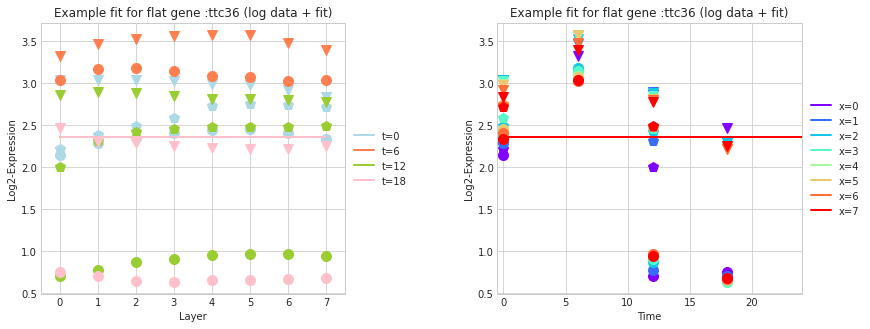

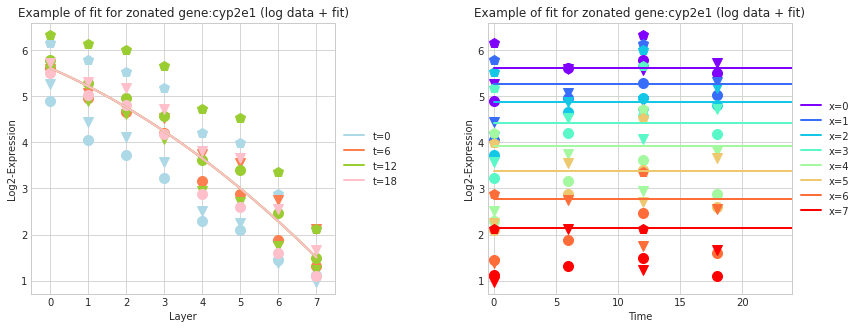

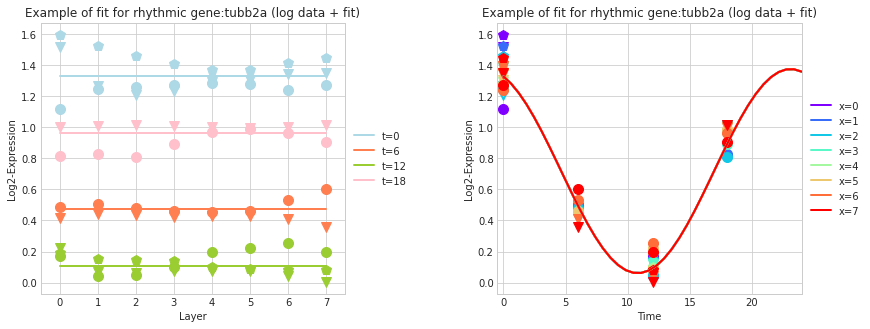

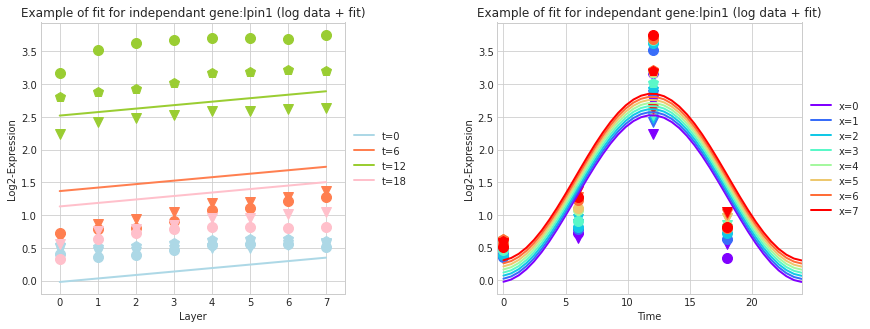

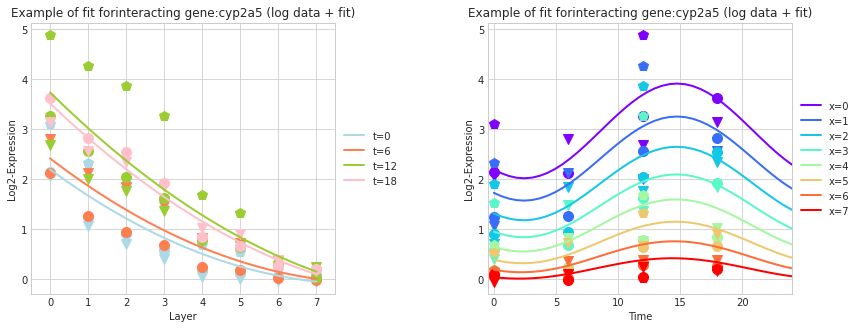

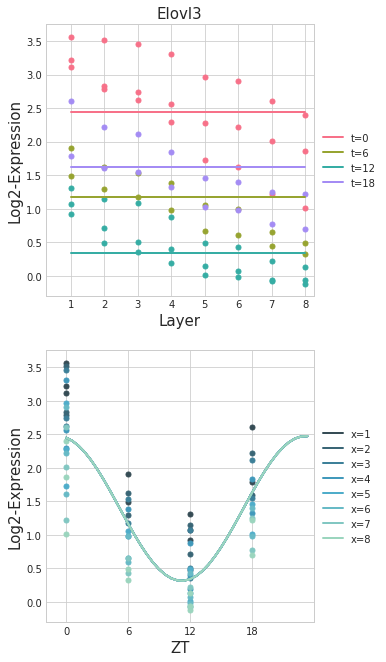

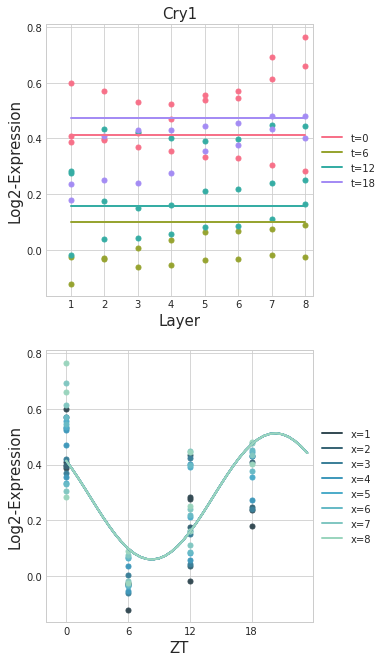

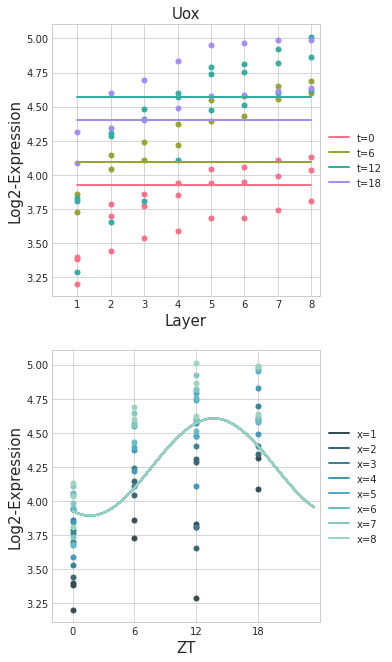

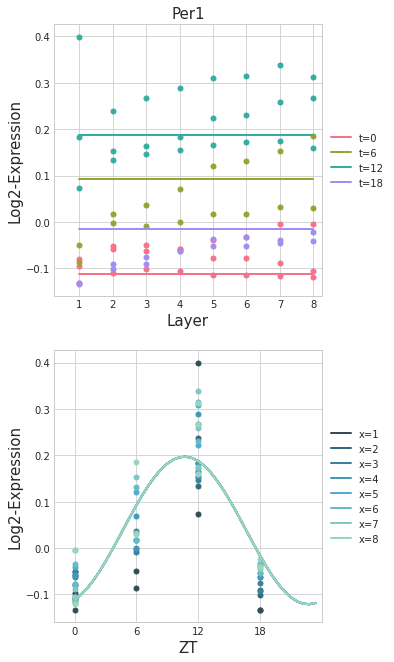

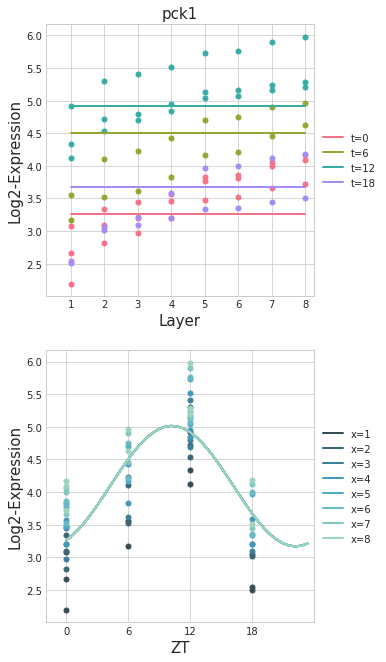

(None, None)

In [19]:
#get example of flat gene
best_flat = dic_cluster['F'][0][0]
plot_gene_with_fit(best_flat, title = 'Example fit for flat gene :' + best_flat, color = color)

#get example of zonated gene
best_zonated = dic_cluster['Z'][1][0]
plot_gene_with_fit(best_zonated, title = 'Example of fit for zonated gene:' + best_zonated, color = color)

#get example of rhythmic gene
best_rhythmic = dic_cluster['R'][2][0]
plot_gene_with_fit(best_rhythmic, title = 'Example of fit for rhythmic gene:' + best_rhythmic, color = color)

#get example of zonated-rhythmic gene
best_independant = dic_cluster['Z+R'][0][0]
plot_gene_with_fit(best_independant, title = 'Example of fit for independant gene:' + best_independant, color = color)

#get example of zonated-rhythmic gene
best_zxr = dic_cluster['ZxR'][0][0]
plot_gene_with_fit(best_zxr, title = 'Example of fit forinteracting gene:' + best_zxr, color = color)

#plot clock genes
plot_gene_with_fit_alt("elovl3", title = "Elovl3", annotate_phase = False)

plot_gene_with_fit_alt("cry1", title = "Cry1", annotate_phase = False)

plot_gene_with_fit_alt("uox", title = "Uox", annotate_phase = False)

plot_gene_with_fit_alt("per1", title = "Per1", annotate_phase = False)

plot_gene_with_fit_alt("pck1", title = "pck1", annotate_phase = False)

Output a xlxs file with all the genes and parameters

In [20]:
def return_relative_rep_variance(array_gene_1, array_gene_2, array_gene_3):
    var = np.mean(np.nanvar([array_gene_1, array_gene_2,array_gene_3], axis = 0))/np.nanvar(np.vstack((array_gene_1, array_gene_2,array_gene_3)))
    return var

def return_str_list_param(l_param, b_sorted = False):
    str_p = ''
    if b_sorted:
        l_param = sorted(l_param)
    for param in l_param:
        if len(param)>3:
            p1, p2 = param.split('+')
            str_p += p1 + ', ' + p2+ ', '
        else:
            str_p += param + ', '
    return str_p[:-2]
    
def l_dic_to_xlsx(workbook, name_sheet, l_dic, supp):
    worksheet = workbook.add_worksheet(name_sheet)
    red = workbook.add_format({'bg_color': '#FFC7CE'})
    white = workbook.add_format({'bg_color': '#FFFFFF'})
    cell_format = workbook.add_format()
    cell_format.set_bold()
        
    l_par = ['mu0','mu1','mu2','a0','a1', 'b0', 'b1']

    for i, key in enumerate(['Name'] + l_par + ['Amplitude spread [log2]', 
                                                'Phase spread [h]', 
                                                'Average expression [fraction UMI/cell]', 
                                                'Average transformed expression [log2]', 
                                                'Total variance [log2]',
                                                'Explained variance (fixed effect/datapoint) [log2]',
                                                'Explained variance (fixed and random effect/datapoint) [log2]',
                                                'Relative explained variance (fixed effect) [%]']
                                                ):
        worksheet.write(0, i, key, cell_format)
   
    for i, dic_gene in enumerate(l_dic):                
            #try:  
            worksheet.write(i+1, 0, dic_gene['Name'])

            selected = dic_gene['Parameters'].replace(" ", "").split(',')
            B = dic_gene['value_parameters']
            dic_par = {x : 0 for x in l_par}
            #print(selected, B)
            for par, val in zip(selected,B):
                dic_par[par] = val
            for j, par_name in enumerate(l_par):
                worksheet.write(i+1, j+1, '{:.4f}'.format(dic_par[par_name]))
                
            if supp:
                worksheet.write(i+1, 1+len(l_par), '{:.4f}'.format(dic_gene['Amplitude spread']))
                worksheet.write(i+1, 1+len(l_par)+1, '{:.4f}'.format(dic_gene['Angle spread']))
            else:
                worksheet.write(i+1, 1+len(l_par), 0)
                worksheet.write(i+1, 1+len(l_par)+1, 0)       
                
            profile = dic_itz[dic_gene['Name']]
            avg_exp = np.nanmean(np.vstack((profile['rep1'], profile['rep2'],profile['rep3'])))
            avg_exp_t = np.nanmean(invert_transform(np.vstack((profile['rep1'], profile['rep2'],profile['rep3']))))
            worksheet.write(i+1, 1+len(l_par)+1+1, '{:.4e}'.format(avg_exp_t))
            worksheet.write(i+1, 1+len(l_par)+1+1+1, '{:.4f}'.format(avg_exp))

            #var_rep = return_relative_rep_variance(profile['rep1'], profile['rep2'], profile['rep3'])
            profile =  np.vstack((profile['rep1'], profile['rep2'],profile['rep3']))
            SCE = np.nansum((profile-np.nanmean(profile))**2)
            worksheet.write(i+1, 1+len(l_par)+1+1+1+1, '{:.4f}'.format(SCE/80))
            worksheet.write(i+1, 1+len(l_par)+1+1+1+1+1, '{:.4f}'.format(dic_gene['var']))
            worksheet.write(i+1, 1+len(l_par)+1+1+1+1+1+1, '{:.4f}'.format(dic_gene['var_re']))
            worksheet.write(i+1, 1+len(l_par)+1+1+1+1+1+1+1, '{:.4f}'.format(dic_gene['var']/(SCE/80)))
    return workbook
            
def schwartz_to_xlsx(workbook, name_sheet, dic):
    worksheet = workbook.add_worksheet(name_sheet)
    
    for i, key in enumerate(['Name'] + l_formula):#,' P(F)', 'P(Z)', 'P(R)', 'P(Z+R)','P(ZxR)' ]):
        worksheet.write(0, i, key)
        
    l_names_sorted = sorted(l_names) 
    for i, name_gene in enumerate(l_names_sorted):
        selected, B, SE, bic,  l_schwartz, Xx_pred, Xt_pred, Y_pred, var_exp, var_exp_re = dic_reg[name_gene]
        l_schwartz = np.array(l_schwartz)/np.sum(l_schwartz)
        worksheet.write(i+1, 0, name_gene)
        pal = sn.color_palette("Greens",10).as_hex()
        for j, s in enumerate(l_schwartz):
            cell_format = workbook.add_format()
            #cell_format.set_font_color('#0000FF')
            cell_format.set_bg_color(pal[int(round(s*9))])
            worksheet.write(i+1, j+1, '{:.3f}'.format(s), cell_format)
    return workbook

def write_analysis_to_file(dic_res_analysis):
    workbook = xlsxwriter.Workbook('Output/Result_analysis.xlsx')
    workbook = l_dic_to_xlsx(workbook, "F", dic_res_analysis['F'], supp = False)
    workbook = l_dic_to_xlsx(workbook, "Z", dic_res_analysis['Z'], supp = False)
    workbook = l_dic_to_xlsx(workbook, "R", dic_res_analysis['R'], supp = False)
    workbook = l_dic_to_xlsx(workbook, "Z+R", dic_res_analysis['Z+R'], supp = False) 
    workbook = l_dic_to_xlsx(workbook, "ZxR", dic_res_analysis['ZxR'] , supp = True)  
    workbook.close()

def compute_dic_res_analysis(dic_itz, dic_cluster):
    """"""""""""""" Compute tables of clusters """""""""""""""
    
    rows_F = [{'Name' : name_gene, 'Parameters' : return_str_list_param(selected), 'value_parameters' : list(B),  'BIC' : bic, 'var': var_exp, 'var_re': var_exp_re } for (name_gene, selected, B,  bic, var_exp, var_exp_re) in dic_cluster['F']]
    rows_R = [{'Name' : name_gene, 'Parameters' : return_str_list_param(selected), 'value_parameters' : list(B),  'BIC' : bic, 'var': var_exp, 'var_re': var_exp_re  } for (name_gene, selected, B,  bic, var_exp, var_exp_re) in dic_cluster['R']]
    rows_Z = [{'Name' : name_gene, 'Parameters' : return_str_list_param(selected), 'value_parameters' : list(B),  'BIC' : bic, 'var': var_exp, 'var_re': var_exp_re } for (name_gene, selected, B,  bic, var_exp, var_exp_re) in dic_cluster['Z']]
    rows_ZR = [{'Name' : name_gene, 'Parameters' : return_str_list_param(selected), 'value_parameters' : list(B), 'BIC' : bic, 'var': var_exp, 'var_re': var_exp_re } for (name_gene, selected, B, bic, var_exp, var_exp_re) in dic_cluster['Z+R']]
    rows_ZxR = [{'Name' : name_gene, 'Parameters' : return_str_list_param(selected), 'value_parameters' : list(B), 'BIC' : bic, 'var': var_exp, 'var_re': var_exp_re , 'Amplitude spread' : std_r, 'Angle spread' :  std_angle}
                            for (name_gene, selected, B, bic, var_exp, var_exp_re,std_r, std_angle) in dic_cluster['ZxR']]

    dic_res_analysis = {'ZxR' : rows_ZxR,
                        'Z+R' : rows_ZR,
                        'Z' : rows_Z,
                        'R' : rows_R,
                        'F' : rows_F,
                         }
    return dic_res_analysis

dic_res_analysis = compute_dic_res_analysis(dic_itz_clean, dic_cluster)
write_analysis_to_file(dic_res_analysis)

In [21]:
#separate table for BIC scores
workbook = xlsxwriter.Workbook('Output/weights.xlsx')
workbook = schwartz_to_xlsx(workbook, "schwartz_weights", dic_reg) 
workbook.close()

Make a barplot to sum up all the categories

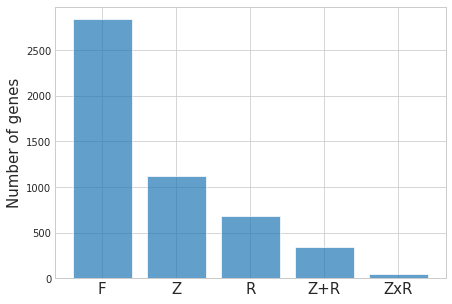

In [22]:
#compute the number of genes who pass the flag by category
flag =10000
x = ['F', 'Z', 'R', 'Z+R', 'ZxR']
y = [len([l for l in dic_cluster[type_c] if l[5]<flag*l[4]]) for type_c in x]
y[0]+=np.sum([len([l for l in dic_cluster[type_c] if l[5]>=flag*l[4]]) for type_c in x])

y = y#/np.sum(y)
plt.figure(figsize=(7,5))
y_pos = np.arange(len(x))
plt.bar(y_pos, y, align='center', alpha=0.7)
plt.xticks(y_pos, x, fontsize=15)
plt.ylabel('Number of genes', fontsize=15)
#plt.title('Number of genes', fontsize=15)
plt.savefig('Output/Sum_up_categories.pdf')
plt.show()
plt.close()

Compute mean expression and fold change per category

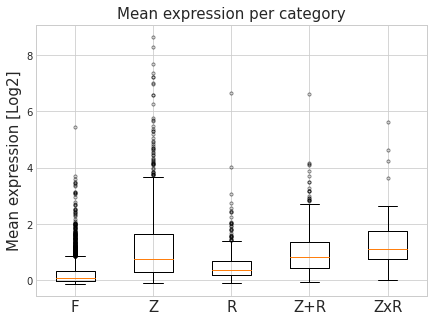

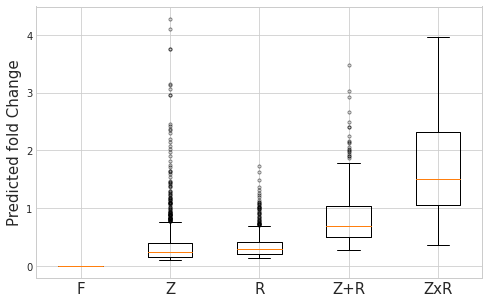

In [23]:
x = ['F', 'Z', 'R', 'Z+R', 'ZxR']
l_distr_exp = []
l_distr_fold_change = []
for cat in x:
    l_prof = [np.vstack((dic_itz[ l_cl[0] ]['rep1'],dic_itz[ l_cl[0] ]['rep2'], dic_itz[ l_cl[0] ]['rep3'])) for l_cl in dic_cluster[cat] ]
    l_distr_exp.append( [np.nanmean(prof) for prof in l_prof  ] )
    l_names_rhythmic = [l[0] for l in dic_cluster[cat]]
    l_amp = []
    l_theta = []
    X = np.arange(8)
    l_fold_change = []
    for name in l_names_rhythmic :
        try:
            selected, B, SE, bic, l_s, Xx_pred, Xt_pred, Y_pred, var_exp, var_exp_re = dic_reg[name]        
            l_fold_change.append(np.max(Y_pred)-np.min(Y_pred))
        except:
            pass
    l_distr_fold_change.append( l_fold_change )

fig = plt.figure(figsize=(7,5))
ax = fig.add_subplot(111)
bp = plt.boxplot(l_distr_exp)
ax.set_xticklabels(x, fontsize=15)

## change the style of fliers and their fill
for flier in bp['fliers']:
    flier.set(marker='.', color='#e7298a', alpha=0.5)
    
plt.ylabel('Mean expression [Log2]', fontsize=15)
plt.title('Mean expression per category', fontsize=15)
plt.savefig('Output/Mean_exp.pdf')
plt.show()
plt.close()

fig = plt.figure(figsize=(8,5))
ax = fig.add_subplot(111)
bp = plt.boxplot(l_distr_fold_change)
ax.set_xticklabels(x, fontsize=15)

## change the style of fliers and their fill
for flier in bp['fliers']:
    flier.set(marker='.', color='#e7298a', alpha=0.5)
    
plt.ylabel('Predicted fold Change', fontsize=15)
#plt.title('Fold change per category', fontsize=15)
plt.savefig('Output/Fold_change.pdf')
plt.show()
plt.close()

Compute proportion of central and portal genes in Z and Z+R

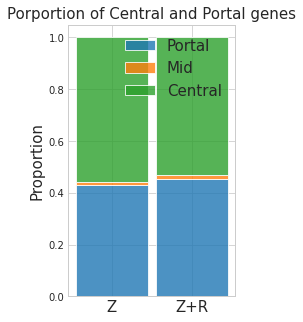

Ks_2sampResult(statistic=0.02746709936988447, pvalue=0.9842951752513711)


In [24]:
x = ['Z', 'Z+R']
l_distr_exp = []
l_distr_fold_change = []

count_portal_Z = 0
count_mid_Z = 0
count_central_Z = 0

count_portal_ZR = 0
count_mid_ZR = 0
count_central_ZR = 0

for cat in x:
    l_prof = [np.nanmean((dic_itz[ l_cl[0] ]['rep1'],dic_itz[ l_cl[0] ]['rep2'], dic_itz[ l_cl[0] ]['rep3']), axis = 0) for l_cl in dic_cluster[cat] ]
    #l_prof_avg = [np.nanmean(prof,axis = 1) for prof in l_prof]
    l_names = [l[0] for l in dic_cluster[cat]]
    l_prof_avg = []
    for name in l_names:
        try:
            selected, B, SE, bic, l_s, Xx_pred, Xt_pred, Y_pred, var_exp, var_exp_re = dic_reg[name]  
            y_formatted = np.zeros((80,40))
            for idx, val in enumerate(Y_pred):
                y_formatted[int(idx/40), int(idx%40)] = val
            l_prof_avg.append(np.nanmean(y_formatted, axis = 1))
        except:
            pass

    l_max_layer = [np.argmax(prof_avg) for prof_avg in l_prof_avg]
    for max_layer in l_max_layer:
        if cat=="Z":
            if max_layer>=60:
                count_portal_Z+=1
            elif max_layer>=20:
                count_mid_Z+=1
            else:
                count_central_Z+=1
        elif cat=="Z+R":
            if max_layer>=60:
                count_portal_ZR+=1
            elif max_layer>=20:
                count_mid_ZR+=1
            else:
                count_central_ZR+=1
        else:
            print("BUG")

tot_Z = count_portal_Z+count_mid_Z+count_central_Z
count_portal_Z_norm = count_portal_Z/tot_Z
count_mid_Z_norm = count_mid_Z/tot_Z
count_central_Z_norm = count_central_Z/tot_Z

tot_ZR = count_portal_ZR+count_mid_ZR+count_central_ZR
count_portal_ZR_norm = count_portal_ZR/tot_ZR
count_mid_ZR_norm = count_mid_ZR/tot_ZR
count_central_ZR_norm = count_central_ZR/tot_ZR
    
plt.figure(figsize=(3,5))

width = 0.3 
y_pos = np.arange(len(x))/3

bar_portal = [count_portal_Z_norm, count_portal_ZR_norm]
bar_mid = [count_mid_Z_norm, count_mid_ZR_norm]
bar_central = [count_central_Z_norm, count_central_ZR_norm]

p1 = plt.bar(y_pos,bar_portal, width, alpha=0.8)
p2 = plt.bar(y_pos, bar_mid, width, bottom = bar_portal, alpha=0.8)
p3 = plt.bar(y_pos, bar_central, width, bottom = np.array(bar_portal)+np.array(bar_mid), alpha=0.8)

plt.ylabel('Proportion', fontsize=15)
plt.title('Porportion of Central and Portal genes', fontsize=15)
plt.xticks(y_pos, ('Z', 'Z+R'), fontsize=15)
#plt.yticks(np.arange(0, 81, 10))
plt.legend((p1[0], p2[0],p3[0] ), ('Portal', 'Mid', "Central"), fontsize=15)
plt.savefig('Output/Central_Portal.pdf')
plt.show()

print(scipy.stats.ks_2samp([0]*int(count_portal_Z)+[1]*int(count_mid_Z)+[2]*int(count_central_Z), 
                     [0]*int(count_portal_ZR)+[1]*int(count_mid_ZR)+[2]*int(count_central_ZR)))

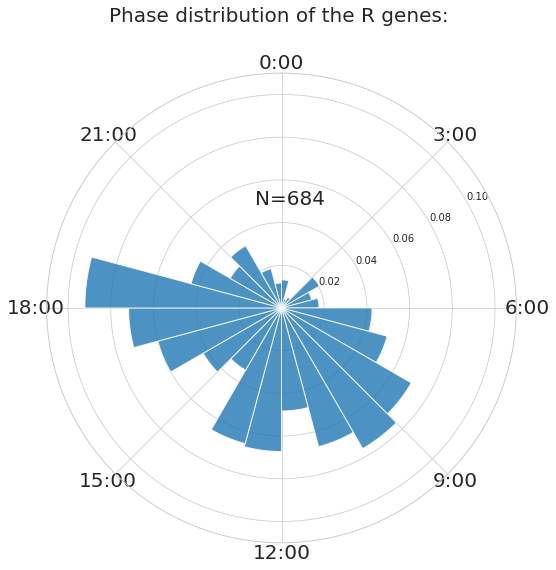

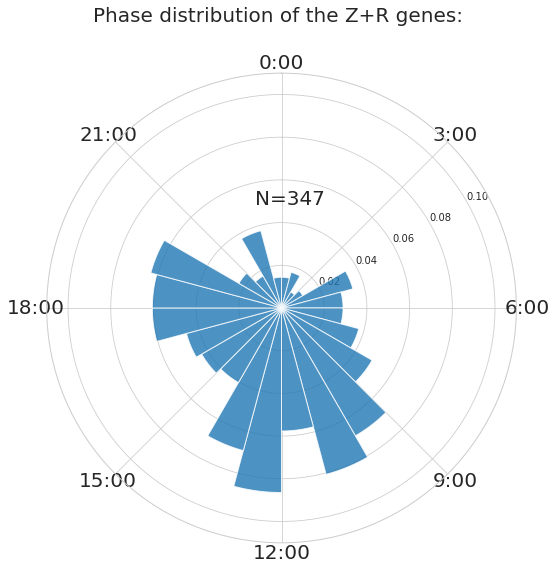

PV (from R) = 0.7742414


In [25]:
def compare_phase(dic_cluster_x, cat):
    l_names_rhythmic = [l[0] for l in dic_cluster_x[cat]]
    l_amp = []
    l_theta = []
    X = np.arange(8)
    for name in l_names_rhythmic :
        selected, B, SE, bic, l_s, Xx_pred, Xt_pred, Y_pred, var_exp, var_exp_re = dic_reg[name]
        l_theta.append(np.arctan2(B[2],B[1])%(2*np.pi))

    #more classical plot
    N = 25
    bottom = 0

    # create theta for 24 hours
    theta = np.linspace(0.0, 2 * np.pi, N, endpoint=True)

    # make the histogram that bined on 24 hour
    radii_1, tick_1 = np.histogram(l_theta, bins = theta)

    #normalze
    radii_1=radii_1/np.sum(radii_1)
    
    # width of each bin on the plot
    width = (2*np.pi) / (N-1)

    # make a polar plot
    plt.figure(figsize = (8, 8))
    ax = plt.subplot(111, polar=True)
    bars = ax.bar((theta[1:]+theta[:-1])/2, radii_1, width=width, bottom=bottom, alpha = 0.8)
    plt.text(-0.25,0.05, "N="+str(len(l_names_rhythmic)), fontsize=20)
    # set the lable go clockwise and start from the top
    ax.set_theta_zero_location("N")
    # clockwise
    ax.set_theta_direction(-1)
    ax.set_rlabel_position(60)  # get radial labels away from plotted line
    ax.set_ylim([0,0.11])
    # set the label
    ticks = ['0:00', '3:00', '6:00', '9:00', '12:00', '15:00', '18:00', '21:00']
    ax.set_xticklabels(ticks, fontsize=20)
    plt.title("Phase distribution of the " + cat+" genes: "+ "\n", fontsize=20)
    plt.tight_layout()
    plt.savefig('Output/Comparison_phases_'+cat+'.pdf')
    plt.show()
    plt.close()

    return radii_1
    
radii_1 = compare_phase(dic_cluster, "R")
radii_1bis = compare_phase(dic_cluster, "Z+R")

print("PV (from R) = 0.7742414")

Scatter plot of amplitude vs slope for Z+R

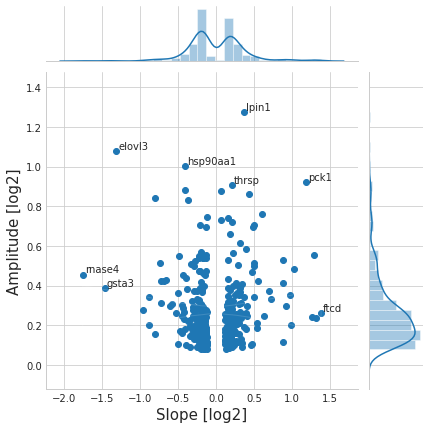

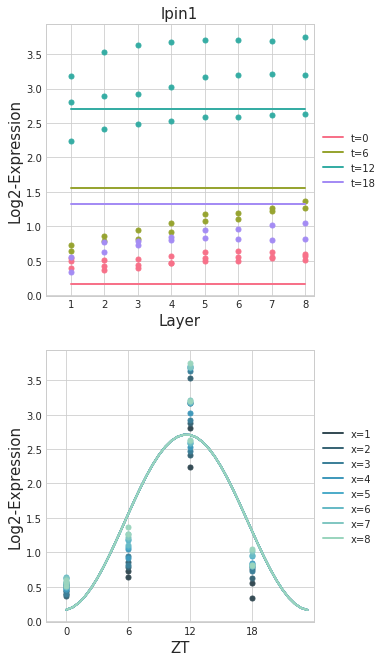

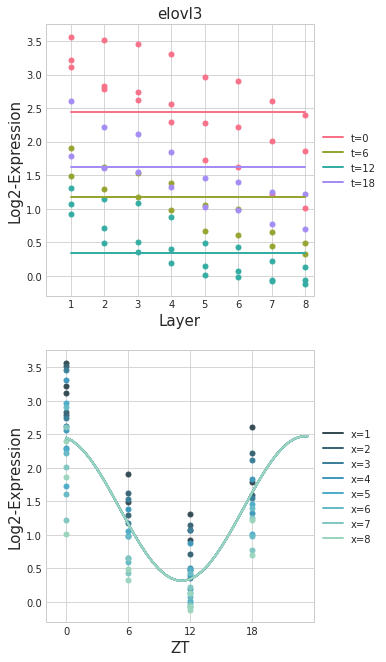

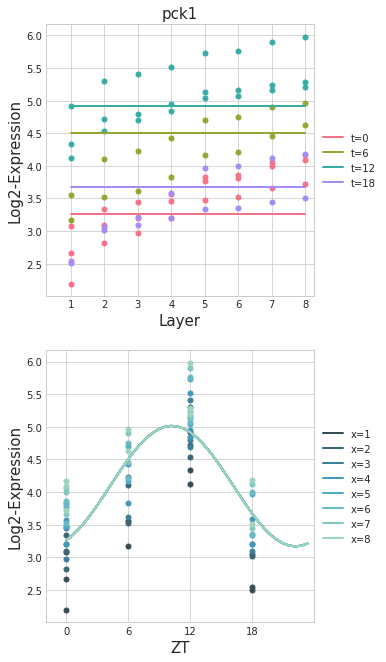

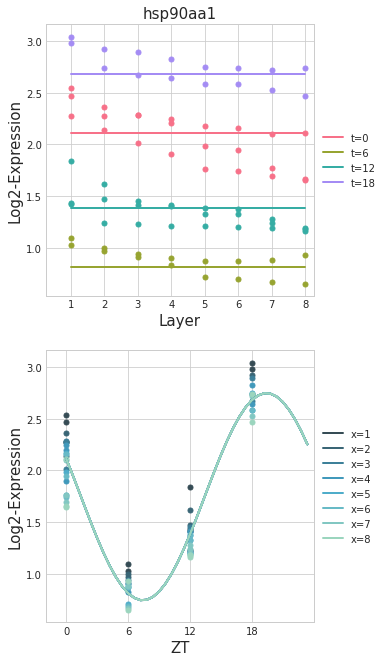

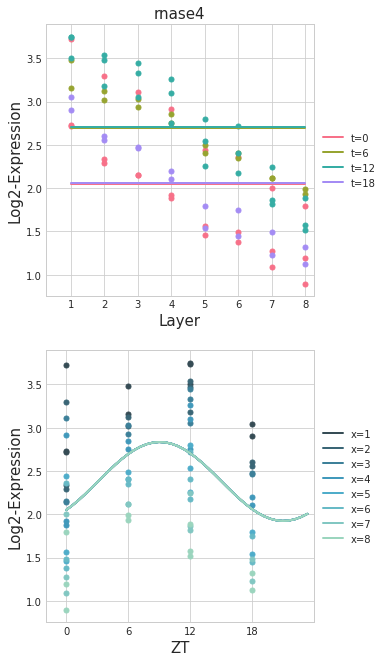

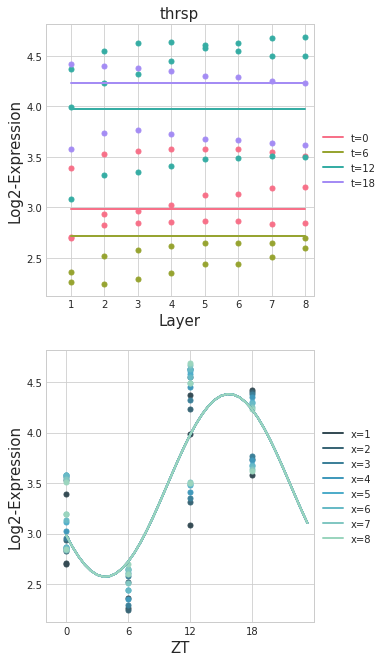

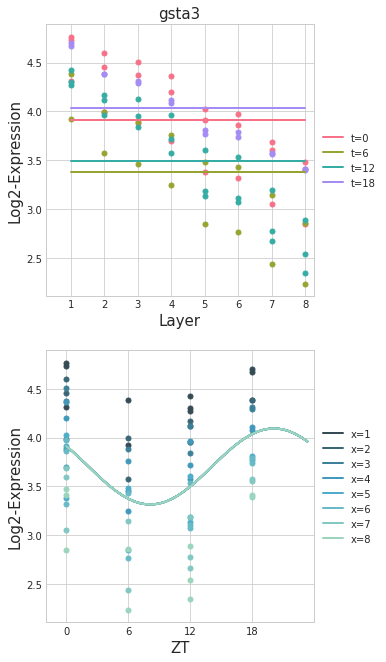

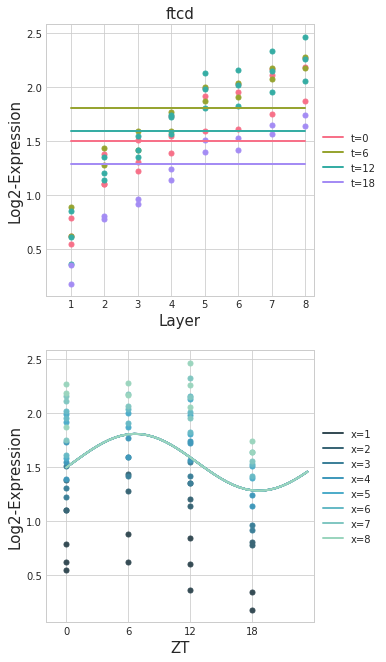

In [26]:
l_names = [l[0] for l in dic_cluster["Z+R"]]
l_amp = []
l_theta = []
l_slope = []
X = np.arange(8)

for name in l_names :
    selected, B, SE, bic, l_s, Xx_pred, Xt_pred, Y_pred, var_exp, var_exp_re = dic_reg[name]
    dic_param = {'a0' : 0, 'a1' : 0, 'a2' : 0, 'b0' : 0, 'b1' : 0, 'b2' : 0, 'mu0' : 0, 'mu1' : 0, 'mu2' : 0}
    for name_par, par in zip(selected, B):
        dic_param[name_par] = par
    l_a = dic_param['a0'] + dic_param['a1']*X + dic_param['a2']*0.5*(3*X**2-1)
    l_b = dic_param['b0'] + dic_param['b1']*X + dic_param['b2']*0.5*(3*X**2-1)
    l_r = np.sqrt(l_a**2+l_b**2)
    l_angle = np.arctan2(l_b, l_a )%(2*np.pi)
    mean_vect = np.mean([r*np.exp(1j* angle) for r, angle in zip(l_r, l_angle)])
    l_theta.append(np.angle(mean_vect)%(2*np.pi))
    amp = np.abs(mean_vect)
    l_amp.append(amp)
    y_formatted = np.zeros((80,40))
    for idx, val in enumerate(Y_pred):
        y_formatted[int(idx/40), int(idx%40)] = val
    avg_y = np.mean(y_formatted, axis = 1)
    slope = avg_y[-1]-avg_y[0]
    l_slope.append(slope)
    
tips = pd.DataFrame.from_dict({"Name": l_names, 'Amplitude' : l_amp, "Slope" : l_slope})
g = sn.jointplot("Slope", "Amplitude", data=tips, kind="reg", joint_kws={'scatter_kws':{'alpha':1},'line_kws':{'color':'none', 'alpha' : 0}})

for idx, row in tips.iterrows():
    if row["Amplitude"]>0.9 or abs(row["Slope"])>1.37:
        plt.gca().annotate(row["Name"], xy=(row["Slope"], row["Amplitude"]), xytext=(2,2) , textcoords ="offset points", fontsize = 10 )
g.set_axis_labels('Slope [log2]', 'Amplitude [log2]', fontsize=15)
plt.savefig('Output/ampl_splope.pdf')
plt.show()

for idx, row in tips.iterrows():
    if row["Amplitude"]>0.9 or abs(row["Slope"])>1.37:
        #plot outliers
        plot_gene_with_fit_alt(row["Name"], title = row["Name"])

Scatter plot: amplitude vs mean slope in ZxR

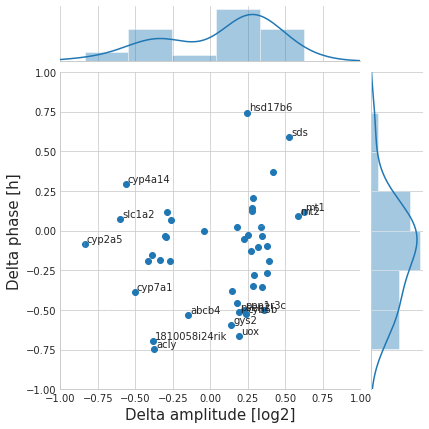

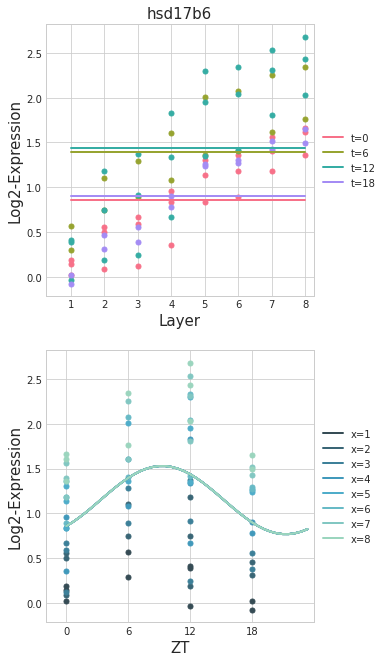

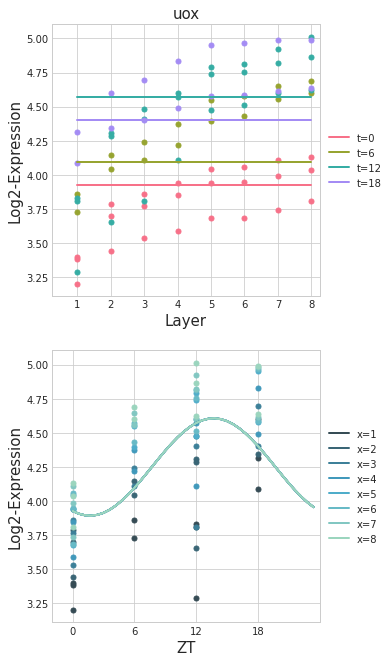

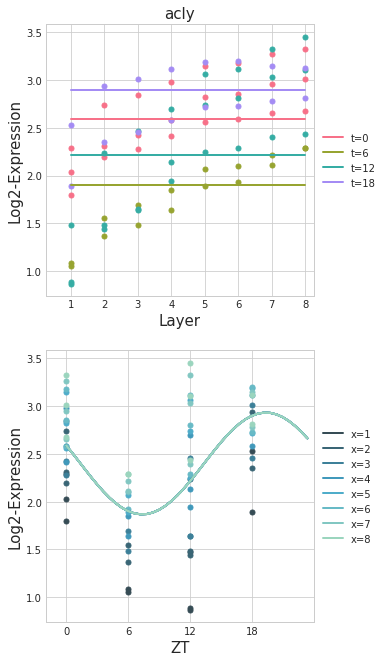

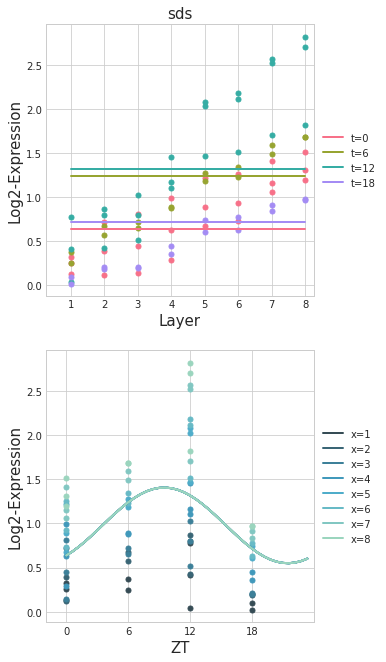

...

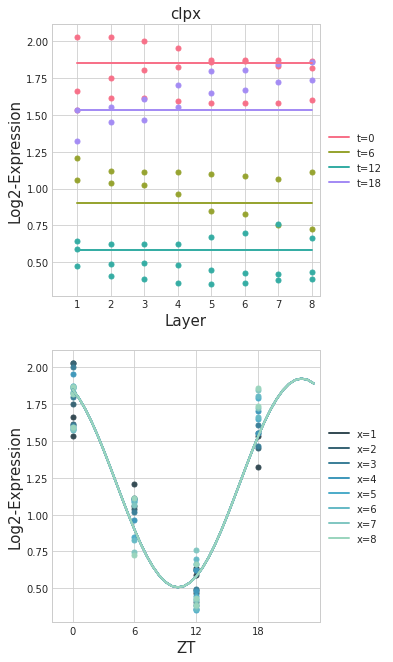

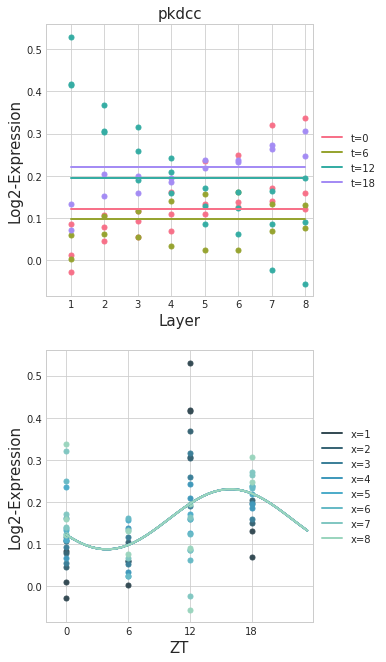

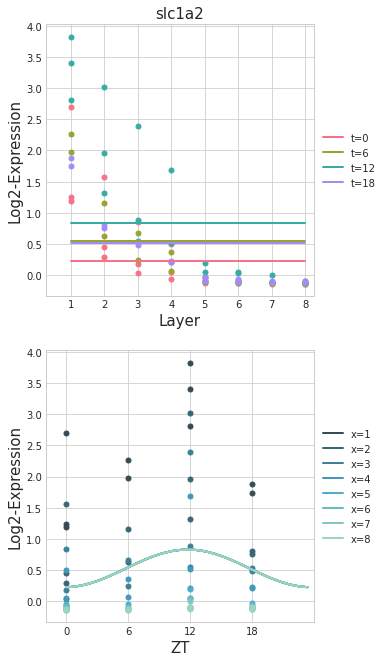

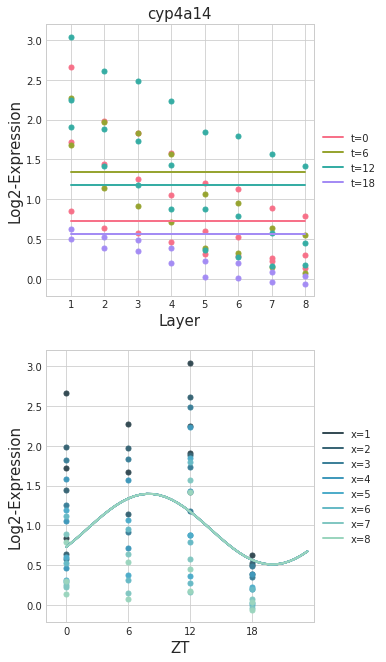

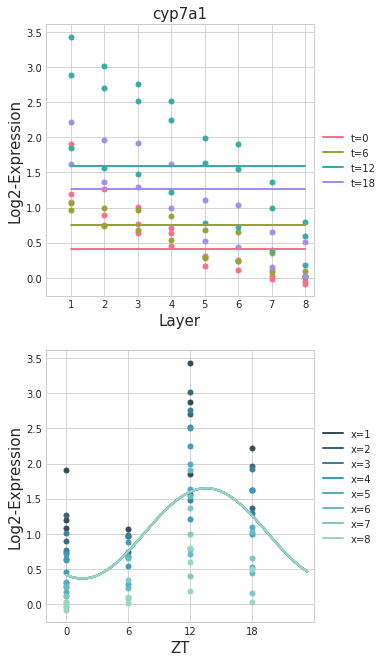

(None, None)

In [27]:
l_names = [l[0] for l in dic_cluster["ZxR"]]
l_amp = []
l_theta = []
l_slope = []
X = np.arange(8)

for name in l_names :
    selected, B, SE, bic, l_s, Xx_pred, Xt_pred, Y_pred, var_exp, var_exp_re = dic_reg[name]
    dic_param = {'a0' : 0, 'a1' : 0, 'a2' : 0, 'b0' : 0, 'b1' : 0, 'b2' : 0, 'mu0' : 0, 'mu1' : 0, 'mu2' : 0}
    for name_par, par in zip(selected, B):
        dic_param[name_par] = par
    l_a = dic_param['a0'] + dic_param['a1']*X + dic_param['a2']*0.5*(3*X**2-1)
    l_b = dic_param['b0'] + dic_param['b1']*X + dic_param['b2']*0.5*(3*X**2-1)
    l_r = np.sqrt(l_a**2+l_b**2)
    std_r = np.std(l_r)
    delta_r = l_r[-1]-l_r[0]
    l_angle = np.arctan2(l_b, l_a )%(2*np.pi)
    #remove ill defined phase
    l_angle_corrected = [angle for angle, r in zip(l_angle, l_r) if r>0.15]
    std_angle =  scipy.stats.circstd(l_angle_corrected)*24/(2*np.pi)
    delta_angle = l_angle_corrected[-1]-l_angle_corrected[0]
    if delta_angle>np.pi:
        delta_angle-=2*np.pi
    #delta_angle = delta_angle*24/(2*np.pi)
    mean_vect = np.mean([r*np.exp(1j* angle) for r, angle in zip(l_r, l_angle)])
    alpha0 = np.angle(mean_vect)
    std_angle_corr = (np.sum( np.multiply(l_r**2, np.cos(l_angle-alpha0)))/np.sum(l_r**2))**0.5
    l_theta.append(np.angle(mean_vect)%(2*np.pi))
    amp = l_r[-1]-l_r[0]
    l_amp.append(delta_angle)
    y_formatted = np.zeros((80,40))
    for idx, val in enumerate(Y_pred):
        y_formatted[int(idx/40), int(idx%40)] = val
    avg_y = np.mean(y_formatted, axis = 1)
    std_slope = np.std(avg_y )
    slope = avg_y[-1]-avg_y[0]
    l_slope.append(delta_r)
    
tips = pd.DataFrame.from_dict({"Name": l_names, 'Amplitude' : l_amp, "Slope" : l_slope})

g = sn.jointplot("Slope", "Amplitude", data=tips, kind="reg", 
                joint_kws={'scatter_kws':{'alpha':1},'line_kws':{'color':'none', 'alpha' : 0}},
                xlim=(-1.0, 1.), ylim=(-1.0, 1))

for idx, row in tips.iterrows():
    if abs(row["Amplitude"])>0.5 or abs(row["Slope"])>0.5:
        plt.gca().annotate(row["Name"], xy=(row["Slope"], row["Amplitude"]), xytext=(2,2) , textcoords ="offset points" , fontsize = 10 )

g.set_axis_labels('Delta amplitude [log2]', 'Delta phase [h]', fontsize=15)
plt.savefig('Output/ampl_splope_zxr.pdf')
plt.show()

plot_gene_with_fit_alt('hsd17b6', title = 'hsd17b6')
plot_gene_with_fit_alt('uox', title = 'uox')
plot_gene_with_fit_alt('acly', title = 'acly')
plot_gene_with_fit_alt('sds', title = 'sds')
plot_gene_with_fit_alt('cyp7a1', title = 'cyp7a1')
plot_gene_with_fit_alt('mt1', title = 'mt1')
plot_gene_with_fit_alt('clpx', title = 'clpx')
plot_gene_with_fit_alt('pkdcc', title = 'pkdcc')
plot_gene_with_fit_alt('slc1a2', title = 'slc1a2')
plot_gene_with_fit_alt('cyp4a14', title = 'cyp4a14')
plot_gene_with_fit_alt('cyp7a1', title = 'cyp7a1')

In [28]:
from scipy import stats
print(stats.pearsonr(tips['Slope'], tips['Amplitude']))

(0.14544084277310101, 0.34045144289759455)


## 5. Compare the phase with Atger dataset

Load Atger dataset

In [29]:
def LoadAtger(load_path = 'Datasets/Atger/atger_al_wt_FromPaper.txt'):
    dic_atg = {}
    #load text file in a df
    df = pd.read_csv(load_path, sep = '\t', index_col = 'Gene_Symbol')
    names = ['Exon_WT_ZT' + '0'+str(i) if i<10 and i!=6 else 'Exon_WT_ZT' + str(i) for i in range(0,24,2)]
    #compute mean expression and std across the 4 conditions
    for index, val_gene in df.iterrows():
        general_array = np.vstack( [ [df.loc[index, name+'.a'], df.loc[index,name+'.b'],
                                                df.loc[index,name+'.c'], df.loc[index,name+'.d']] for name in names])
        dic_atg[index.lower()] = np.log2(general_array + 10**-6)
                                  
    return dic_atg

dic_atg = LoadAtger()

Define the class to do linear regression

In [30]:
class LinearRegression():
    def __init__(self, Y, dic_X):
        """
        Y: observations vector
        dictionnary of predictors: design matrix
        """
        self.Y = Y[:,np.newaxis]
        self.dic_X = dic_X
        self.n = len(Y)

    def make_complete_regression(self, chosen_predictors, no_intercept = False):
        p = len(chosen_predictors)
        #create design matrix
        X = np.ones(self.n)[:,None].T
        for pred in chosen_predictors:
            X = np.vstack( (X, self.dic_X[pred]) )
        if no_intercept:
            X = np.delete(X,0,0)
        #make X a matrix with predictors as horizontal vectors
        X = X.T
        X2_inv = np.linalg.inv(X.T @ X)
        #get coef matrix
        B =  X2_inv @ X.T @ self.Y
        #get predictions
        Y_pred = X@B
        #compute s
        s2 =  (1/(self.n-p)) * ((self.Y - Y_pred).T @ (self.Y - Y_pred))
        #compute SE Parameters
        SE = (s2 * X2_inv)**0.5
        #compute Y_mean
        Y_mean = np.mean(self.Y)
        #compute r2
        r2 = np.squeeze(((Y_pred -Y_mean).T @ (Y_pred -Y_mean) ) / (   (self.Y-Y_mean).T @ (self.Y -Y_mean) ))
        ##compute adjusted r2
        adj_r2 = 1-(1-r2) * (self.n -1)/(self.n-p-1)
        #compute log-likelihood (cf. https://stats.stackexchange.com/questions/87345/calculating-aic-by-hand-in-r)
        try:
            minus_two_ll = self.n*(np.log(2*np.pi)+1+np.log((np.sum((self.Y - Y_pred).T @ (self.Y - Y_pred))/self.n)))
        except:
            minus_two_ll = np.nan
        #compute AIC (cf https://stackoverflow.com/questions/35131450/calculating-bic-manually-for-lm-object)
        aic =  minus_two_ll+(p+1)*2
        #compute BIC (cf https://stackoverflow.com/questions/35131450/calculating-bic-manually-for-lm-object)
        bic = minus_two_ll+np.log(self.n)*(p+1)

        return X, B, SE, adj_r2, aic, bic

Do the linear regression on Atger's dataset

In [31]:
w = 2*np.pi/24
Xt = np.array(list(range(0,24,2))*4)
dic_X = {'x': np.cos(w*Xt) , 'y': np.sin(w*Xt)}

dic_reg_atg = {}
for gene, val in dic_atg.items():
    Y = val.flatten('F')
    try:
        #compare oscillating model with flat model
        chosen_predictors =['x','y']
        X_osc, B_osc, SE_osc, adj_r2_osc, aic_osc, bic_osc = LinearRegression(Y, dic_X).make_complete_regression(chosen_predictors)
        chosen_predictors =[]
        X_flat, B_flat, SE_flat, adj_r2_flat, aic_flat, bic_flat = LinearRegression(Y, dic_X).make_complete_regression(chosen_predictors)
        if bic_flat<bic_osc:
            dic_reg_atg[gene] = ['flat', X_flat, B_flat, SE_flat, adj_r2_flat, aic_flat, bic_flat]
        else:
            dic_reg_atg[gene] = ['osc', X_osc, B_osc, SE_osc, adj_r2_osc, aic_osc, bic_osc]
    except:
        print('Gene ', gene, ' was discarded of the analysis')

Gene  2410002o22rik  was discarded of the analysis
Gene  bc037034  was discarded of the analysis
Gene  mier2  was discarded of the analysis
Gene  tob2  was discarded of the analysis
Gene  taf9  was discarded of the analysis


Plot a few regression to check that everything went fine

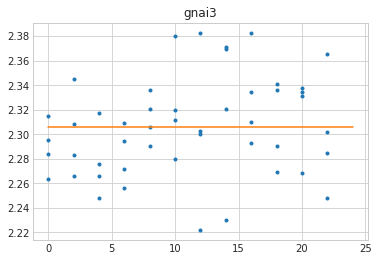

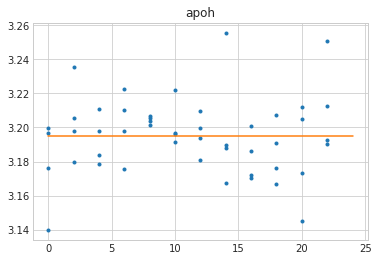

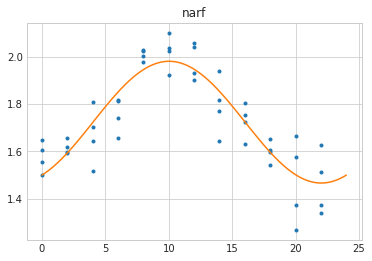

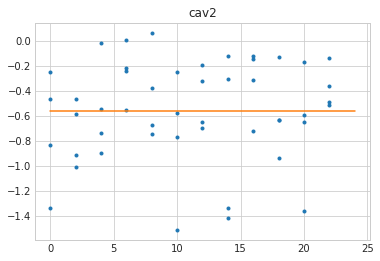

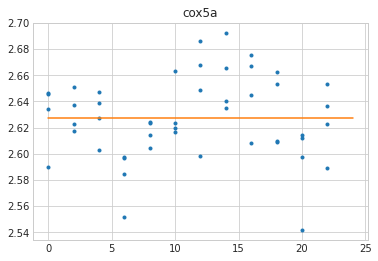

...

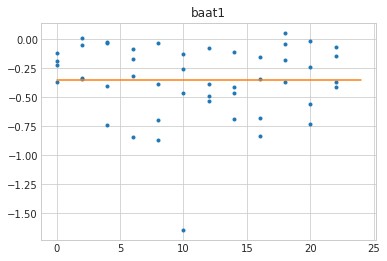

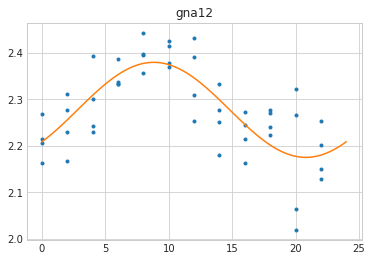

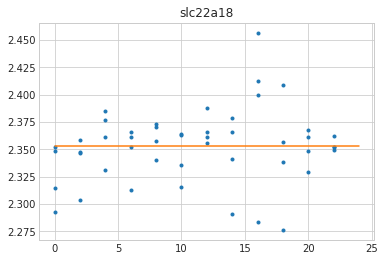

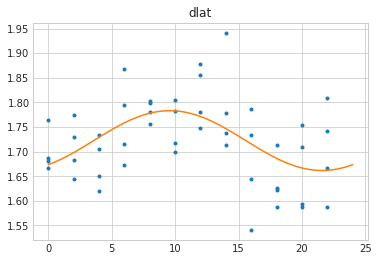

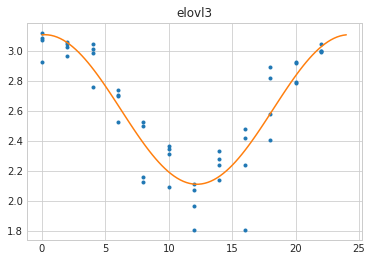

In [32]:
Xt_pred = np.linspace(0,24,100)
for idx, (gene, reg) in enumerate(dic_reg_atg.items()):
    type_reg, X, B, SE, adj_r2, aic, bic = reg
    plt.plot(Xt, dic_atg[gene].flatten('F'), '.')
    if type_reg=='flat':
        plt.plot(Xt_pred,[float(B[0])]*len(Xt_pred))
    else:
        plt.plot(Xt_pred, [float(B[0])]*len(Xt_pred)+B[1]*np.cos(w*Xt_pred)+B[2]*np.sin(w*Xt_pred))
    plt.title(gene)
    plt.show()
    if idx>10:
        break
       
gene = 'elovl3'
type_reg, X, B, SE, adj_r2, aic, bic = dic_reg_atg[gene]
plt.plot(Xt, dic_atg[gene].flatten('F'), '.')
plt.plot(Xt_pred, [float(B[0])]*len(Xt_pred)+B[1]*np.cos(w*Xt_pred)+B[2]*np.sin(w*Xt_pred))
plt.title(gene)
plt.show()

Barplot to sum up the classification of the Atger dataset

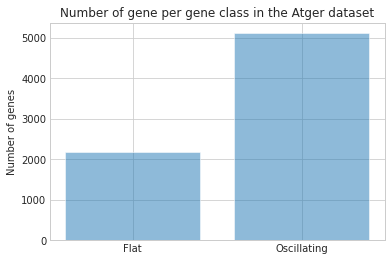

In [33]:
l_flat_genes = [gene for gene in dic_reg_atg.keys() if dic_reg_atg[gene][0]=='flat']
l_osc_genes = [gene for gene in dic_reg_atg.keys() if dic_reg_atg[gene][0]=='osc']

objects = ('Flat', 'Oscillating')
y_pos = np.arange(len(objects))
num = [len(l_flat_genes), len(l_osc_genes)]
 
plt.bar(y_pos, num, align='center', alpha=0.5)
plt.xticks(y_pos, objects)
plt.ylabel('Number of genes')
plt.title('Number of gene per gene class in the Atger dataset')
plt.show()

Now compare with the result of the classification made on Itzkovitz dataset

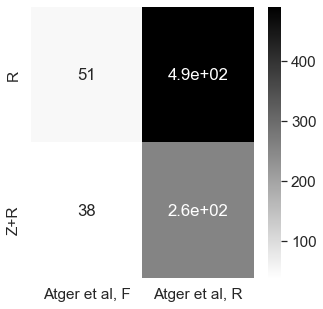

In [34]:
# get genes in common in the two dataset
set_gene_atg = set(dic_atg.keys())
set_gene_itz = set(dic_itz_clean.keys())
set_common_genes = set_gene_atg.intersection(set_gene_itz)

#get list of genes for all class for itzkovitz
s_rhythmic_itz = set([l[0] for l in dic_cluster['R']]).intersection(set_common_genes)
s_none_itz = set([l[0] for l in dic_cluster['F'] ]+[l[0] for l in dic_cluster['Z']]).intersection(set_common_genes)
s_zonated_rhytmic_itz = set([l[0] for l in dic_cluster['Z+R']]).intersection(set_common_genes)

#keep only rythmic genes of itz as common basis
set_common_genes = set_common_genes.intersection(s_rhythmic_itz.union(s_zonated_rhytmic_itz))

#get list of genes for atger
s_rhythmic_atg = set(l_osc_genes).intersection(set_common_genes)
s_flat_atg =  set(l_flat_genes).intersection(set_common_genes)

#create a matrix in which column 0 is Atger flat, column 1 is Atger rhythmic, row 0 is Itz flat+zonated, 
#row 1 is Itz rhythmic, and and row 2 is Itz zonated and rhythtmic
confusion_mat = np.zeros((2,2))
confusion_mat[1-1,0] = len(s_rhythmic_itz.intersection(s_flat_atg))
confusion_mat[1-1,1] = len(s_rhythmic_itz.intersection(s_rhythmic_atg))
confusion_mat[2-1,0] = len(s_zonated_rhytmic_itz.intersection(s_flat_atg))
confusion_mat[2-1,1] = len(s_zonated_rhytmic_itz.intersection(s_rhythmic_atg))

#dot the plot
df_cm = pd.DataFrame(confusion_mat, index = ['R', 'Z+R'], columns = ['Atger et al, F', 'Atger et al, R'])

plt.figure(figsize = (5,5))
sn.set(font_scale=1.4)
sn.heatmap(df_cm, annot=True, cmap = 'binary')
plt.savefig('Output/Atger_classification_comparison.pdf')
plt.show()
plt.close()

Compare the phases and amplitude of the purely rhytmic genes in both dataset

746


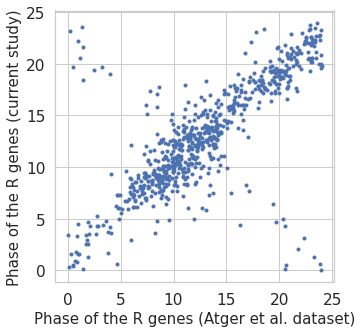

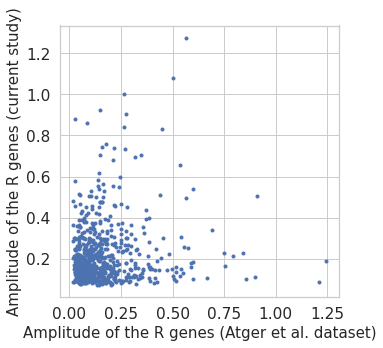

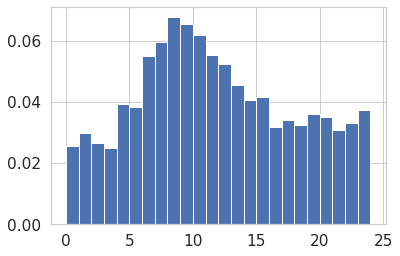

In [35]:
sn.set_style("whitegrid", {'xtick.direction': 'out', 'xtick.major.size': 6.0, 'xtick.minor.size': 3.0,
    'ytick.color': '.15', 'ytick.direction': 'out', 'ytick.major.size': 6.0, 'ytick.minor.size': 3.0, 
                           'font.family': ['DejaVu Sans'],})

X = np.arange(8)
l_phase_itz = []
l_phase_atg = []
l_amp_itz = []
l_amp_atg = []
for gene in s_rhythmic_itz.intersection(s_rhythmic_atg):
    selected, B, SE, bic, l_s, Xx_pred, Xt_pred, Y_pred, var_exp, var_exp_re = dic_reg[gene]
    l_phase_itz.append(np.arctan2(B[2], B[1] )/(2*np.pi)*24)
    l_amp_itz.append(np.sqrt(B[2]**2+ B[1]**2))
    type_reg, X_osc, B_osc, SE_osc, adj_r2_osc, aic_osc, bic_osc = dic_reg_atg[gene] 
    l_phase_atg.append(np.arctan2(B_osc[2], B_osc[1] )/(2*np.pi)*24)
    l_amp_atg.append(np.sqrt(B_osc[2]**2+ B_osc[1]**2))

for gene in s_zonated_rhytmic_itz.intersection(s_rhythmic_atg):
    selected, B, SE,  bic,  l_s, Xx_pred, Xt_pred, Y_pred, var_exp, var_exp_re = dic_reg[gene]
    dic_param = {'a0' : 0, 'a1' : 0, 'a2' : 0, 'b0' : 0, 'b1' : 0, 'b2' : 0, 'mu0' : 0, 'mu1' : 0, 'mu2' : 0}
    for name_par, par in zip(selected, B):
        dic_param[name_par] = par
    l_a = dic_param['a0'] + dic_param['a1']*X + dic_param['a2']*0.5*(3*X**2-1)
    l_b = dic_param['b0'] + dic_param['b1']*X + dic_param['b2']*0.5*(3*X**2-1)
    l_r = np.sqrt(l_a**2+l_b**2)
    l_angle = np.arctan2(l_b, l_a )
    mean_vect = np.mean([r*np.exp(1j* angle) for r, angle in zip(l_r, l_angle)])    
    l_phase_itz.append(np.angle(mean_vect)/(2*np.pi)*24)
    l_amp_itz.append(np.abs(mean_vect))
    
    
    type_reg, X_osc, B_osc, SE_osc, adj_r2_osc, aic_osc, bic_osc = dic_reg_atg[gene] 
    l_phase_atg.append(np.arctan2(B_osc[2], B_osc[1] )/(2*np.pi)*24)
    l_amp_atg.append(np.sqrt(B_osc[2]**2+ B_osc[1]**2))
    
print(len(l_phase_atg))
plt.figure(figsize = (5,5))
plt.plot(np.array(l_phase_atg)%24,np.array(l_phase_itz)%24,'.')
plt.ylabel('Phase of the R genes (current study)', fontsize=15)
plt.xlabel('Phase of the R genes (Atger et al. dataset)', fontsize=15)
#plt.title('Comparison of the phases of the rhythmic genes')
plt.savefig('Output/Atger_phase_comparison.pdf')
plt.show()
plt.close()

plt.figure(figsize = (5,5))
plt.plot(np.array(l_amp_atg),np.array(l_amp_itz),'.')
plt.ylabel('Amplitude of the R genes (current study)', fontsize=15)
plt.xlabel('Amplitude of the R genes (Atger et al. dataset)', fontsize=15)
#plt.title('Comparison of the amplitudes of the rhythmic genes')
plt.savefig('Output/Atger_amp_comparison.pdf')
plt.show()

arr_amp_atg = np.array( [x[0] for x in l_amp_atg if not np.isnan(x)])
arr_amp_itz = np.array([x for x,y in zip(l_amp_itz, l_amp_atg) if not np.isnan(y)])
#print('ampltiude correlation', np.corrcoef(arr_amp_atg,arr_amp_itz))


l_phase_atg = []
for gene in l_osc_genes :
    type_reg, X_osc, B_osc, SE_osc, adj_r2_osc, aic_osc, bic_osc = dic_reg_atg[gene]
    phase = (np.arctan2(B_osc[2], B_osc[1] )/(2*np.pi)*24)[0]%24
    #print(phase)
    if not np.isnan(phase):
        l_phase_atg.append(phase)
    
n, bins, path = plt.hist(np.array(l_phase_atg), bins=24, density = True)
plt.show()
plt.close()

## 6. Study Wnt2, ras and hypox targets

Load dictionnaries

In [36]:
#Get a list of targets
file_wnt_targets_up_apc = 'Datasets/pathways_targets/Wnt_targets_up_apc.txt'
file_wnt_targets_down_apc = 'Datasets/pathways_targets/Wnt_targets_down_apc.txt'


file_ras_targets_up = 'Datasets/pathways_targets/ras_targets_up.txt'
file_ras_targets_down = 'Datasets/pathways_targets/ras_targets_down.txt'

file_hypox_targets_up = 'Datasets/pathways_targets/hypox_targets_up.txt'
file_hypox_targets_down = 'Datasets/pathways_targets/hypox_targets_down.txt'

file_ppar_up = 'Datasets/ppar/lipidbio_list'
file_ppar_down = 'Datasets/ppar/ppar_list'
    
l_wnt_tgts_up_apc  = []
l_wnt_tgts_up_apc_val  = []
with open(file_wnt_targets_up_apc, 'r') as f:
    for line in f:
        name, apc = line.split('\t')
        l_wnt_tgts_up_apc.append(name.lower())
        l_wnt_tgts_up_apc_val.append(float(apc[:-1].replace(',', '.')))
l_wnt_tgts_up_apc_val, l_wnt_tgts_up_apc = zip(*sorted(zip(l_wnt_tgts_up_apc_val, l_wnt_tgts_up_apc)))

l_wnt_tgts_down_apc  = []
l_wnt_tgts_down_apc_val  = []
with open(file_wnt_targets_down_apc, 'r') as f:
    for line in f:
        name, apc = line.split('\t')
        l_wnt_tgts_down_apc.append(name.lower())
        l_wnt_tgts_down_apc_val.append(float(apc[:-1].replace(',', '.')))
l_wnt_tgts_down_apc_val, l_wnt_tgts_down_apc = zip(*sorted(zip(l_wnt_tgts_down_apc_val, l_wnt_tgts_down_apc)))

    
with open(file_ras_targets_up, 'r') as f:
    l_ras_tgts_up = [x.lower() for x in f.read().split('\n')]
with open(file_ras_targets_down, 'r') as f:
    l_ras_tgts_down = [x.lower() for x in f.read().split('\n')]
with open(file_hypox_targets_up, 'r') as f:
    l_hypox_tgts_up = [x.lower() for x in f.read().split('\n')]
with open(file_hypox_targets_down, 'r') as f:
    l_hypox_tgts_down = [x.lower() for x in f.read().split('\n')]

with open(file_ppar_up, 'r') as f:
    l_ppar_up = []
    for x in f:
        l_ppar_up.extend(x[:-1].lower().split())
with open(file_ppar_down, 'r') as f:
    l_ppar_down = [x.lower().split(";")[0] for x in f.read().split('\n')]   
    
#find the intersection with the itz dataset
l_wnt_tgts_up_apc = [x for x in l_wnt_tgts_up_apc if x in dic_itz.keys()]
l_wnt_tgts_down_apc = [x for x in l_wnt_tgts_down_apc if x in dic_itz.keys()]
l_ras_tgts_up = set(l_ras_tgts_up).intersection(dic_itz.keys())
l_ras_tgts_down = set(l_ras_tgts_down).intersection(dic_itz.keys())
l_hypox_tgts_up = set(l_hypox_tgts_up).intersection(dic_itz.keys())
l_hypox_tgts_down = set(l_hypox_tgts_down).intersection(dic_itz.keys())
l_ppar_up = set(l_ppar_up).intersection(dic_itz.keys())
l_ppar_down = set(l_ppar_down).intersection(dic_itz.keys())

Ntot =  34
(8, 4)


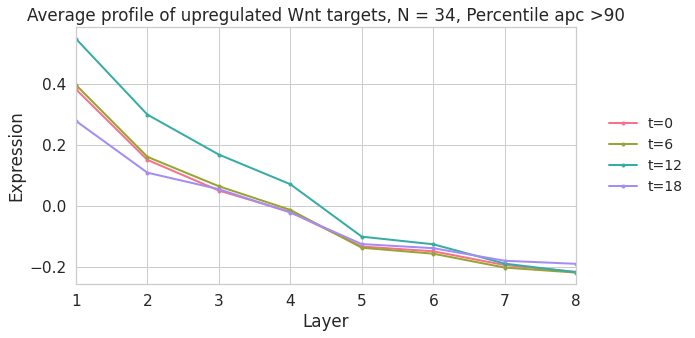

In [37]:
#plot wtn2 target profile
color1 = sn.color_palette("husl", 4)
color_10 = sn.color_palette("husl", 8)

def plot_target(profile, title, save_name, filter_exp, N = 0):
    plt.figure(figsize= (10,5))
    #plot average profile
    for t in range(4):
        plt.plot(np.linspace(1,8,8, endpoint = True), profile[:,t], marker=".", label = 't='+str(t*6),  color = color1[t], lw = 2)
    plt.xlabel("Layer")
    plt.ylabel("Expression")
    plt.xlim([1,8])
    plt.legend()
    plt.legend(bbox_to_anchor=(1.04, 0.5), loc='center left', fontsize=14)
    #plt.annotate("Avg log2-exp > " + str(filter_exp), (5, 0.))
    
    #plt.title(title + ', N = ' + str(N) + ', Filter: avg exp>' + str(filter_exp))
    plt.title(title + ', N = ' + str(N) + ', Percentile apc >' + str(filter_exp))
    
    plt.tight_layout()
    plt.savefig('Output/Targets/'+ str(filter_exp)+'_'+save_name, facecolor = 'white')
    plt.show()
    plt.close()
    
def plot_target_time(profile, title, save_name, filter_exp, N = 0):
    plt.figure(figsize= (10,5))
    #plot average profile
    for x in range(8):
        plt.plot(np.linspace(0,24,4, endpoint = False), profile[x,:], marker=".", label = 'Layer='+str(x+1),  color = color_10[x], lw = 2)
    plt.xlabel("Time")
    plt.ylabel("Expression")
    #plt.xlim([1,8])
    plt.legend()
    plt.legend(bbox_to_anchor=(1.04, 0.5), loc='center left', fontsize=14)
    #plt.annotate("Avg log2-exp > " + str(filter_exp), (5, 0.))
    
    #plt.title(title + ', N = ' + str(N) + ', Filter: avg exp>' + str(filter_exp))
    plt.title(title + ', N = ' + str(N) + ', Percentile apc >' + str(filter_exp))
    
    plt.tight_layout()
    plt.savefig('Output/Targets/'+ str(filter_exp)+'_'+save_name, facecolor = 'white')
    plt.show()
    plt.close()

def compute_avg_profile_target(l_tgts, filter_exp = -1):
    #look at how the average profile evolves with time
    l_avg_data = []

    for name in l_tgts:
        #average replicates
        avg_data = np.nanmean( [dic_itz[name]['rep1'],dic_itz[name]['rep2'],dic_itz[name]['rep3']], axis = 0)
        if np.mean(avg_data)>filter_exp:
            #center
            avg_data-=np.mean(avg_data)
            l_avg_data.append(avg_data)

    #average profiles
    avg_profile = np.nanmean(l_avg_data, axis = 0)
    
    #print how many genes per category
    print("Ntot = ", len(l_avg_data))

    return len(l_avg_data), avg_profile

def compute_avg_profile_target_apc(l_tgts, l_apc, percentile_apc):
    #look at how the average profile evolves with time
    l_avg_data = []

    perc_apc = np.percentile(l_apc,percentile_apc)
    for name, apc in zip(l_tgts, l_apc):
        if apc>perc_apc:
            #average replicates
            avg_data = np.nanmean( [dic_itz[name]['rep1'],dic_itz[name]['rep2'],dic_itz[name]['rep3']], axis = 0)
            #center
            avg_data-=np.mean(avg_data)
            l_avg_data.append(avg_data)

    #average profiles
    avg_profile = np.nanmean(l_avg_data, axis = 0)
    
    #print how many genes per category
    print("Ntot = ", len(l_avg_data))
    print(avg_profile.shape)
    return len(l_avg_data), avg_profile

#filter_exp = 2
percentile_apc = 90
#plot the average wnt target profile
N_up, avg_profile_wnt_up = compute_avg_profile_target_apc(l_wnt_tgts_up_apc, l_wnt_tgts_up_apc_val, percentile_apc)

plot_target(avg_profile_wnt_up, "Average profile of upregulated Wnt targets", "wnt_up.pdf", percentile_apc, N_up)

In [38]:
def plot_categories(dic_cluster, dic_cluster_pathway, name_target):

    flag = 100000
    x = ['F', 'Z', 'R', 'Z+R', 'ZxR']
    y = [len([l for l in dic_cluster[type_c] if l[5]<flag*l[4]]) for type_c in x]
    y[0]+=np.sum([len([l for l in dic_cluster[type_c] if l[5]>=flag*l[4]]) for type_c in x])
    
    y_tgt = [len([l for l in dic_cluster_pathway[type_c] if l[5]<flag*l[4]]) for type_c in x]
    y_tgt[0]+=np.sum([len([l for l in dic_cluster_pathway[type_c] if l[5]>=flag*l[4]]) for type_c in x])
    
    y_norm = y/np.sum(y)
    y_tgt_norm = y_tgt/np.sum(y_tgt)
    
    #check how the genes are zonated in the whole dataset
    count_up = 0
    count_down = 0
    for res in dic_cluster["Z"]:
        name_gene = res[0]
        #get model prediction
        selected, B, SE,  bic,  l_schwartz,Xx_pred, Xt_pred, Y_pred, var_exp, var_exp_re = dic_reg[name_gene]        
        y_formatted = np.zeros((80,40))
        for idx, val in enumerate(Y_pred):
            y_formatted[int(idx/40), int(idx%40)] = val
        #check how gene is zonated
        y_formatted = np.mean(y_formatted, axis = 1)
        if y_formatted[0]>y_formatted[-1]:
            count_down+=1
        else:
            count_up+=1
    count_up = count_up/np.sum(y)
    count_down = count_down/np.sum(y)
    
    #check how the genes are zonated in the targets
    count_up_tgt = 0
    count_down_tgt = 0
    for res in dic_cluster_pathway["Z"]:
        name_gene = res[0]
        #get model prediction
        selected, B, SE,  bic,  l_schwartz,Xx_pred, Xt_pred, Y_pred, var_exp, var_exp_re = dic_reg[name_gene]        
        y_formatted = np.zeros((80,40))
        for idx, val in enumerate(Y_pred):
            y_formatted[int(idx/40), int(idx%40)] = val
        #check how gene is zonated
        y_formatted = np.mean(y_formatted, axis = 1)
        if y_formatted[0]>y_formatted[-1]:
            count_down_tgt+=1
        else:
            count_up_tgt+=1
    count_up_tgt = count_up_tgt/np.sum(y_tgt)
    count_down_tgt = count_down_tgt/np.sum(y_tgt)
    
    #replace first value with periportal genes
    y_norm[1] = count_up
    y_tgt_norm[1] = count_up_tgt
    
    
    y_pos = np.arange(len(x)*3)
    r1 = plt.bar(y_pos[0:-1:3], y_norm, align='center', alpha=0.5, label = "whole dataset", color = "C0")
    r2 = plt.bar(y_pos[1:15:3], y_tgt_norm, align='center', alpha=0.5, label= name_target, color = "C1")
    
    r1bis = plt.bar(y_pos[0:-1:3][1], count_down, align='center', alpha=0.5, bottom=y_norm[1], color = "C0", edgecolor='black')
    r2bis = plt.bar(y_pos[1:15:3][1], count_down_tgt, align='center', alpha=0.5, bottom=y_tgt_norm[1], color = "C1", edgecolor='black')

    tot1 = np.sum(y)
    tot2 = np.sum(y_tgt)
    
    for i, rect in enumerate(r1):
        height = rect.get_height()
        if i==1: #zonated genes
            plt.text(rect.get_x() + rect.get_width()/2., 1.0*height/3, "P", ha='center', va='bottom')
            plt.text(rect.get_x() + rect.get_width()/2., 1.0*height+r1bis[0].get_height()/3, "C", ha='center', va='bottom')
            height+=r1bis[0].get_height()
            
        plt.text(rect.get_x() + rect.get_width()/2., 1.0*height, '%d' % int(height*tot1), ha='center', va='bottom')
    for i, rect in enumerate(r2):
        height = rect.get_height()
        if i==1: #zonated genes
            plt.text(rect.get_x() + rect.get_width()/2., 1.0*height/3, "P", ha='center', va='bottom')
            plt.text(rect.get_x() + rect.get_width()/2., 1.0*height+r2bis[0].get_height()/3, "C", ha='center', va='bottom')
            height+=r2bis[0].get_height()
        plt.text(rect.get_x() + rect.get_width()/2., 1.0*height, '%d' % int(height*tot2), ha='center', va='bottom')
    
    plt.xticks((y_pos[0:-1:3]+y_pos[1:15:3])/2, x)
    plt.ylabel('Gene proportion')
    plt.title('Proportion of genes in each category:' + name_target)
    plt.legend()
    plt.tight_layout()
    plt.savefig('Output/Targets/categories_'+name_target+'.pdf')
    plt.show()
    plt.close()
    
def compute_pvalue_enrichment(dic_cluster, dic_cluster_pathway):
    l_whole = [len(dic_cluster['F']),  len(dic_cluster['Z']), len(dic_cluster['R']),len(dic_cluster['Z+R']) ,len(dic_cluster['ZxR']) ]
    l_O = [len(dic_cluster_pathway['F']),  len(dic_cluster_pathway['Z']), len(dic_cluster_pathway['R']),len(dic_cluster_pathway['Z+R']) ,len(dic_cluster_pathway['ZxR']) ]
    N = np.sum(l_O)
    l_E = [x/np.sum(l_whole)*N for x in l_whole]
    #print(l_E)
    #print(l_O)
    l_khi = [((O-E)**2)/E for O,E in zip(l_O, l_E)]
    khi2 = np.sum(l_khi)
    #print(l_khi)
    #print(scipy.stats.chi2.cdf(x=4, df=len(l_whole)-1))
    p_value = 1. - scipy.stats.chi2.cdf(x=khi2, df=len(l_whole)-1)
    
    return p_value
    
#find the intersection with the itz dataset
l_wnt_tgts_up = set(l_wnt_tgts_up_apc).intersection(dic_reg.keys())
l_wnt_tgts_down = set(l_wnt_tgts_down_apc).intersection(dic_reg.keys())
l_ras_tgts_up = set(l_ras_tgts_up).intersection(dic_reg.keys())
l_ras_tgts_down = set(l_ras_tgts_down).intersection(dic_reg.keys())

l_hypox_tgts_up = set(l_hypox_tgts_up).intersection(dic_reg.keys())
l_hypox_tgts_down = set(l_hypox_tgts_down).intersection(dic_reg.keys())

l_ppar_up = set(l_ppar_up).intersection(dic_reg.keys())
l_ppar_down = set(l_ppar_down).intersection(dic_reg.keys())


#study enrichment in the different categories
dic_cluster_wnt_up = compute_dic_cluster({name:dic_reg[name] for name in l_wnt_tgts_up})
dic_cluster_ras_up = compute_dic_cluster({name:dic_reg[name] for name in l_ras_tgts_up})
dic_cluster_wnt_down = compute_dic_cluster({name:dic_reg[name] for name in l_wnt_tgts_down})
dic_cluster_ras_down = compute_dic_cluster({name:dic_reg[name] for name in l_ras_tgts_down})
dic_cluster_hypox_up = compute_dic_cluster({name:dic_reg[name] for name in l_hypox_tgts_up})
dic_cluster_hypox_down = compute_dic_cluster({name:dic_reg[name] for name in l_hypox_tgts_down})
dic_cluster_ppar_up = compute_dic_cluster({name:dic_reg[name] for name in l_ppar_up})
dic_cluster_ppar_down = compute_dic_cluster({name:dic_reg[name] for name in l_ppar_down})

In [39]:
import re
def heatmap(data, row_labels, col_labels, ax=None,
            cbar_kw={}, cbarlabel="", frac = 0.026, **kwargs):
    """
    Create a heatmap from a numpy array and two lists of labels.

    Arguments:
        data       : A 2D numpy array of shape (N,M)
        row_labels : A list or array of length N with the labels
                     for the rows
        col_labels : A list or array of length M with the labels
                     for the columns
    Optional arguments:
        ax         : A matplotlib.axes.Axes instance to which the heatmap
                     is plotted. If not provided, use current axes or
                     create a new one.
        cbar_kw    : A dictionary with arguments to
                     :meth:`matplotlib.Figure.colorbar`.
        cbarlabel  : The label for the colorbar
    All other arguments are directly passed on to the imshow call.
    """

    if not ax:
        ax = plt.gca()

    # Plot the heatmap
    matplotlib.rc('xtick', labelsize=19) 
    matplotlib.rc('ytick', labelsize=19) 
    im = ax.imshow(data, vmin = -2, vmax = 2, **kwargs)
    
    # Create colorbar
    cbar = ax.figure.colorbar(im, fraction=frac, pad=0.04, ax=ax, **cbar_kw)
    cbar.ax.set_ylabel(cbarlabel, rotation=-90, va="bottom")

    # We want to show all ticks...
    ax.set_xticks(np.arange(data.shape[1]))
    ax.set_yticks(np.arange(data.shape[0]))
    # ... and label them with the respective list entries.
    ax.set_xticklabels(col_labels)
    ax.set_yticklabels(row_labels)

    # Let the horizontal axes labeling appear on top.
    ax.tick_params(top=True, bottom=False,
                   labeltop=True, labelbottom=False)

    # Rotate the tick labels and set their alignment.
    plt.setp(ax.get_xticklabels(), rotation=-30, ha="right",
             rotation_mode="anchor")

    # Turn spines off and create white grid.
    for edge, spine in ax.spines.items():
        spine.set_visible(False)

    ax.set_xticks(np.arange(data.shape[1]+1)-.5, minor=True)
    ax.set_yticks(np.arange(data.shape[0]+1)-.5, minor=True)
    ax.grid(which="minor", color="w", linestyle='-', linewidth=3)
    ax.tick_params(which="minor", bottom=False, left=False)

    return im, cbar

def annotate_heatmap(im, data=None, valfmt="{x:.2f}",
                     textcolors=["black", "white"],
                     threshold=50, **textkw):
    """
    A function to annotate a heatmap.

    Arguments:
        im         : The AxesImage to be labeled.
    Optional arguments:
        data       : Data used to annotate. If None, the image's data is used.
        valfmt     : The format of the annotations inside the heatmap.
                     This should either use the string format method, e.g.
                     "$ {x:.2f}", or be a :class:`matplotlib.ticker.Formatter`.
        textcolors : A list or array of two color specifications. The first is
                     used for values below a threshold, the second for those
                     above.
        threshold  : Value in data units according to which the colors from
                     textcolors are applied. If None (the default) uses the
                     middle of the colormap as separation.

    Further arguments are passed on to the created text labels.
    """

    if not isinstance(data, (list, np.ndarray)):
        data = im.get_array()

    # Normalize the threshold to the images color range.
    if threshold is not None:
        threshold = im.norm(threshold)
    else:
        threshold = im.norm(data.max())/2.

    # Set default alignment to center, but allow it to be
    # overwritten by textkw.
    kw = dict(horizontalalignment="center",
              verticalalignment="center")
    kw.update(textkw)
    kw.update(size=15)
    # Get the formatter in case a string is supplied
    if isinstance(valfmt, str):
        valfmt = matplotlib.ticker.StrMethodFormatter(valfmt)

    # Loop over the data and create a `Text` for each "pixel".
    # Change the text's color depending on the data.
    texts = []
    for i in range(data.shape[0]):
        for j in range(data.shape[1]):
            if data[i, j]>=-np.log10(0.2):
                kw.update(color='darkred')
                text = im.axes.text(j, i, valfmt(data[i, j], None), bbox=dict(facecolor='white', boxstyle='round', alpha=1),**kw)
            else:
                kw.update(color=textcolors[im.norm(data[i, j]) > threshold])
                text = im.axes.text(j, i, valfmt(data[i, j], None), **kw)
            if data[i, j]>=10:
                text.set_text('>10') 
            if np.isnan(data[i,j]):
                text.set_text('') 
            texts.append(text)

    return texts

def plot_categories_sumup(l_dic_cluster, l_names, title, size = (20,20), clean = False, frac = 0.026, x = None, 
                          l_background = None, sort = None, dic_id = None, threshold_pv = 0.1, l_rows_to_skip = None):
    if x is None and l_background is None:
        x = [ r'$Z^c$ and $Z^c+R$', r'$Z^p$ and $Z^p+R$',
             r'$Z^c$', r'$Z^c+R$', r'$Z^p$', r'$Z^p+R$', r'$R$'] + [r'$Z^c+R$', r'$Z^p+R$', r'$R$']
        l_background = ['all' for y in x] + ['central', 'portal', 'rhythmic']
    l_names_x = [y + ' ('+z+')' for y,z in zip(x, l_background)]
               
    ll_pmf = []
    ll_z = []
    ll_E = []
    ll_O = []
    ll_size_cat = []
    dic_gene_obs = {} #dic because too annoying to handle with a list   
    
    #compute enrichment for each category assuming the 'all' background set is the first dic_cluster
    dic_cluster_background_all = l_dic_cluster[0]['F']+l_dic_cluster[0]['Z']+l_dic_cluster[0]['R']+l_dic_cluster[0]['Z+R']+l_dic_cluster[0]['ZxR']
    set_bakground_all = set([y[0] for y in dic_cluster_background_all])
    total_val_all = len(dic_cluster_background_all)
    
    dic_cluster_background_zonated = l_dic_cluster[0]['Z']+l_dic_cluster[0]['Z+R']
    set_bakground_zonated = set([y[0] for y in dic_cluster_background_zonated])
    total_val_zonated = len(dic_cluster_background_zonated)
    total_val_central = 0
    set_bakground_zonated_central = set([])
    total_val_portal = 0
    set_bakground_zonated_portal = set([])
    for name_gene in set_bakground_zonated:
        #get model prediction
        selected, B, SE,  bic,  l_schwartz,Xx_pred, Xt_pred, Y_pred, var_exp, var_exp_re = dic_reg[name_gene]
        y_formatted = np.zeros((80,40))
        for idx, val in enumerate(Y_pred):
            y_formatted[int(idx/40), int(idx%40)] = val
        #check how gene is zonated
        y_formatted = np.mean(y_formatted, axis = 1)
        if y_formatted[0]>y_formatted[-1]:
            total_val_central += 1
            set_bakground_zonated_central.add(name_gene)
        elif y_formatted[0]<y_formatted[-1]:
            total_val_portal += 1
            set_bakground_zonated_portal.add(name_gene)
   
    dic_cluster_background_rhythmic = l_dic_cluster[0]['R']+l_dic_cluster[0]['Z+R']
    set_bakground_rhythmic = set([y[0] for y in dic_cluster_background_rhythmic])
    total_val_rhythmic = len(dic_cluster_background_rhythmic)
        
        
    dic_cluster_background_zonated_rhythmic = l_dic_cluster[0]['Z+R']
    set_bakground_zonated_rhythmic = set([y[0] for y in dic_cluster_background_zonated_rhythmic])
    total_val_zonated_rhythmic = len(dic_cluster_background_zonated_rhythmic)
    total_val_central_rhythmic = 0
    set_bakground_zonated_central_rhythmic = set([])
    total_val_portal_rhythmic = 0
    set_bakground_zonated_portal_rhythmic = set([])
    for name_gene in set_bakground_zonated_rhythmic:
        #get model prediction
        selected, B, SE,  bic,  l_schwartz,Xx_pred, Xt_pred, Y_pred, var_exp, var_exp_re = dic_reg[name_gene]
        y_formatted = np.zeros((80,40))
        for idx, val in enumerate(Y_pred):
            y_formatted[int(idx/40), int(idx%40)] = val
        #check how gene is zonated
        y_formatted = np.mean(y_formatted, axis = 1)
        if y_formatted[0]>y_formatted[-1]:
                total_val_central_rhythmic += 1
                set_bakground_zonated_central_rhythmic.add(name_gene)                
        elif y_formatted[0]<y_formatted[-1]:
                total_val_portal_rhythmic += 1
                set_bakground_zonated_portal_rhythmic.add(name_gene)        
            
        
    for cat, back in zip(x , l_background ):
        #global catergories
        if cat==r'$Z$':
            set_genes_categories = set([y[0] for y in l_dic_cluster[0]['Z']])
        elif cat==r'$R$':
            set_genes_categories = set([y[0] for y in l_dic_cluster[0]['R']])
        elif cat==r'$Z+R$':
            set_genes_categories = set([y[0] for y in l_dic_cluster[0]['Z+R']])
        elif cat==r'$ZxR$':
            set_genes_categories = set([y[0] for y in l_dic_cluster[0]['ZxR']])
        
        
        #R and Z+R binned by phase
        elif 'Z' in cat and '-' in cat:
            set_genes_categories = set([y[0] for y in l_dic_cluster[0]['R']] + [y[0] for y in l_dic_cluster[0]['Z+R']])
            set_genes_categories_clean = set([])
            for name_gene in set_genes_categories:
                selected, B, SE, bic, l_s, Xx_pred, Xt_pred, Y_pred, var_exp, var_exp_re = dic_reg[name_gene]
                phase = np.arctan2(B[2],B[1])%(2*np.pi)/(2*np.pi)*24
                if (phase>=21 or phase<3) and '21-3h' in cat:
                    set_genes_categories_clean.add(name_gene)
                elif (phase>=0 and phase<6) and '0-6h' in cat:
                    set_genes_categories_clean.add(name_gene)
                elif (phase>=3 and phase<9) and '3-9h' in cat:
                    set_genes_categories_clean.add(name_gene)
                elif (phase>=6 and phase<12) and '6-12h' in cat:
                    set_genes_categories_clean.add(name_gene)
                elif (phase>=9 and phase<15) and '9-15h' in cat:
                    set_genes_categories_clean.add(name_gene)
                elif (phase>=12 and phase<18) and '12-18h' in cat:
                    set_genes_categories_clean.add(name_gene)
                elif (phase>=15 and phase<21) and '15-21h' in cat:
                    set_genes_categories_clean.add(name_gene)
                elif phase>=18 and '18-0h' in cat:
                    set_genes_categories_clean.add(name_gene)
            set_genes_categories = set_genes_categories_clean
        
        #merge rhythmic and zonated 
        elif cat==r'$Z$ and $Z+R$':
            set_genes_categories = set([y[0] for y in l_dic_cluster[0]['Z']] + [y[0] for y in l_dic_cluster[0]['Z+R']])
        elif cat==r'$R$ and $Z+R$':
            set_genes_categories = set([y[0] for y in l_dic_cluster[0]['R']] + [y[0] for y in l_dic_cluster[0]['Z+R']])
        #zonated (but then sorted by central and portal)
        elif 'Z' in cat:
            if cat==r'$Z^c$' or cat==r'$Z^p$':
                set_genes_categories = set([y[0] for y in l_dic_cluster[0]['Z']])
            elif cat ==r'$Z^c+R$' or cat ==r'$Z^p+R$' or cat==r'$Z^c+R^{day}$' or cat==r'$Z^c+R^{night}$' or cat==r'$Z^p+R^{day}$' or cat==r'$Z^p+R^{night}$' or cat==r'$Z+R^{night}$' or cat==r'$Z+R^{day}$':
                set_genes_categories = set([y[0] for y in l_dic_cluster[0]['Z+R']])
            elif cat == r'$Z^c$ and $Z^c+R$' or cat == r'$Z^p$ and $Z^p+R$':
                set_genes_categories = set([y[0] for y in l_dic_cluster[0]['Z']] + [y[0] for y in l_dic_cluster[0]['Z+R']])
            elif cat == r'$R^{day}$ and $Z+R^{day}$' or cat == r'$R^{night}$ and $Z+R^{night}$':
                set_genes_categories = set([y[0] for y in l_dic_cluster[0]['R']] + [y[0] for y in l_dic_cluster[0]['Z+R']])
            set_genes_categories_clean = set([])
            for name_gene in set_genes_categories:
                #get model prediction
                selected, B, SE,  bic,  l_schwartz,Xx_pred, Xt_pred, Y_pred, var_exp, var_exp_re = dic_reg[name_gene]        
                phase = np.arctan2(B[2],B[1])%(2*np.pi)/(2*np.pi)*24
                y_formatted = np.zeros((80,40))
                for idx, val in enumerate(Y_pred):
                    y_formatted[int(idx/40), int(idx%40)] = val
                #check how gene is zonated
                y_formatted = np.mean(y_formatted, axis = 1)
                if 'day' in cat or 'night' in cat:
                    if (not 'c' in cat) and (not 'p' in cat):
                        if 'day' in cat and phase<12:
                            set_genes_categories_clean.add(name_gene)   
                        elif 'night' in cat and phase>=12:
                            set_genes_categories_clean.add(name_gene)
                    else:
                        if y_formatted[0]>y_formatted[-1] and 'c' in cat and 'day' in cat and phase<12:
                            set_genes_categories_clean.add(name_gene)
                        elif y_formatted[0]>y_formatted[-1] and 'c' in cat and 'night' in cat and phase>=12:
                            set_genes_categories_clean.add(name_gene)
                        if y_formatted[0]<y_formatted[-1] and 'p' in cat and 'day' in cat and phase<12:
                            set_genes_categories_clean.add(name_gene)      
                        elif y_formatted[0]<y_formatted[-1] and 'p' in cat and 'night' in cat and phase>=12:
                            set_genes_categories_clean.add(name_gene)
                else:
                    if y_formatted[0]>y_formatted[-1] and 'c' in cat:
                        set_genes_categories_clean.add(name_gene)
                    elif y_formatted[0]<y_formatted[-1] and 'p' in cat:
                        set_genes_categories_clean.add(name_gene)
            set_genes_categories = set_genes_categories_clean
        else:
            print('no cat associated with ', cat)
            
        val_category = len(set_genes_categories)  
        l_pmf = []
        l_z = []
        l_E = []
        l_O = []
        l_size_cat = []
        ll_gene_obs = []
        
        if back=='all':
            total_val = total_val_all
            set_background = set_bakground_all
        elif back=='zonated':
            total_val = total_val_zonated
            set_background = set_bakground_zonated            
        elif back=='central':
            total_val = total_val_central
            set_background = set_bakground_zonated_central
        elif back=='portal':
            total_val = total_val_portal
            set_background = set_bakground_zonated_portal
        elif back=='rhythmic':
            total_val = total_val_rhythmic
            set_background = set_bakground_rhythmic
        elif back=='zonated-rhythmic':
            total_val = total_val_zonated_rhythmic
            set_background = set_bakground_zonated_rhythmic
        elif back=='central rhythmic':
            total_val = total_val_central_rhythmic
            set_background = set_bakground_zonated_central_rhythmic
        elif back=='portal rhythmic':
            total_val = total_val_portal_rhythmic
            set_background = set_bakground_zonated_portal_rhythmic        
        else:
            print('BUG')
        
        for dic_cluster, name_path in zip(l_dic_cluster, l_names):
            dic_cluster_x = dic_cluster['F']+dic_cluster['Z']+dic_cluster['R']+dic_cluster['Z+R']+dic_cluster['ZxR']            
            value = [y[0] for y in dic_cluster_x if y[0] in set_background]
            E = val_category/total_val*len(value)
            l_obs = [x for x in value if x in set_genes_categories]
            O = len(l_obs)
            z = (O-E)/E if E!=0 else 0
            [M, n, Nn] = [total_val, val_category, len(value) ]
            rv = hypergeom(M, n, Nn)
            pmf = min(1-rv.cdf(O-1),rv.cdf(O))  #rv.pmf(O)
            if pmf==0:
                pmf = 10**-15
            l_pmf.append(pmf)
            l_z.append(z)
            l_E.append(E)
            l_O.append(O)
            l_size_cat.append(len(value))
            dic_gene_obs[(cat, name_path)] = l_obs
            
        ll_pmf.append(l_pmf)
        ll_z.append(l_z)
        ll_E.append(l_E)
        ll_O.append(l_O)
        ll_size_cat.append(l_size_cat)
            
    
    ll_pmf = np.array(ll_pmf)
    ll_z = np.array(ll_z)
    ll_E = np.array(ll_E)
    ll_O = np.array(ll_O)
    ll_size_cat = np.array(ll_size_cat)
    ll_qmf = np.copy(ll_pmf)
    
    #systematically remove first column (all genes)
    ll_pmf = ll_pmf[:,1:]
    ll_qmf = ll_qmf[:,1:]
    ll_z = ll_z[:,1:]
    ll_E = ll_E[:,1:]
    ll_O = ll_O[:,1:]
    ll_size_cat = ll_size_cat[:,1:]
    l_names = l_names[1:]    
    
    #correct pvalue
    for i, l_pmf in enumerate(ll_pmf):
        reject, pvals_corrected, alphacSidak, alphacBonf = multipletests(l_pmf, alpha = threshold_pv, method='fdr_bh')
        ll_qmf[i] = pvals_corrected
    #ll_qmf = np.reshape(pvals_corrected, shape)
    ll_pmf = ll_pmf
    ll_qmf = ll_qmf
    #logtransform
    ll_pmf =-np.log10(ll_pmf)
    ll_qmf =-np.log10(ll_qmf)
    
    if clean:
        #check ll_pmf column and if none is significant, remove it
        ll_pmf_cleaned = []
        ll_qmf_cleaned = []
        l_names_clean = []
        ll_z_clean = []
        ll_E_clean = []
        ll_O_clean = []
        ll_size_cat_clean = []
    
    
        for name, column_pmf, column_qmf, column_z, column_E, column_O, column_size in zip(l_names, ll_pmf.T, ll_qmf.T, ll_z.T, ll_E.T, ll_O.T, ll_size_cat.T):
            if np.max(column_qmf)>(-np.log10(threshold_pv)):
                ll_pmf_cleaned.append(column_pmf)
                ll_qmf_cleaned.append(column_qmf)
                ll_z_clean.append(column_z)
                ll_E_clean.append(column_E)
                ll_O_clean.append(column_O)
                ll_size_cat_clean.append(column_size)
                l_names_clean.append(name)
                
        ll_pmf = np.array(ll_pmf_cleaned).T
        ll_qmf = np.array(ll_qmf_cleaned).T
        ll_z = np.array(ll_z_clean).T
        ll_E = np.array(ll_E_clean).T
        ll_O = np.array(ll_O_clean).T
        ll_size_cat = np.array(ll_size_cat_clean).T
        l_names = l_names_clean
    
    if sort is not None:
        l_score = []
        l_idx = []
        idx = 0
        #if sort by clustering
        if sort == 'cluster':
            for name, column_pmf, column_z in zip(l_names, ll_pmf.T, ll_z.T):
                l_arg = np.argsort(column_z)
                idx_max = l_arg[-1]
                idx_max_2 = l_arg[-2]
                idx_max_3 = l_arg[-3]
                idx_min = np.argmin(column_z)
                idx_sort =  (idx_max + idx_max_2)/2 if abs(idx_max-idx_max_2)<3  else idx_max
                l_score.append(idx_sort)
                
            l_idx = list(range(len(l_score)))
            #l_idx = sorted(l_idx)             
                
        else:
            for name, column_pmf, column_z in zip(l_names, ll_pmf.T, ll_z.T):
                score_sort = 0
                for idx_sort in sort[0]:
                    sc = column_z[idx_sort]
                    if sc>2:
                        sc = 2
                    if sc<-2:
                        sc = -2
                    score_sort +=  column_pmf[idx_sort]#sc
                for idx_sort in sort[1]:
                    sc = column_z[idx_sort]
                    if sc>2:
                        sc = 2
                    if sc<-2:
                        sc = -2
                    score_sort -=  column_pmf[idx_sort]  #sc          
                l_score.append(score_sort)
                l_idx.append(idx)
                idx+=1
        l_score, l_idx = zip(*sorted(zip(l_score, l_idx), reverse = True if sort!='cluster' else False))
        if sort == 'cluster':
            l_idx = l_idx[3:]+l_idx[0:3]
        ll_pmf = [ll_pmf.T[idx] for idx in l_idx]
        ll_qmf = [ll_qmf.T[idx] for idx in l_idx] 
        ll_z = [ll_z.T[idx] for idx in l_idx]
        ll_E = [ll_E.T[idx] for idx in l_idx] 
        ll_O = [ll_O.T[idx] for idx in l_idx] 
        ll_size_cat = [ll_size_cat.T[idx] for idx in l_idx] 
        l_names = [l_names[idx] for idx in l_idx]
        
        #back to array
    
        ll_pmf = np.array(ll_pmf).T
        ll_qmf = np.array(ll_qmf).T
        ll_z = np.array(ll_z).T
        ll_E = np.array(ll_E).T
        ll_O = np.array(ll_O).T
        ll_size_cat = np.array(ll_size_cat).T
        l_names = l_names
        
    #dic to register everything
    dic_sumup = {}
    #create excel table for the current plot
    workbook = xlsxwriter.Workbook('Output/Targets/all_categories_'+title+'.xlsx')
    cell_format = workbook.add_format()
    cell_format2 = workbook.add_format()
    #cell_format.set_bg_color('#edf2f9')
    cell_format2.set_bold()
    
    #clean names
    l_names_patways =  [re.sub('\$|\}|\{|\\\mathrm|\'|\^|\\\\', '', x) for x in l_names]
    l_names_cat = [re.sub('\$|\}|\{|\\\mathrm|\'|\^|\\\\', '', x) for x in l_names_x]
    for idx_name, name in enumerate(l_names_cat):
        subdic = {}
        worksheet = workbook.add_worksheet(name)
        offset = 0
        if dic_id is not None:
            offset = 1
            worksheet.write(0, 0, 'ID', cell_format2)
        worksheet.write(0, 0+offset, 'Name', cell_format2)
        worksheet.write(0, 3+offset, 'Hypergeometric p-value', cell_format2)
        worksheet.write(0, 2+offset, 'q-value', cell_format2)
        worksheet.write(0, 1+offset, 'z-score', cell_format2)
        worksheet.write(0, 4+offset, 'Number of genes', cell_format2)
        worksheet.write(0, 5+offset, 'Number of genes observed', cell_format2)
        worksheet.write(0, 6+offset, 'Number of genes expected', cell_format2)
        worksheet.write(0, 7+offset, 'Genes observed', cell_format2)
        if 'Z' in name:
            worksheet.write(0, 8+offset, '% of central genes', cell_format2)
        
        subdic['Name'] = []
        subdic['Hypergeometric p-value'] = []
        subdic['q-value'] = []
        subdic['Number of genes'] = []
        subdic['Number of genes observed'] = []
        subdic['Number of genes expected'] = []
        subdic['Genes observed'] = []
        subdic['z'] = []
        subdic['Name clean'] = []

        #sort by q-value among each categorie
        l_idx = list(range(len(ll_z[idx_name,:])))
        ll_z_temp = copy.copy(ll_z)
        ll_z_temp[idx_name,:], l_idx = zip(*sorted(zip(ll_z[idx_name,:], l_idx), reverse = True))
        ll_pmf_temp = copy.copy(ll_pmf)
        ll_pmf_temp[idx_name,:] = [ll_pmf[idx_name,:][idx] for idx in l_idx]
        ll_qmf_temp = copy.copy(ll_qmf)
        ll_qmf_temp[idx_name,:] = [ll_qmf[idx_name,:][idx] for idx in l_idx] 
        ll_E_temp = copy.copy(ll_E)
        ll_E_temp[idx_name,:] = [ll_E[idx_name,:][idx] for idx in l_idx]
        ll_O_temp = copy.copy(ll_O)
        ll_O_temp[idx_name,:] = [ll_O[idx_name,:][idx] for idx in l_idx]
        ll_size_cat_temp = copy.copy(ll_size_cat)
        ll_size_cat_temp[idx_name,:] = [ll_size_cat[idx_name,:][idx] for idx in l_idx] 
        l_names_temp = [l_names[idx] for idx in l_idx]
        l_names_patways_temp = [l_names_patways[idx] for idx in l_idx]
            
        for idx_pathway, pmf in enumerate(ll_pmf_temp[idx_name,:]):
            if dic_id is not None:
                worksheet.write(idx_pathway+1, 0, dic_id[l_names_temp[idx_pathway]], cell_format)
            worksheet.write(idx_pathway+1, 0+offset, l_names_patways_temp[idx_pathway], cell_format)
            worksheet.write(idx_pathway+1, 3+offset, '{:.2e}'.format(10**-ll_pmf_temp[idx_name, idx_pathway]), cell_format)
            worksheet.write(idx_pathway+1, 2+offset, '{:.2e}'.format(10**-ll_qmf_temp[idx_name, idx_pathway]), cell_format)
            worksheet.write(idx_pathway+1, 1+offset, '{:.2e}'.format(ll_z_temp[idx_name, idx_pathway]), cell_format)
            worksheet.write(idx_pathway+1, 4+offset, ll_size_cat_temp[idx_name, idx_pathway], cell_format)
            worksheet.write(idx_pathway+1, 5+offset, ll_O_temp[idx_name, idx_pathway], cell_format)
            worksheet.write(idx_pathway+1, 6+offset, '{:.2f}'.format(ll_E_temp[idx_name, idx_pathway]), cell_format)
            worksheet.write(idx_pathway+1, 7+offset , ','.join( sorted(dic_gene_obs[(x[idx_name], l_names_temp[idx_pathway])]) ), cell_format)
            if 'Z' in name:
                #compute proportion central genes        
                temp = [1 if central(name) else 0 for name in dic_gene_obs[(x[idx_name], l_names_temp[idx_pathway])]]
                percent_central = np.sum(temp)/len(temp)

                worksheet.write(idx_pathway+1, 8+offset , '{:.1f}'.format(percent_central*100), cell_format) 

        for idx_pathway, pmf in enumerate(ll_pmf[idx_name,:]):
            subdic['Name'].append(l_names_patways[idx_pathway])
            subdic['Name clean'].append(l_names[idx_pathway])
            subdic['Hypergeometric p-value'].append(10**-ll_pmf[idx_name, idx_pathway])
            subdic['q-value'].append(10**-ll_qmf[idx_name, idx_pathway])
            subdic['Number of genes'].append(ll_size_cat[idx_name, idx_pathway])
            subdic['Number of genes observed'].append(ll_O[idx_name, idx_pathway])
            subdic['Number of genes expected'].append(ll_E[idx_name, idx_pathway])
            subdic['Genes observed'].append(sorted(dic_gene_obs[(x[idx_name], l_names[idx_pathway])]))
            subdic['z'].append(ll_z[idx_name, idx_pathway])
        dic_sumup[name] = subdic
        
        #worksheet.set_column(0, 6+offset, 30)
        if dic_id is not None:
            worksheet.set_column(0, 0, 12)
        worksheet.set_column(0+offset, 0+offset, 30)
        worksheet.set_column(3+offset, 3+offset, 20)
        worksheet.set_column(2+offset, 2+offset, 10)
        worksheet.set_column(1+offset, 1+offset, 10)
        worksheet.set_column(4+offset, 4+offset, 20)
        worksheet.set_column(5+offset, 5+offset, 25)
        worksheet.set_column(6+offset, 6+offset, 25)
        worksheet.set_column(7+offset, 7+offset, 200)
        worksheet.set_column(8+offset, 8+offset, 25)
    workbook.close()
    
    #for the plot, add a line of nan between each category
    if l_rows_to_skip is not None:
        ll_z = np.insert(ll_z, l_rows_to_skip, np.nan, axis=0)
        ll_qmf = np.insert(ll_qmf, l_rows_to_skip, np.nan, axis=0)
        l_names_x = np.insert(l_names_x, l_rows_to_skip, '', axis=0)
    
    fig, ax = plt.subplots(figsize = size)
    ax.grid(False)
    im, cbar = heatmap(ll_z, l_names_x, l_names, ax=ax, cmap="RdYlGn", cbarlabel=r"$z=\frac{O-E}{E}$", frac = frac)
    texts = annotate_heatmap(data = ll_qmf, im = im, valfmt="{x:.2f}")
    ax.set_title(title, y=1.05)
    #fig.tight_layout()
    plt.savefig('Output/Targets/all_categories_'+title+'.pdf')
    plt.show()
    plt.close()
    
    return dic_sumup

In [40]:
def central(name_gene):
    selected, B, SE, bic, l_s, Xx_pred, Xt_pred, Y_pred, var_exp, var_exp_re = dic_reg[name_gene]  
    y_formatted = np.zeros((80,40))
    for idx, val in enumerate(Y_pred):
        y_formatted[int(idx/40), int(idx%40)] = val
    prof_avg = np.nanmean(y_formatted, axis = 1)

    max_layer = np.argmax(prof_avg) 
    if max_layer>=60:
        return False
    else:
        return True

def phase_distr(l_names):
    l_theta = []
    for name in l_names:
        selected, B, SE, bic, l_s, Xx_pred, Xt_pred, Y_pred, var_exp, var_exp_re = dic_reg[name]
        l_theta.append(np.arctan2(B[2],B[1])%(2*np.pi))
    array, bins = np.histogram(l_theta, bins=6, range=[0,2*np.pi], density = True)
    return array, bins
    
def annotate_heatmap_alt(im, data=None, valfmt="{x:.2f}",
                     textcolors=["black", "white"],
                     threshold=50, dic_sumup = {}, **textkw):

    if not isinstance(data, (list, np.ndarray)):
        data = im.get_array()

    # Normalize the threshold to the images color range.
    if threshold is not None:
        threshold = im.norm(threshold)
    else:
        threshold = im.norm(data.max())/2.

    # Set default alignment to center, but allow it to be
    # overwritten by textkw.
    kw = dict(horizontalalignment="center",
              verticalalignment="center")
    kw.update(textkw)
    kw.update(size=15)
    # Get the formatter in case a string is supplied
    if isinstance(valfmt, str):
        valfmt = matplotlib.ticker.StrMethodFormatter(valfmt)

    # Loop over the data and create a `Text` for each "pixel".
    # Change the text's color depending on the data.
    texts = []
    for i in range(data.shape[0]):
        
        #compute zonation percentage for Z
        if len(dic_sumup['Z (all)']['Genes observed'][i])>=5:
            temp = [1 if central(name) else 0 for name in dic_sumup['Z (all)']['Genes observed'][i]]
            percent_central = np.sum(temp)/len(temp)
            im.axes.plot([2,2+1], [i,i], lw = 20, color = 'black', alpha = 0.5)
            im.axes.plot([2+percent_central,3], [i,i], lw = 18, color = 'white')
            im.axes.plot([2,2+percent_central], [i,i], lw = 18, color = '#528B8B')

        #compute phase distribution for R
        if len(dic_sumup['R (all)']['Genes observed'][i])>=5:
            arr, bins = phase_distr(dic_sumup['R (all)']['Genes observed'][i])
            bins = (bins[0:-1]+bins[1:])/2
            bins = np.append(bins, bins[0])
            arr = np.append(arr, arr[0])
            arr = arr/np.max(arr)

            l_x = []
            l_y = []
            fact = 0.3
            for t, r in zip(bins, arr):
                l_x.append(r*np.cos(-t+np.pi/2))
                l_y.append(r*np.sin(-t+np.pi/2))

            #im.axes.scatter([1.5], [i], color = 'black', alpha = 0.5, s = 1500)
            #im.axes.scatter([1.5], [i], color = 'white', s = 1400)
            #im.axes.fill(1.5+np.array(l_x)*fact, i+np.array(l_y)*fact, color = '#528B8B')
            #im.axes.scatter([1.5], [i], color = 'black', alpha = 0.5, s = 10)
            #im.axes.plot([1.5+1.1*fact, 1.5+1.3*fact], [i,i], color = 'black', alpha = 0.8)
            #im.axes.plot([1.5, 1.5], [i+1.1*fact,i+1.3*fact], color = 'black', alpha = 0.8)
            #im.axes.plot([1.5-1.1*fact, 1.5-1.3*fact], [i,i], color = 'black', alpha = 0.8)
            #im.axes.plot([1.5, 1.5], [i-1.1*fact,i-1.3*fact], color = 'black', alpha = 0.8)
            
            
        #compute zonation percentage for Z+R
        if len(dic_sumup['Z+R (all)']['Genes observed'][i])>=4:
            temp = [1 if central(name) else 0 for name in dic_sumup['Z+R (all)']['Genes observed'][i]]
            percent_central = np.sum(temp)/len(temp)
            im.axes.plot([5.,5.+1], [i,i], lw = 20, color = 'black', alpha = 0.5)
            im.axes.plot([5.+percent_central,6], [i,i], lw = 18, color = 'white')
            im.axes.plot([5.,5.+percent_central], [i,i], lw = 18, color = '#528B8B')            
            
        #compute phase distribution for Z+R
        if len(dic_sumup['Z+R (all)']['Genes observed'][i])>=4:
            arr, bins = phase_distr(dic_sumup['Z+R (all)']['Genes observed'][i])
            bins = (bins[0:-1]+bins[1:])/2
            bins = np.append(bins, bins[0])
            arr = np.append(arr, arr[0])
            arr = arr/np.max(arr)

            l_x = []
            l_y = []
            fact = 0.3
            for t, r in zip(bins, arr):
                l_x.append(r*np.cos(-t+np.pi/2))
                l_y.append(r*np.sin(-t+np.pi/2))   

        for j in range(data.shape[1]):
            if j%3==1:
                alpha = 0
            else:
                alpha = 1
            if data[i, j]>=-np.log10(10**-30):
                continue
            if data[i, j]>=-np.log10(0.2):
                #if data[i, j]>=-np.log10(10**-30):
                kw.update(color='darkred')
                text = im.axes.text(j, i, valfmt(data[i, j], None), bbox=dict(facecolor='white', boxstyle='round', alpha=1),**kw)
            else:
                kw.update(color=textcolors[im.norm(data[i, j]) > threshold])
                text = im.axes.text(j, i, valfmt(data[i, j], None), **kw)
            if data[i, j]>=10:
                text.set_text('>10')
            if data[i, j]<=0.2:
                text.set_text('<0.2')
                
            if np.isnan(data[i,j]):
                text.set_text('') 
            texts.append(text)

    return texts

def plot_categories_sumup_alt(l_dic_cluster, l_names, title, size = (20,20), clean = False, frac = 0.026, x = None, 
                          l_background = None, sort = None, dic_id = None, threshold_pv = 0.1, l_rows_to_skip = None):

    l_names_x = [y + ' ('+z+')' for y,z in zip(x, l_background)]
               
    ll_pmf = []
    ll_z = []
    ll_E = []
    ll_O = []
    ll_size_cat = []
    dic_gene_obs = {} #dic because too annoying to handle with a list   
    
    #compute enrichment for each category assuming the 'all' background set is the first dic_cluster
    dic_cluster_background_all = l_dic_cluster[0]['F']+l_dic_cluster[0]['Z']+l_dic_cluster[0]['R']+l_dic_cluster[0]['Z+R']+l_dic_cluster[0]['ZxR']
    set_bakground_all = set([y[0] for y in dic_cluster_background_all])
    total_val_all = len(dic_cluster_background_all)
    
    dic_cluster_background_zonated = l_dic_cluster[0]['Z']#+l_dic_cluster[0]['Z+R'] #
    set_bakground_zonated = set([y[0] for y in dic_cluster_background_zonated])
    total_val_zonated = len(dic_cluster_background_zonated)
    total_val_central = 0
    set_bakground_zonated_central = set([])
    total_val_portal = 0
    set_bakground_zonated_portal = set([])
    for name_gene in set_bakground_zonated:
        #get model prediction
        selected, B, SE,  bic,  l_schwartz,Xx_pred, Xt_pred, Y_pred, var_exp, var_exp_re = dic_reg[name_gene]
        y_formatted = np.zeros((80,40))
        for idx, val in enumerate(Y_pred):
            y_formatted[int(idx/40), int(idx%40)] = val
        #check how gene is zonated
        y_formatted = np.mean(y_formatted, axis = 1)
        if y_formatted[0]>y_formatted[-1]:
            total_val_central += 1
            set_bakground_zonated_central.add(name_gene)
        elif y_formatted[0]<y_formatted[-1]:
            total_val_portal += 1
            set_bakground_zonated_portal.add(name_gene)
   
    dic_cluster_background_rhythmic = l_dic_cluster[0]['R']+l_dic_cluster[0]['Z+R']
    set_bakground_rhythmic = set([y[0] for y in dic_cluster_background_rhythmic])
    total_val_rhythmic = len(dic_cluster_background_rhythmic)
    dic_cluster_background_zonated_rhythmic = l_dic_cluster[0]['Z+R']
    set_bakground_zonated_rhythmic = set([y[0] for y in dic_cluster_background_zonated_rhythmic])
    total_val_zonated_rhythmic = len(dic_cluster_background_zonated_rhythmic)
    total_val_central_rhythmic = 0
    set_bakground_zonated_central_rhythmic = set([])
    total_val_portal_rhythmic = 0
    set_bakground_zonated_portal_rhythmic = set([])
    for name_gene in set_bakground_zonated_rhythmic:
        #get model prediction
        selected, B, SE,  bic,  l_schwartz,Xx_pred, Xt_pred, Y_pred, var_exp, var_exp_re = dic_reg[name_gene]
        y_formatted = np.zeros((80,40))
        for idx, val in enumerate(Y_pred):
            y_formatted[int(idx/40), int(idx%40)] = val
        #check how gene is zonated
        y_formatted = np.mean(y_formatted, axis = 1)
        if y_formatted[0]>y_formatted[-1]:
                total_val_central_rhythmic += 1
                set_bakground_zonated_central_rhythmic.add(name_gene)                
        elif y_formatted[0]<y_formatted[-1]:
                total_val_portal_rhythmic += 1
                set_bakground_zonated_portal_rhythmic.add(name_gene)        
        
    for cat, back in zip(x , l_background ):
        #global catergories
        if cat==r'$Z$':
            set_genes_categories = set([y[0] for y in l_dic_cluster[0]['Z']])
        elif cat==r'$R$':
            set_genes_categories = set([y[0] for y in l_dic_cluster[0]['R']])
        elif cat==r'$Z+R$':
            set_genes_categories = set([y[0] for y in l_dic_cluster[0]['Z+R']])
        elif cat==r'$ZxR$':
            set_genes_categories = set([y[0] for y in l_dic_cluster[0]['ZxR']])
        
        #R and Z+R binned by phase
        elif 'Z' in cat and '-' in cat:
            set_genes_categories = set([y[0] for y in l_dic_cluster[0]['R']] + [y[0] for y in l_dic_cluster[0]['Z+R']])
            set_genes_categories_clean = set([])
            for name_gene in set_genes_categories:
                selected, B, SE, bic, l_s, Xx_pred, Xt_pred, Y_pred, var_exp, var_exp_re = dic_reg[name_gene]
                phase = np.arctan2(B[2],B[1])%(2*np.pi)/(2*np.pi)*24
                if (phase>=21 or phase<3) and '21-3h' in cat:
                    set_genes_categories_clean.add(name_gene)
                elif (phase>=0 and phase<6) and '0-6h' in cat:
                    set_genes_categories_clean.add(name_gene)
                elif (phase>=3 and phase<9) and '3-9h' in cat:
                    set_genes_categories_clean.add(name_gene)
                elif (phase>=6 and phase<12) and '6-12h' in cat:
                    set_genes_categories_clean.add(name_gene)
                elif (phase>=9 and phase<15) and '9-15h' in cat:
                    set_genes_categories_clean.add(name_gene)
                elif (phase>=12 and phase<18) and '12-18h' in cat:
                    set_genes_categories_clean.add(name_gene)
                elif (phase>=15 and phase<21) and '15-21h' in cat:
                    set_genes_categories_clean.add(name_gene)
                elif phase>=18 and '18-0h' in cat:
                    set_genes_categories_clean.add(name_gene)
            set_genes_categories = set_genes_categories_clean
        
        #merge rhythmic and zonated 
        elif cat==r'$Z$ and $Z+R$':
            set_genes_categories = set([y[0] for y in l_dic_cluster[0]['Z']] + [y[0] for y in l_dic_cluster[0]['Z+R']])
        elif cat==r'$R$ and $Z+R$':
            set_genes_categories = set([y[0] for y in l_dic_cluster[0]['R']] + [y[0] for y in l_dic_cluster[0]['Z+R']])
        #zonated (but then sorted by central and portal)
        elif 'Z' in cat:
            if cat==r'$Z^c$' or cat==r'$Z^p$':
                set_genes_categories = set([y[0] for y in l_dic_cluster[0]['Z']])
            elif cat ==r'$Z^c+R$' or cat ==r'$Z^p+R$' or cat==r'$Z^c+R^{day}$' or cat==r'$Z^c+R^{night}$' or cat==r'$Z^p+R^{day}$' or cat==r'$Z^p+R^{night}$' or cat==r'$Z+R^{night}$' or cat==r'$Z+R^{day}$':
                set_genes_categories = set([y[0] for y in l_dic_cluster[0]['Z+R']])
            elif cat == r'$Z^c$ and $Z^c+R$' or cat == r'$Z^p$ and $Z^p+R$':
                set_genes_categories = set([y[0] for y in l_dic_cluster[0]['Z']] + [y[0] for y in l_dic_cluster[0]['Z+R']])
            elif cat == r'$R^{day}$ and $Z+R^{day}$' or cat == r'$R^{night}$ and $Z+R^{night}$':
                set_genes_categories = set([y[0] for y in l_dic_cluster[0]['R']] + [y[0] for y in l_dic_cluster[0]['Z+R']])
            set_genes_categories_clean = set([])
            for name_gene in set_genes_categories:
                #get model prediction
                selected, B, SE,  bic,  l_schwartz,Xx_pred, Xt_pred, Y_pred, var_exp, var_exp_re = dic_reg[name_gene]        
                phase = np.arctan2(B[2],B[1])%(2*np.pi)/(2*np.pi)*24
                y_formatted = np.zeros((80,40))
                for idx, val in enumerate(Y_pred):
                    y_formatted[int(idx/40), int(idx%40)] = val
                #check how gene is zonated
                y_formatted = np.mean(y_formatted, axis = 1)
                if 'day' in cat or 'night' in cat:
                    if (not 'c' in cat) and (not 'p' in cat):
                        if 'day' in cat and phase<12:
                            set_genes_categories_clean.add(name_gene)   
                        elif 'night' in cat and phase>=12:
                            set_genes_categories_clean.add(name_gene)
                    else:
                        if y_formatted[0]>y_formatted[-1] and 'c' in cat and 'day' in cat and phase<12:
                            set_genes_categories_clean.add(name_gene)
                        elif y_formatted[0]>y_formatted[-1] and 'c' in cat and 'night' in cat and phase>=12:
                            set_genes_categories_clean.add(name_gene)
                        if y_formatted[0]<y_formatted[-1] and 'p' in cat and 'day' in cat and phase<12:
                            set_genes_categories_clean.add(name_gene)      
                        elif y_formatted[0]<y_formatted[-1] and 'p' in cat and 'night' in cat and phase>=12:
                            set_genes_categories_clean.add(name_gene)
                else:
                    if y_formatted[0]>y_formatted[-1] and 'c' in cat:
                        set_genes_categories_clean.add(name_gene)
                    elif y_formatted[0]<y_formatted[-1] and 'p' in cat:
                        set_genes_categories_clean.add(name_gene)
            set_genes_categories = set_genes_categories_clean
        else:
            print('no cat associated with ', cat)
            
        val_category = len(set_genes_categories)  
        l_pmf = []
        l_z = []
        l_E = []
        l_O = []
        l_size_cat = []
        ll_gene_obs = []
        
        if back=='all':
            total_val = total_val_all
            set_background = set_bakground_all
        elif back=='zonated':
            total_val = total_val_zonated
            set_background = set_bakground_zonated            
        elif back=='central':
            total_val = total_val_central
            set_background = set_bakground_zonated_central
        elif back=='portal':
            total_val = total_val_portal
            set_background = set_bakground_zonated_portal
        elif back=='rhythmic':
            total_val = total_val_rhythmic
            set_background = set_bakground_rhythmic
        elif back=='zonated-rhythmic':
            total_val = total_val_zonated_rhythmic
            set_background = set_bakground_zonated_rhythmic
        elif back=='central rhythmic':
            total_val = total_val_central_rhythmic
            set_background = set_bakground_zonated_central_rhythmic
        elif back=='portal rhythmic':
            total_val = total_val_portal_rhythmic
            set_background = set_bakground_zonated_portal_rhythmic        
        else:
            print('BUG')
        
        for dic_cluster, name_path in zip(l_dic_cluster, l_names):
            if name_path!='':
                dic_cluster_x = dic_cluster['F']+dic_cluster['Z']+dic_cluster['R']+dic_cluster['Z+R']+dic_cluster['ZxR']            
                value = [y[0] for y in dic_cluster_x if y[0] in set_background]
                E = val_category/total_val*len(value)
                l_obs = [x for x in value if x in set_genes_categories]
                O = len(l_obs)
                z = (O-E)/E if E!=0 else 0
                [M, n, Nn] = [total_val, val_category, len(value) ]
                rv = hypergeom(M, n, Nn)
                pmf = min(1-rv.cdf(O-1),rv.cdf(O))  #rv.pmf(O)
                if pmf==0:
                    pmf = 10**-15
                l_pmf.append(pmf)
                l_z.append(z)
                l_E.append(E)
                l_O.append(O)
                l_size_cat.append(len(value))
                dic_gene_obs[(cat, name_path)] = l_obs
            else:
                l_pmf.append(10**-40)
                l_z.append(np.nan)
                l_E.append(np.nan)
                l_O.append(np.nan)
                l_size_cat.append(np.nan)
                dic_gene_obs[(cat, name_path)] = []                
            
        ll_pmf.append(l_pmf)
        ll_z.append(l_z)
        ll_E.append(l_E)
        ll_O.append(l_O)
        ll_size_cat.append(l_size_cat)
            
    
    ll_pmf = np.array(ll_pmf)
    ll_z = np.array(ll_z)
    ll_E = np.array(ll_E)
    ll_O = np.array(ll_O)
    ll_size_cat = np.array(ll_size_cat)
    ll_qmf = np.copy(ll_pmf)
    
    #systematically remove first column (all genes)
    ll_pmf = ll_pmf[:,1:]
    ll_qmf = ll_qmf[:,1:]
    ll_z = ll_z[:,1:]
    ll_E = ll_E[:,1:]
    ll_O = ll_O[:,1:]
    ll_size_cat = ll_size_cat[:,1:]
    l_names = l_names[1:]    
    
    #correct pvalue
    for i, l_pmf in enumerate(ll_pmf):
        reject, pvals_corrected, alphacSidak, alphacBonf = multipletests(l_pmf, alpha = threshold_pv, method='fdr_bh')
        ll_qmf[i] = pvals_corrected
    #ll_qmf = np.reshape(pvals_corrected, shape)
    ll_pmf = ll_pmf
    ll_qmf = ll_qmf
    #logtransform
    ll_pmf =-np.log10(ll_pmf)
    ll_qmf =-np.log10(ll_qmf)
    
    if clean:
        #check ll_pmf column and if none is significant, remove it
        ll_pmf_cleaned = []
        ll_qmf_cleaned = []
        l_names_clean = []
        ll_z_clean = []
        ll_E_clean = []
        ll_O_clean = []
        ll_size_cat_clean = []
    
    
        for name, column_pmf, column_qmf, column_z, column_E, column_O, column_size in zip(l_names, ll_pmf.T, ll_qmf.T, ll_z.T, ll_E.T, ll_O.T, ll_size_cat.T):
            if (np.max(column_qmf)>(-np.log10(threshold_pv)) and column_z[np.argmax(column_qmf)]>0 and 'disease' not in name and 'infection' not in name and 'Malaria' not in name) or name=='Circadian rhythm':
                ll_pmf_cleaned.append(column_pmf)
                ll_qmf_cleaned.append(column_qmf)
                ll_z_clean.append(column_z)
                ll_E_clean.append(column_E)
                ll_O_clean.append(column_O)
                ll_size_cat_clean.append(column_size)
                l_names_clean.append(name)
                
        ll_pmf = np.array(ll_pmf_cleaned).T
        ll_qmf = np.array(ll_qmf_cleaned).T
        ll_z = np.array(ll_z_clean).T
        ll_E = np.array(ll_E_clean).T
        ll_O = np.array(ll_O_clean).T
        ll_size_cat = np.array(ll_size_cat_clean).T
        l_names = l_names_clean
    
    if sort is not None:
        l_score = []
        l_idx = []
        idx = 0
        #if sort by clustering
        if sort == 'cluster':
            for name, column_pmf, column_z in zip(l_names, ll_pmf.T, ll_z.T):
                l_arg = np.argsort(column_z)
                idx_max = l_arg[-1]
                idx_max_2 = l_arg[-2]
                idx_max_3 = l_arg[-3]
                idx_min = np.argmin(column_z)
                idx_sort =  (idx_max + idx_max_2)/2 if abs(idx_max-idx_max_2)<3  else idx_max
                l_score.append(idx_sort)
                
            l_idx = list(range(len(l_score)))
            #l_idx = sorted(l_idx)             
                
        else:
            for name, column_pmf, column_z in zip(l_names, ll_pmf.T, ll_z.T):
                score_sort = 0
                for idx_sort in sort[0]:
                    sc = column_z[idx_sort]
                    if sc>2:
                        sc = 2
                    if sc<-2:
                        sc = -2
                    score_sort += sc #column_pmf[idx_sort]#
                for idx_sort in sort[1]:
                    sc = column_z[idx_sort]
                    if sc>2:
                        sc = 2
                    if sc<-2:
                        sc = -2
                    score_sort -=  column_pmf[idx_sort]  #sc
                #circadian clock first
                if name=='Circadian rhythm':
                    score_sort=10000
                l_score.append(score_sort)
                l_idx.append(idx)
                idx+=1
        l_score, l_idx = zip(*sorted(zip(l_score, l_idx), reverse = True if sort!='cluster' else False))
        if sort == 'cluster':
            l_idx = l_idx[3:]+l_idx[0:3]
            
        ll_pmf = [ll_pmf.T[idx] for idx in l_idx]
        ll_qmf = [ll_qmf.T[idx] for idx in l_idx] 
        ll_z = [ll_z.T[idx] for idx in l_idx]
        ll_E = [ll_E.T[idx] for idx in l_idx] 
        ll_O = [ll_O.T[idx] for idx in l_idx] 
        ll_size_cat = [ll_size_cat.T[idx] for idx in l_idx] 
        l_names = [l_names[idx] for idx in l_idx]
        
        
        #back to array
        ll_pmf = np.array(ll_pmf).T
        ll_qmf = np.array(ll_qmf).T
        ll_z = np.array(ll_z).T
        ll_E = np.array(ll_E).T
        ll_O = np.array(ll_O).T
        ll_size_cat = np.array(ll_size_cat).T
        l_names = l_names
        
        #blank after circadian
        #ll_pmf = np.insert(ll_pmf)
        
    #dic to register everything
    dic_sumup = {}
   
    #clean names
    l_names_patways =  [re.sub('\$|\}|\{|\\\mathrm|\'|\^|\\\\', '', x) for x in l_names]
    l_names_cat = [re.sub('\$|\}|\{|\\\mathrm|\'|\^|\\\\', '', x) for x in l_names_x]
    for idx_name, name in enumerate(l_names_cat):
        subdic = {}

        subdic['Name'] = []
        subdic['Hypergeometric p-value'] = []
        subdic['q-value'] = []
        subdic['Number of genes'] = []
        subdic['Number of genes observed'] = []
        subdic['Number of genes expected'] = []
        subdic['Genes observed'] = []
        subdic['z'] = []
        subdic['Name clean'] = []

        for idx_pathway, pmf in enumerate(ll_pmf[idx_name,:]):
   
            subdic['Name'].append(l_names_patways[idx_pathway])
            subdic['Name clean'].append(l_names[idx_pathway])
            subdic['Hypergeometric p-value'].append(10**-ll_pmf[idx_name, idx_pathway])
            subdic['q-value'].append(10**-ll_qmf[idx_name, idx_pathway])
            subdic['Number of genes'].append(ll_size_cat[idx_name, idx_pathway])
            subdic['Number of genes observed'].append(ll_O[idx_name, idx_pathway])
            subdic['Number of genes expected'].append(ll_E[idx_name, idx_pathway])
            subdic['Genes observed'].append(sorted(dic_gene_obs[(x[idx_name], l_names[idx_pathway])]))
            subdic['z'].append(ll_z[idx_name, idx_pathway])
        dic_sumup[name] = subdic

    #for the plot, add a line of nan between each category
    if l_rows_to_skip is not None:
        ll_z = np.insert(ll_z, l_rows_to_skip, np.nan, axis=0)
        ll_qmf = np.insert(ll_qmf, l_rows_to_skip, np.nan, axis=0)
        l_names_x = np.insert(l_names_x, l_rows_to_skip, '', axis=0)
        ll_pmf = np.insert(ll_pmf, l_rows_to_skip, np.nan, axis=0)
    
    fig, ax = plt.subplots(figsize = size)
    ax.grid(False)
    #reverse rows and columns
    ll_z = ll_z.T 
    ll_qmf = ll_qmf.T
    ll_pmf = ll_pmf.T
    im, cbar = heatmap(ll_z, l_names, l_names_x, ax=ax, cmap="RdYlGn", cbarlabel=r"$z=\frac{O-E}{E}$", frac = frac)
    texts = annotate_heatmap_alt(data = ll_qmf, im = im, valfmt="{x:.2f}", dic_sumup = dic_sumup)
    ax.set_title(title, y=1.05)
    #fig.tight_layout()
    plt.savefig('Output/Targets/all_categories_'+title+'_'+str(threshold_pv)+'.pdf')
    plt.show()
    plt.close()
    
    return dic_sumup

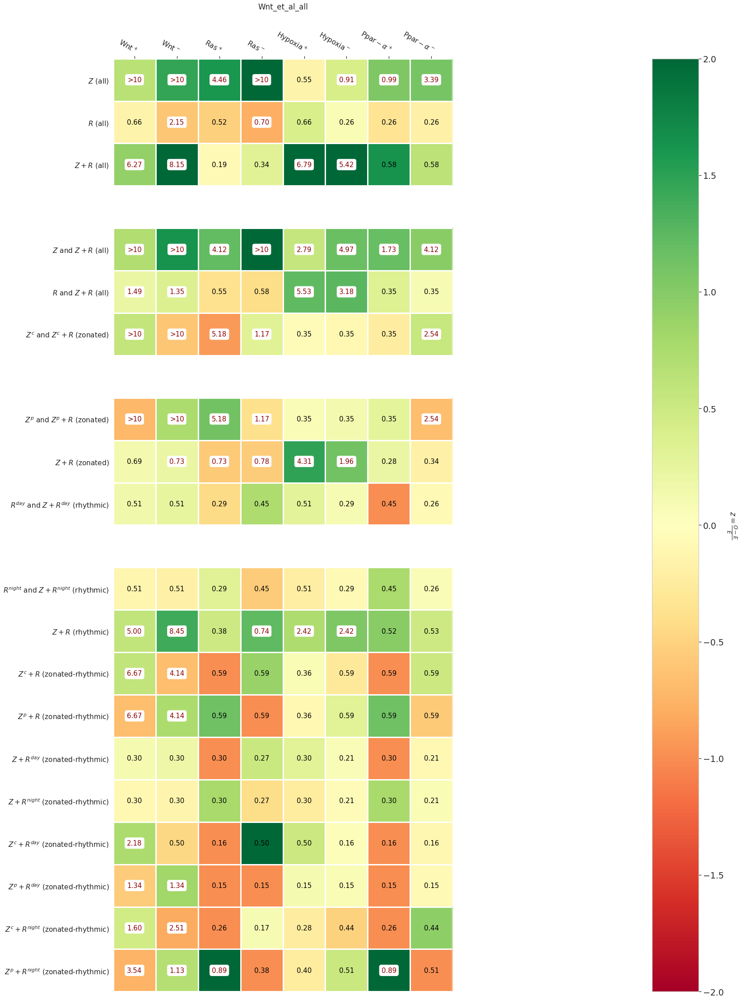

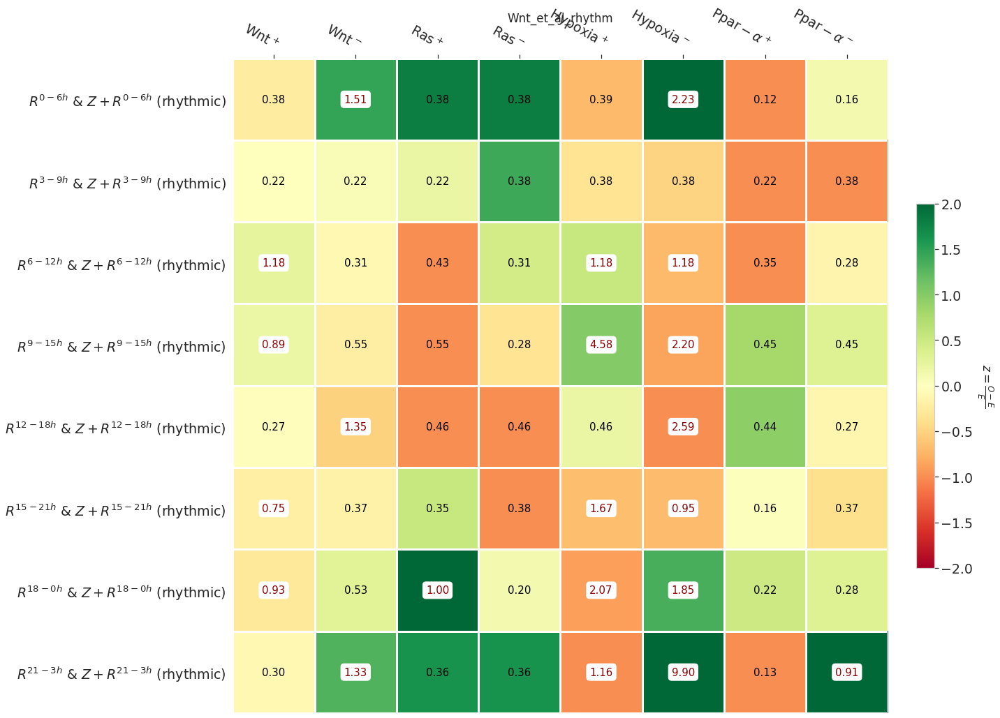

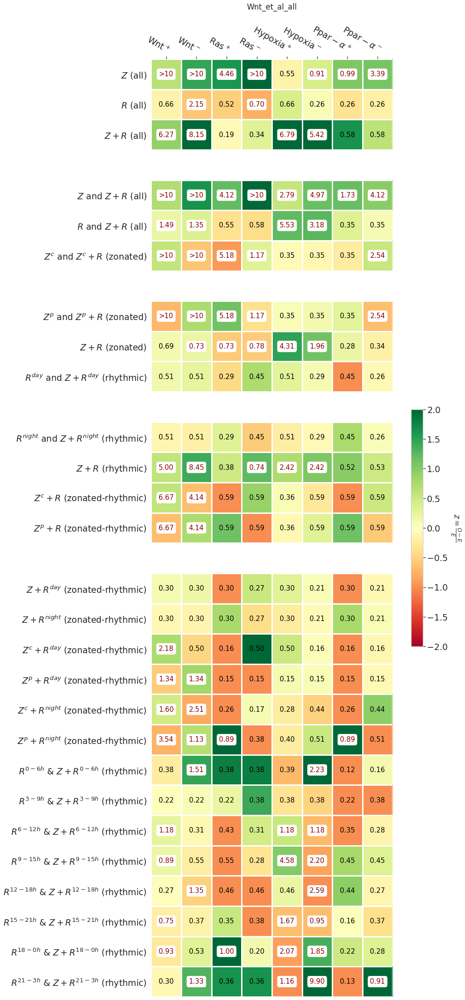

In [41]:
#plot all pathways type Ras, Wnt, Hypox etc
l_dic_clusters = [dic_cluster, dic_cluster_wnt_up, dic_cluster_wnt_down, dic_cluster_ras_up, dic_cluster_ras_down, 
                  dic_cluster_hypox_up, dic_cluster_hypox_down, dic_cluster_ppar_up, dic_cluster_ppar_down]
l_names = ['All genes',r'$\mathrm{Wnt}^+$', r'$\mathrm{Wnt}^-$', r'$\mathrm{Ras}^+$', r'$\mathrm{Ras}^-$', 
           r'$\mathrm{Hypoxia}^+$', r'$\mathrm{Hypoxia}^-$', r'$\mathrm{Ppar-}\alpha^+$', r'$\mathrm{Ppar-}\alpha^-$']

#all
l_cat = [r'$Z$', r'$R$', r'$Z+R$',  r'$Z$ and $Z+R$', r'$R$ and $Z+R$'] + \
        [r'$Z^c$ and $Z^c+R$', r'$Z^p$ and $Z^p+R$', r'$Z+R$'] + \
        [r'$R^{day}$ and $Z+R^{day}$', r'$R^{night}$ and $Z+R^{night}$', r'$Z+R$'] + \
        [r'$Z^c+R$',r'$Z^p+R$',  r'$Z+R^{day}$', r'$Z+R^{night}$'] + \
        [r'$Z^c+R^{day}$', r'$Z^p+R^{day}$',  r'$Z^c+R^{night}$', r'$Z^p+R^{night}$']
        
l_back =['all','all', 'all','all', 'all'] + \
        ['zonated', 'zonated', 'zonated'] + \
        ['rhythmic', 'rhythmic','rhythmic'] + \
        ['zonated-rhythmic',  'zonated-rhythmic', 'zonated-rhythmic', 'zonated-rhythmic'] + \
        ['zonated-rhythmic', 'zonated-rhythmic', 'zonated-rhythmic', 'zonated-rhythmic']

plot_categories_sumup(l_dic_clusters, l_names,'Wnt_et_al_all',
                      x = l_cat, l_background = l_back, l_rows_to_skip = [3,6,9], size = (len(l_names)*22+0,len(l_cat)*2+0))

#rhythm specific analysis
l_cat2 = [r'$R^{0-6h}$ & $Z+R^{0-6h}$', r'$R^{3-9h}$ & $Z+R^{3-9h}$', r'$R^{6-12h}$ & $Z+R^{6-12h}$', 
         r'$R^{9-15h}$ & $Z+R^{9-15h}$', r'$R^{12-18h}$ & $Z+R^{12-18h}$', r'$R^{15-21h}$ & $Z+R^{15-21h}$', 
         r'$R^{18-0h}$ & $Z+R^{18-0h}$', r'$R^{21-3h}$ & $Z+R^{21-3h}$',]
l_back2 = ['rhythmic']*len(l_cat)
plot_categories_sumup(l_dic_clusters, l_names,'Wnt_et_al_rhythm',
                      x = l_cat2, l_background = l_back2, size = (len(l_names)*2+0,len(l_cat)*2+0), threshold_pv = 0.2 )

#final plot
#rhythm specific analysis

dic_wnt_all = plot_categories_sumup(l_dic_clusters, l_names,'Wnt_et_al_all',
                      x = l_cat+l_cat2, l_background = l_back + l_back2, l_rows_to_skip = [3,6,9,13], size = (len(l_names)*2+0,len(l_cat)*2+0), threshold_pv = 0.2 )

## 7. KEGG analysis

290


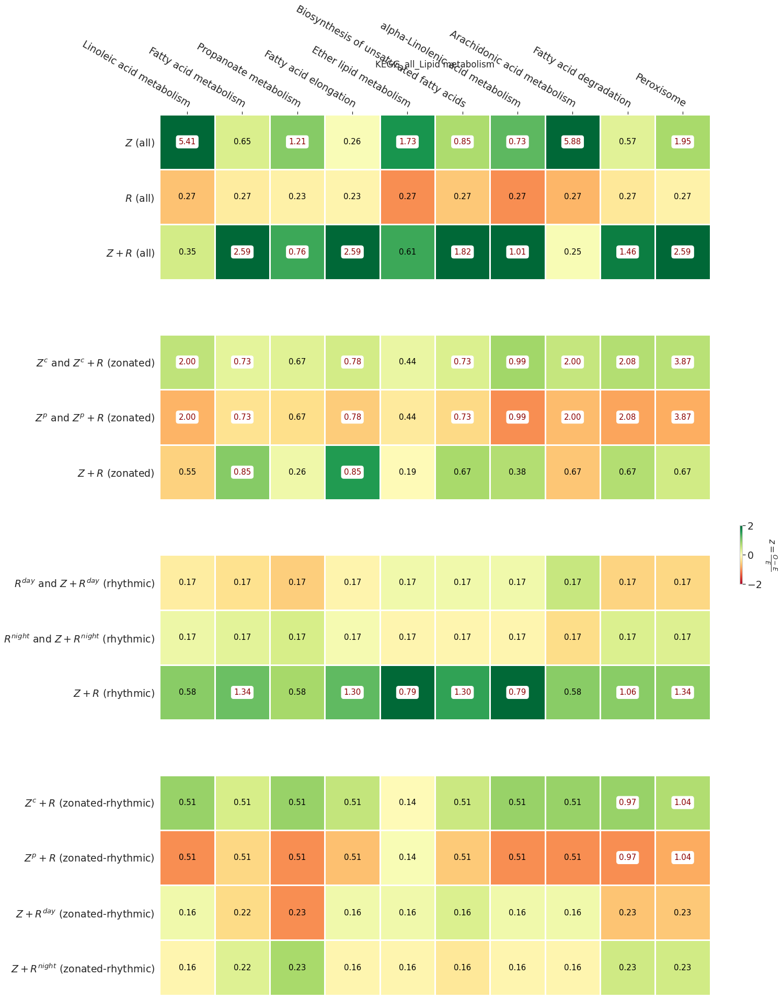

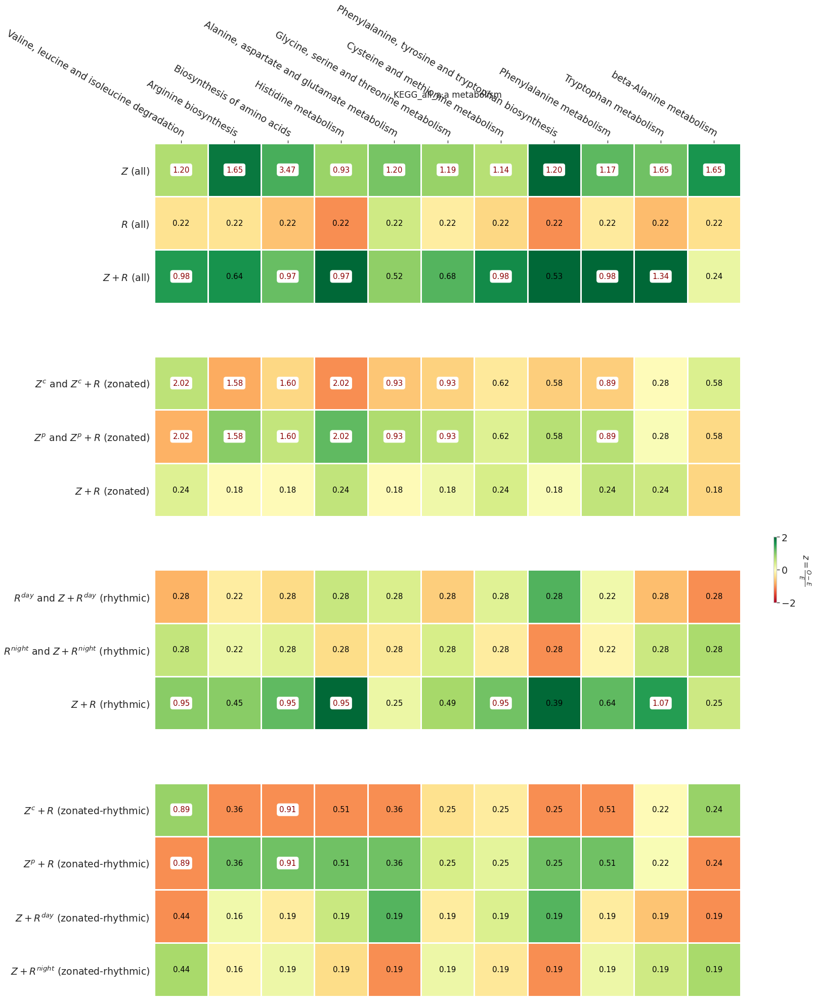

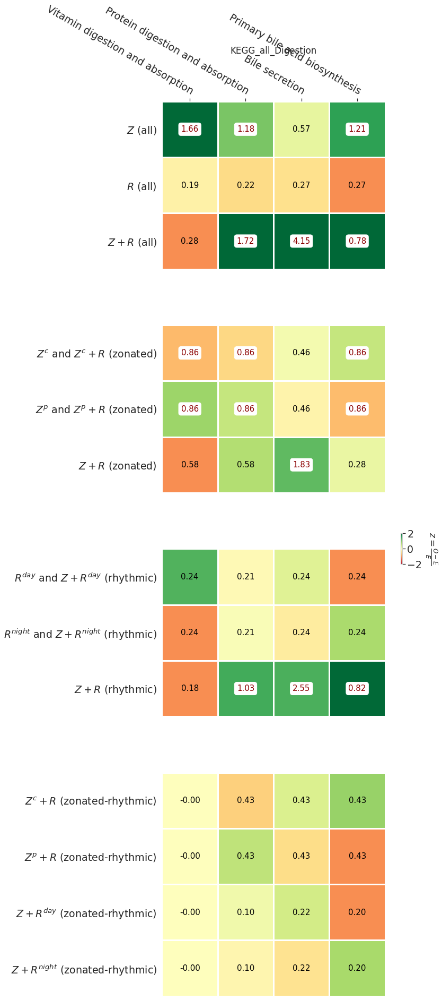

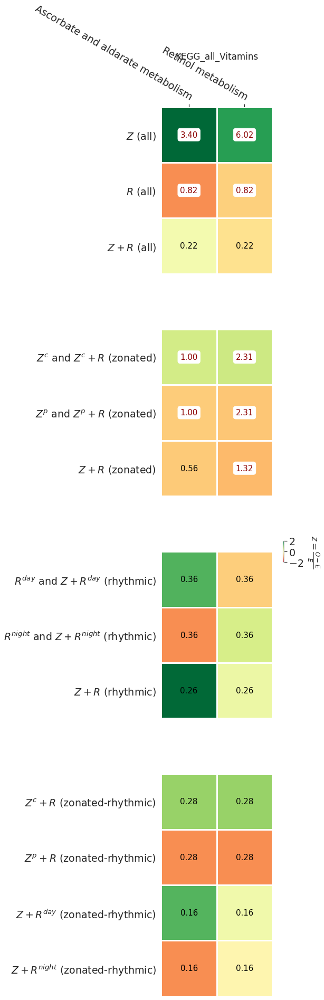

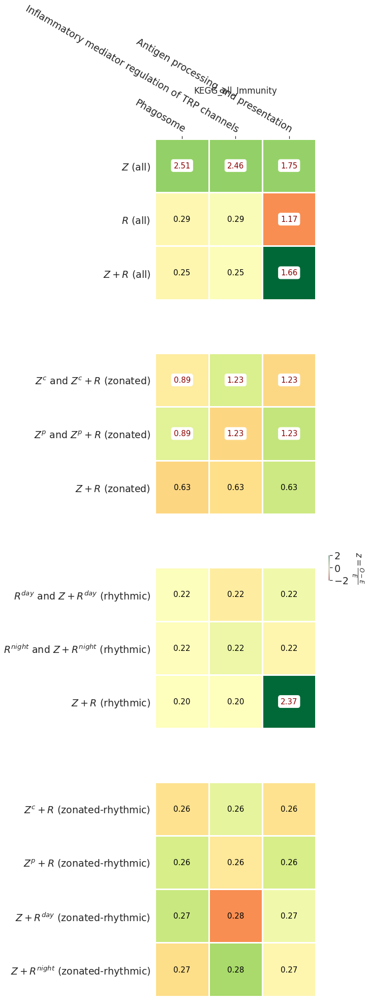

...

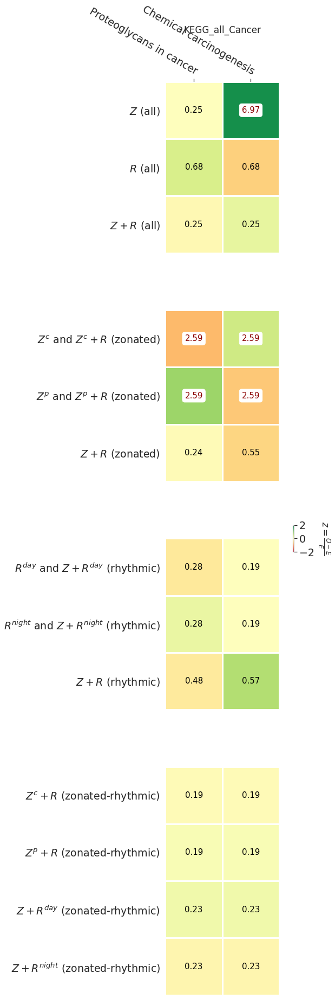

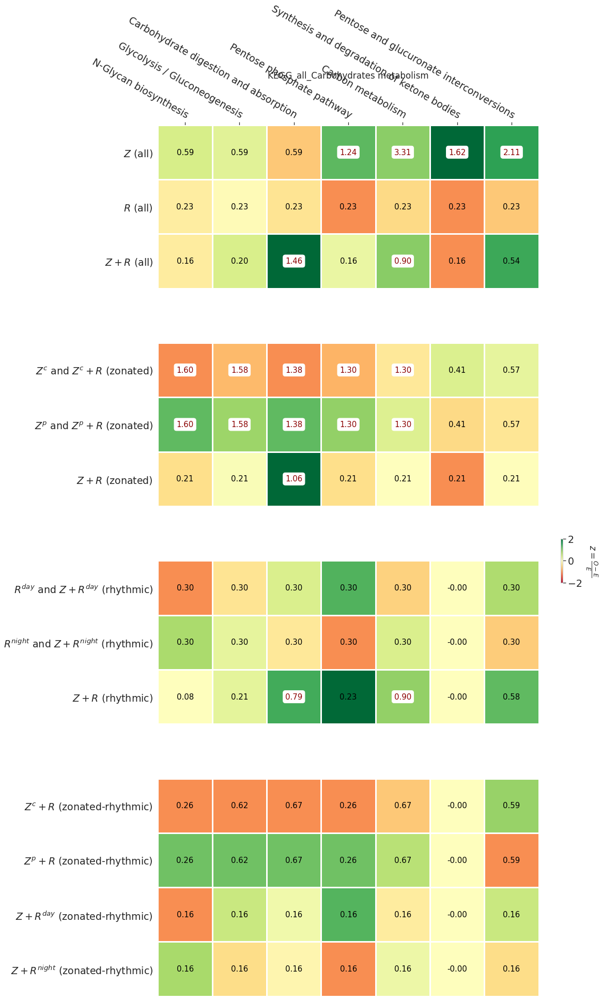

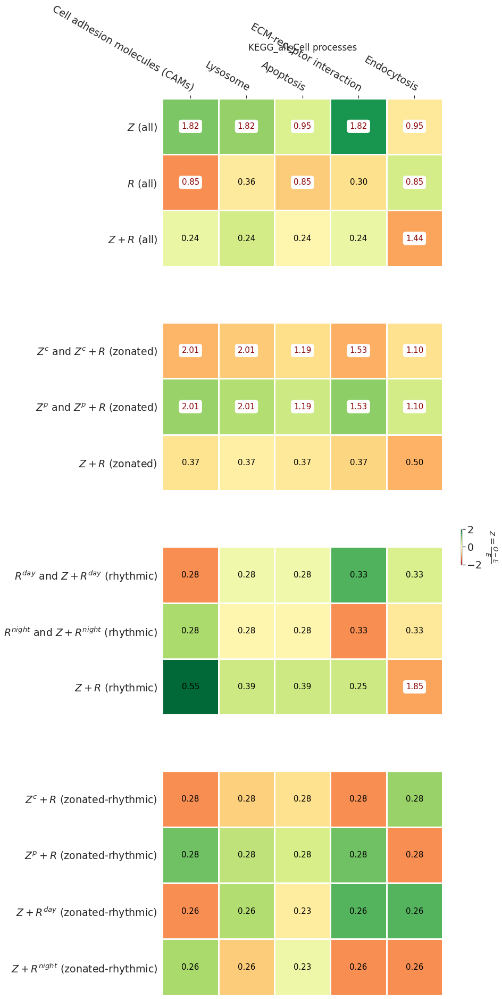

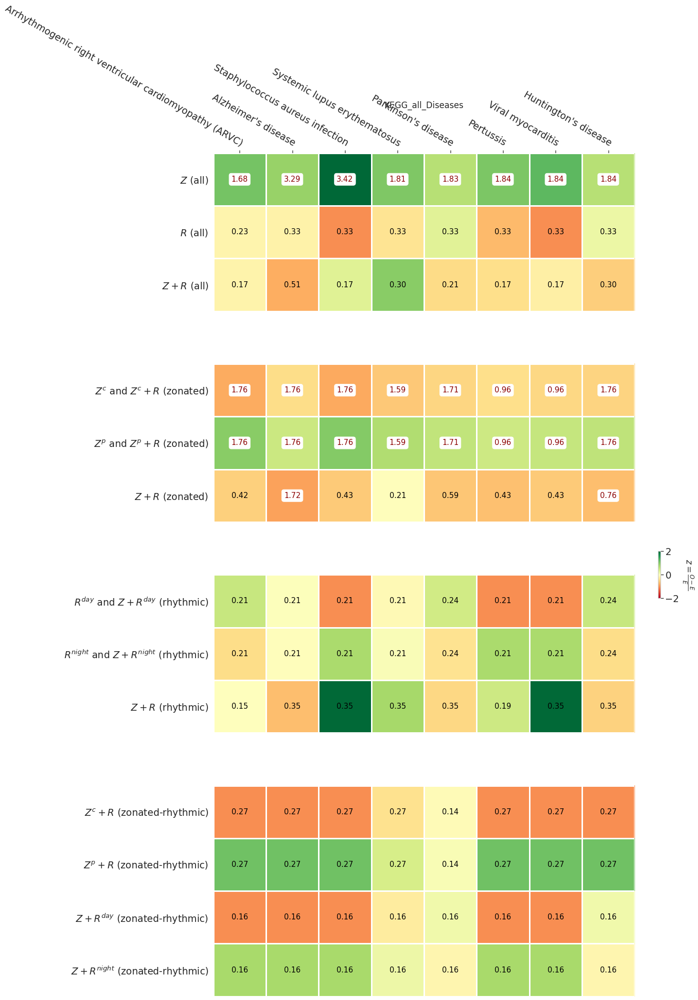

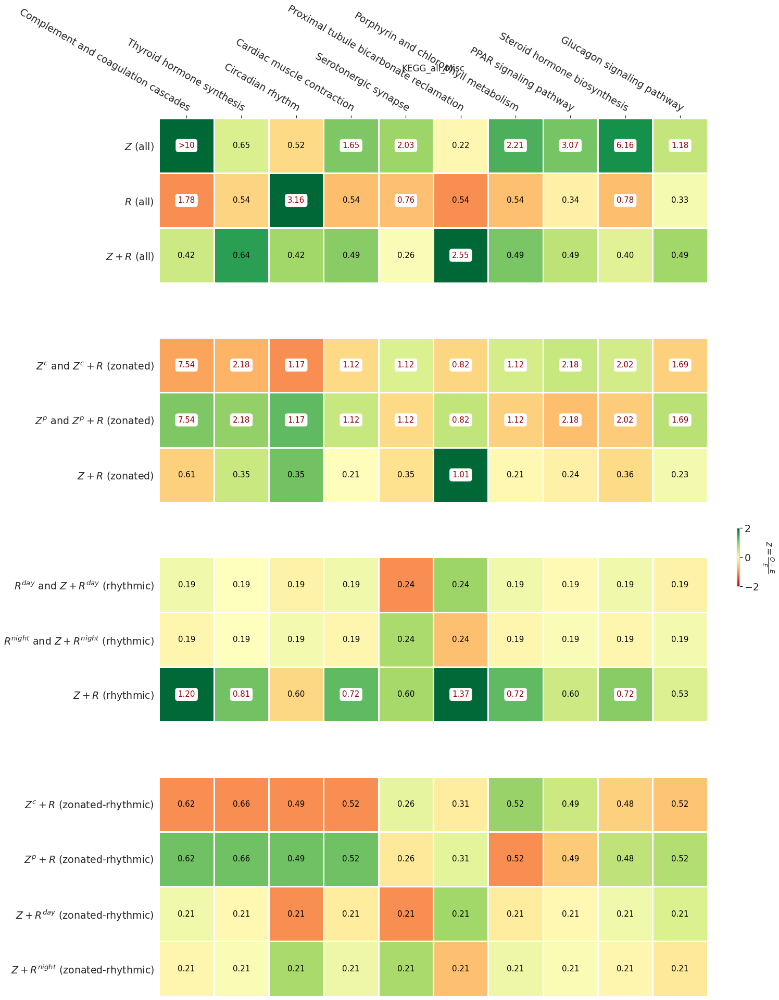

In [42]:
#same with KEGG
#create dic of patwhays
dic_path_complete = {}
dic_path_id_complete = {}

dic_path = {}
dic_id = {}
for line in open("Datasets/KEGG/kegg.mmu.gmt", "r" ):
    l_terms = line.split("\t")
    id_pathway = l_terms[0]
    name_pathway = l_terms[1]
    list_genes = l_terms[3:-1]
    dic_path[name_pathway] = list_genes
    dic_id[name_pathway] = id_pathway

dic_path_complete = copy.deepcopy(dic_path)
dic_path_id_complete = copy.deepcopy(dic_id)

#filter pathway
set_path_genes = set([])
dic_path_clean = {}
for path, l_name in dic_path.items():
    l = [x.lower() for x in l_name if x.lower() in dic_reg]
    if len(l)>=3 and len(l)<=500:
        dic_path_clean[path] = l
        set_path_genes.update(l)
dic_path = dic_path_clean

print(len(dic_path))

#create list of dic_clusters which are themselves clustered
dic_l_names = {'Lipid metabolism': set(['alpha-Linolenic acid metabolism', 'Fatty acid degradation', 'Linoleic acid metabolism',
                                          'Arachidonic acid metabolism','Fatty acid elongation', 'Biosynthesis of unsaturated fatty acids',
                                          'Fatty acid metabolism', 'Ether lipid metabolism', 'Peroxisome', 'Propanoate metabolism']),
                  'a.a metabolism': set(['Valine, leucine and isoleucine degradation', 'beta-Alanine metabolism', 'Tryptophan metabolism',
                                        'Cysteine and methionine metabolism', 'Phenylalanine, tyrosine and tryptophan biosynthesis',
                                        'Biosynthesis of amino acids', 'Phenylalanine metabolism', 'Glycine, serine and threonine metabolism',
                                        'Tyrosine metabolism', 'Alanine, aspartate and glutamate metabolism', 'Arginine biosynthesis',
                                        'Histidine metabolism']),
                  'Digestion': set(['Primary bile acid biosynthesis', 'Bile secretion', 'Protein digestion and absorption',
                                    'Vitamin digestion and absorption']),
                  'Vitamins': set(['Retinol metabolism', 'Ascorbate and aldarate metabolism']),
                  'Immunity': set(['Inflammatory mediator regulation of TRP channels', 'Phagosome', 'Antigen processing and presentation']),
                  'Translational and post-translational processes': set(['Proteasome', 'Ribosome', 'Protein processing in endoplasmic reticulum',
                                                                        'RNA transport', 'cGMP-PKG signaling pathway', 'Oxidative phosphorylation']),
                  'Energy': set(['Butanoate metabolism', 'Citrate cycle (TCA cycle)', 'AMPK signaling pathway']),
                  'Detoxification': set(['Drug metabolism - cytochrome P450', 'Metabolism of xenobiotics by cytochrome P450',
                                         'Drug metabolism - other enzymes', 'Glutathione metabolism']),
                  'Cancer': set(['Chemical carcinogenesis', 'Prostate cancer', 'Proteoglycans in cancer']),
                  'Carbohydrates metabolism': set(['N-Glycan biosynthesis', 'Carbohydrate digestion and absorption', 'Carbon metabolism', 
                                                   'Pentose and glucuronate interconversions', 'Synthesis and degradation of ketone bodies',
                                                   'Pentose phosphate pathway', 'Glycolysis / Gluconeogenesis']),
                  'Cell processes': set(['Endocytosis', 'Apoptosis', 'Lysosome', 
                                         'ECM-receptor interaction','Cell adhesion molecules (CAMs)']),
                  'Diseases': set(['Alzheimer\'s disease', 'Parkinson\'s disease', 'Huntington\'s disease', 'Pertussis', 
                                   'Staphylococcus aureus infection', 'Systemic lupus erythematosus', 'Viral myocarditis',
                                   'Arrhythmogenic right ventricular cardiomyopathy (ARVC)']),
                  'Misc': set(['PPAR signaling pathway', 'Steroid hormone biosynthesis', 'Porphyrin and chlorophyll metabolism',
                               'Serotonergic synapse', 'Circadian rhythm', 'Glucagon signaling pathway', 
                               'Proximal tubule bicarbonate reclamation', 'Cardiac muscle contraction',
                               'Complement and coagulation cascades', 'Thyroid hormone synthesis' ]),
                 }


for cluster_pathway in dic_l_names.keys():
    l_names = list(dic_l_names[cluster_pathway])
    l_dic_cluster = []
    for name_path in l_names:
        path = dic_path[name_path]
        l_dic_cluster.append(compute_dic_cluster({name_gene:dic_reg[name_gene] for name_gene in path}))

    #all
    l_cat = [r'$Z$', r'$R$', r'$Z+R$'] + \
            [r'$Z^c$ and $Z^c+R$', r'$Z^p$ and $Z^p+R$', r'$Z+R$'] + \
            [r'$R^{day}$ and $Z+R^{day}$', r'$R^{night}$ and $Z+R^{night}$', r'$Z+R$'] + \
            [r'$Z^c+R$',r'$Z^p+R$',  r'$Z+R^{day}$', r'$Z+R^{night}$']

    l_back =['all','all', 'all'] + \
            ['zonated', 'zonated', 'zonated'] + \
            ['rhythmic', 'rhythmic','rhythmic'] + \
            ['zonated-rhythmic',  'zonated-rhythmic', 'zonated-rhythmic', 'zonated-rhythmic']

    plot_categories_sumup([dic_cluster]+ l_dic_cluster, ['All genes'] + l_names,'KEGG_all_' + cluster_pathway, 
                          clean = True,frac = 0.004, x = l_cat, l_background = l_back, sort = [[3],[4]],
                          dic_id = dic_id, l_rows_to_skip = [3,6,9], size = (len(l_names)*2+5,len(l_cat)*2+5))


    """
    #rhythm specific analysis
    l_cat = [r'$R^{0-6h}$ & $Z+R^{0-6h}$', r'$R^{3-9h}$ & $Z+R^{3-9h}$', r'$R^{6-12h}$ & $Z+R^{6-12h}$', 
             r'$R^{9-15h}$ & $Z+R^{9-15h}$', r'$R^{12-18h}$ & $Z+R^{12-18h}$', r'$R^{15-21h}$ & $Z+R^{15-21h}$', 
             r'$R^{18-0h}$ & $Z+R^{18-0h}$', r'$R^{21-3h}$ & $Z+R^{21-3h}$',]
    l_back = ['rhythmic']*len(l_cat)
    plot_categories_sumup([dic_cluster]+ l_dic_cluster, ['All genes'] + l_names,'KEGG_rhythm_' + cluster_pathway, 
                          clean = True,frac = 0.004, x = l_cat, l_background = l_back, sort = 'cluster',
                          dic_id = dic_id, threshold_pv = 0.2, size = (len(l_names)*2+5,len(l_cat)*2+5) )
    """


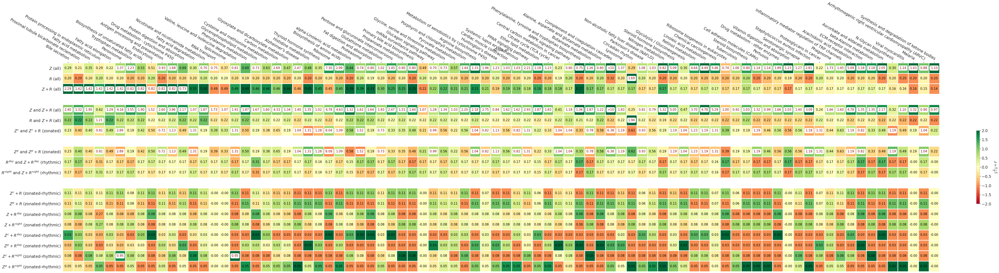

In [43]:
#create list of dic_clusters 
l_dic_cluster = []
l_names = []
for key, path in dic_path.items():
    l_names.append(key)
    l_dic_cluster.append(compute_dic_cluster({name:dic_reg[name] for name in path}))

#all
l_cat = [r'$Z$', r'$R$', r'$Z+R$'] + \
        [r'$Z$ and $Z+R$', r'$R$ and $Z+R$'] + \
        [r'$Z^c$ and $Z^c+R$', r'$Z^p$ and $Z^p+R$'] + \
        [r'$R^{day}$ and $Z+R^{day}$', r'$R^{night}$ and $Z+R^{night}$'] + \
        [r'$Z^c+R$',r'$Z^p+R$',  r'$Z+R^{day}$', r'$Z+R^{night}$'] + \
        [r'$Z^c+R^{day}$', r'$Z^p+R^{day}$',  r'$Z^c+R^{night}$', r'$Z^p+R^{night}$']

l_back =['all','all', 'all'] + \
        ['all','all'] + \
        ['zonated', 'zonated'] + \
        ['rhythmic', 'rhythmic'] + \
        ['zonated-rhythmic',  'zonated-rhythmic', 'zonated-rhythmic', 'zonated-rhythmic'] + \
        ['zonated-rhythmic', 'zonated-rhythmic', 'zonated-rhythmic', 'zonated-rhythmic']
        
r = plot_categories_sumup([dic_cluster]+ l_dic_cluster, ['All genes'] + l_names,'KEGG_all', 
                      clean = True,frac = 0.004, x = l_cat, l_background = l_back, sort = [[2],[]],
                      dic_id = dic_id, threshold_pv = 0.1, l_rows_to_skip = [3,6,9], size = (80,80))


Plot profiles of all clock genes

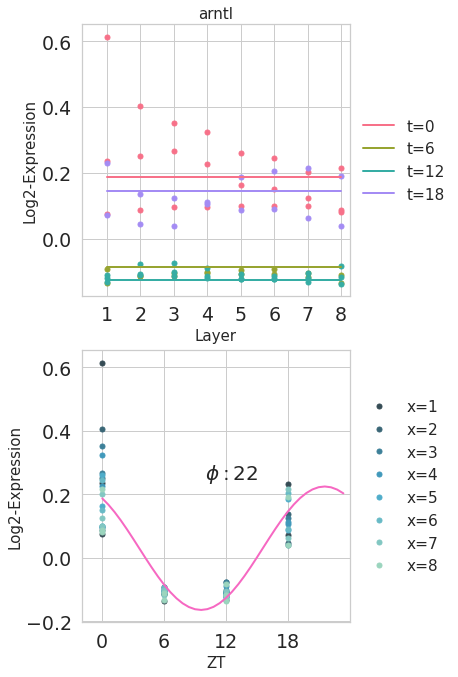

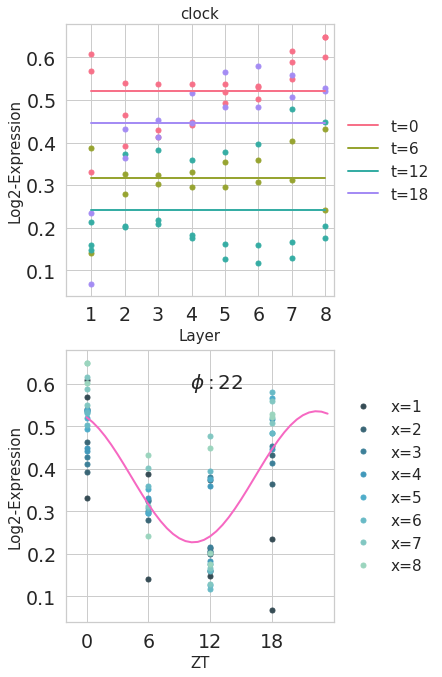

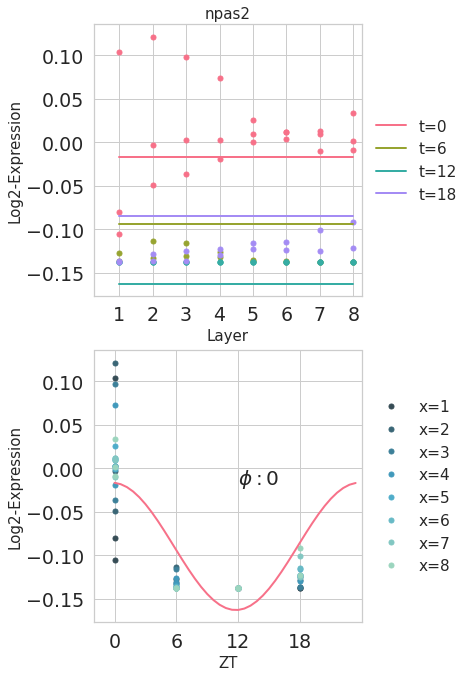

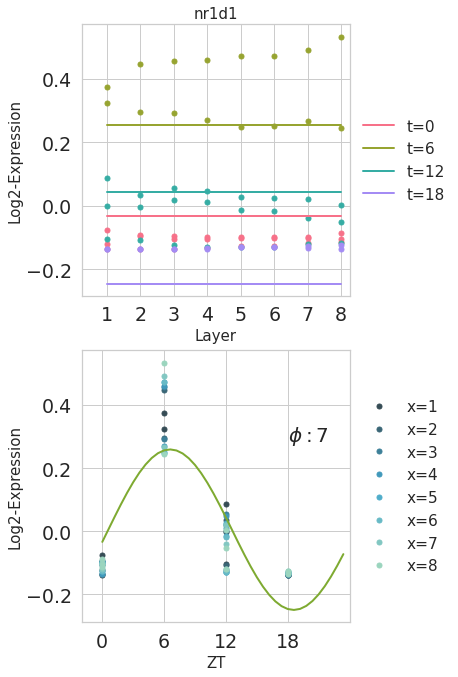

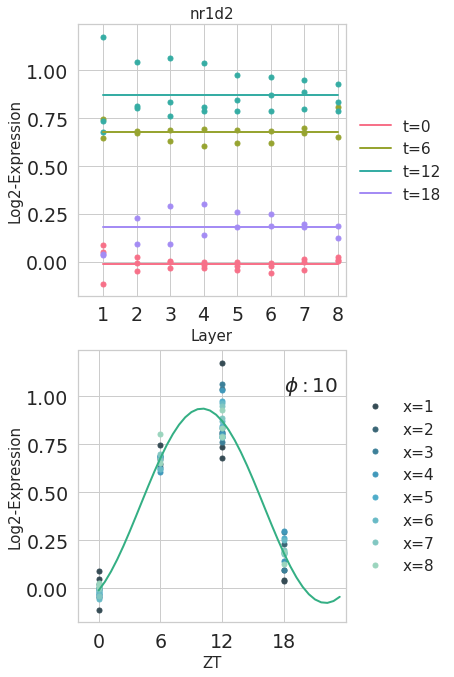

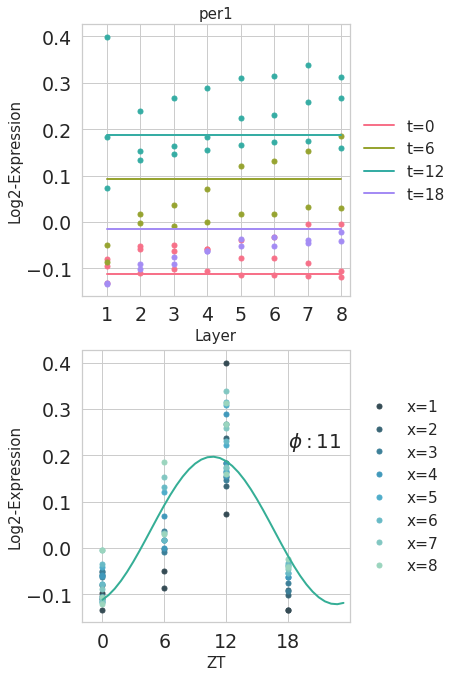

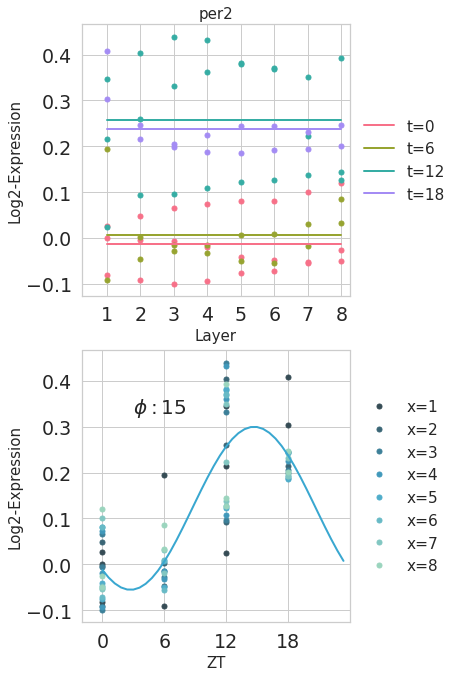

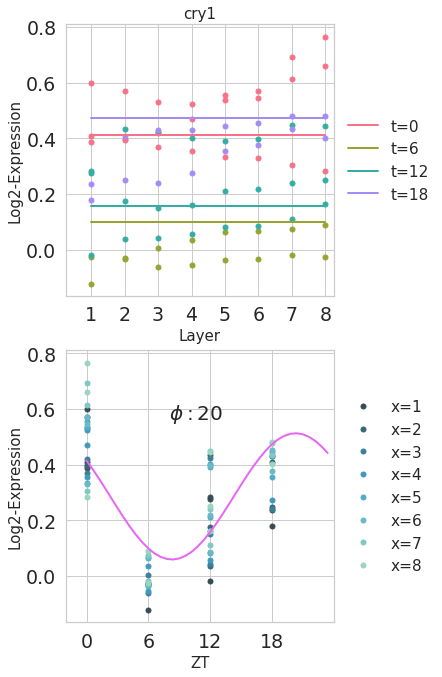

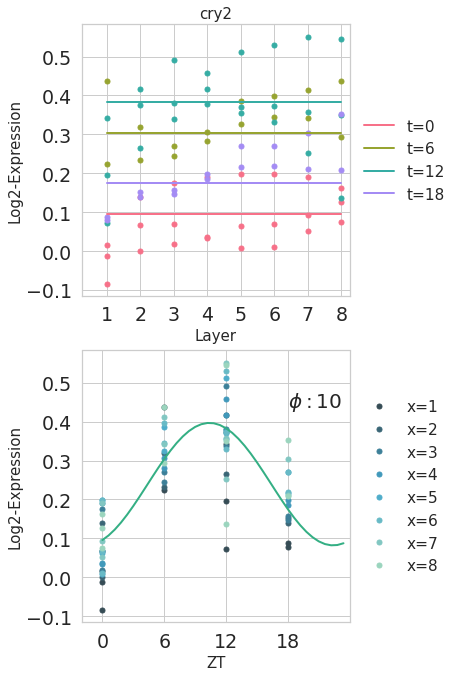

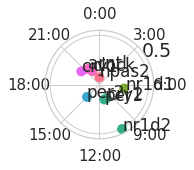

In [44]:
l_core_clock = ['arntl', 'clock', 'npas2', 'nr1d1', 'nr1d2', 'per1', 'per2', 'cry1', 'cry2']
l_theta = []
l_r = []
l_color = []
for name in l_core_clock:
    amplitude, phase = plot_gene_with_fit_alt(name, title = name, annotate_phase = True, force_R = 'True')
    l_r.append(amplitude)
    l_theta.append(phase/24*2*np.pi)
    l_color.append(color3[int(round(phase))])
#scatter plot to sum up eveyything
fig = plt.figure(figsize=(3,6))    
ax = fig.add_subplot(111, projection='polar')    

# set the lable go clockwise and start from the top
ax.set_theta_zero_location("N")
# clockwise
ax.set_theta_direction(-1)
ax.set_rlabel_position(60)  # get radial labels away from plotted line

ax.set_ylim([0,0.55])
# set the label
ticks = ['0:00', '3:00', '6:00', '9:00', '12:00', '15:00', '18:00', '21:00']
ax.set_xticklabels(ticks, fontsize=15)
ax.scatter(l_theta, l_r, c=l_color, s = 80)
for theta, r, name in zip(l_theta, l_r, l_core_clock): 
    ax.annotate(name, (theta+0.01, r+0.01))
    
plt.tight_layout()
plt.savefig('Output/Fits/all.pdf')
plt.show()
plt.close()

Trial with detailed radar plot per pathway

## 8. Wnt et al analysis

Useful functions for multicolored lines

In [45]:
import matplotlib.collections as mcoll

def colorline(x, y, z=None, cmap='copper', norm=plt.Normalize(0.0, 1.0), linewidth=3, alpha=1.0):

    # Default colors equally spaced on [0,1]:
    if z is None:
        z = np.linspace(0.0, 1.0, len(x))

    # Special case if a single number:
    # to check for numerical input -- this is a hack
    if not hasattr(z, "__iter__"):
        z = np.array([z])

    z = np.asarray(z)

    segments = make_segments(x, y)
    lc = mcoll.LineCollection(segments, array=z, cmap=cmap, norm=norm, linewidth=linewidth, alpha=alpha)

    ax = plt.gca()
    ax.add_collection(lc)

    return lc

def make_segments(x, y):
    """
    Create list of line segments from x and y coordinates, in the correct format
    for LineCollection: an array of the form numlines x (points per line) x 2 (x
    and y) array
    """

    points = np.array([x, y]).T.reshape(-1, 1, 2)
    segments = np.concatenate([points[:-1]-0.01, points[1:]], axis=1)
    return segments

def interpolate_phase_and_colors(x,z, correct_for_z = True):
    if correct_for_z:
        z_corr = []
        for pv in z:
            #if abs(pv)>0.2:
            #    z_corr.append(0.5)
            if False:
                pass
            else:
                if pv>0:
                    z_corr.append(1-pv)
                else:
                    z_corr.append(-pv)
        z = z_corr
    l_x_interpolated = []
    l_z_interpolated = []
    for x1,x2,z1,z2 in zip(x[:-1], x[1:], z[:-1], z[1:]):
        l_x_interpolated.extend([i for i in np.linspace(x1,x2,100,endpoint = True)])
        l_z_interpolated.extend([i for i in np.linspace(z1,z2,100,endpoint = True)])
    return l_x_interpolated, l_z_interpolated
        

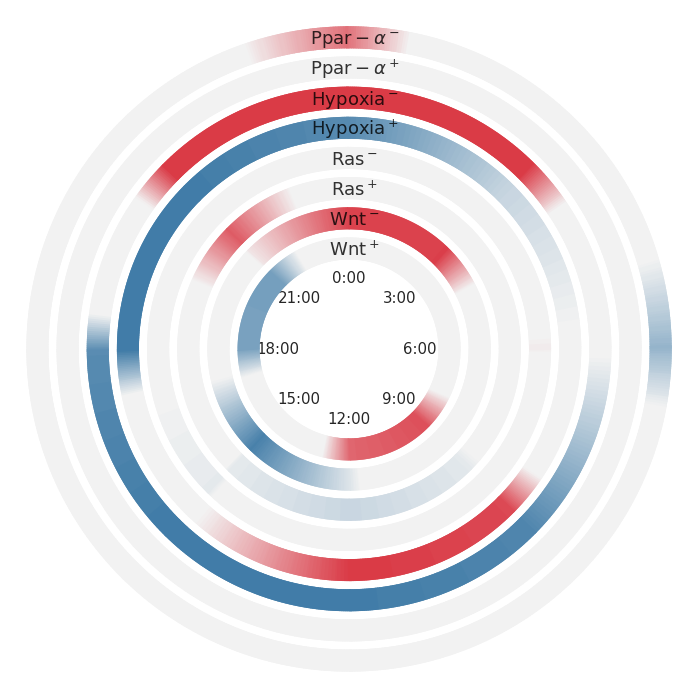

In [46]:
#all
l_cat = [r'$Z$', r'$R$', r'$Z+R$',r'$Z$ and $Z+R$', r'$R$ and $Z+R$'] + \
        [r'$Z^c$ and $Z^c+R$', r'$Z^p$ and $Z^p+R$', r'$Z+R$'] + \
        [r'$R^{day}$ and $Z+R^{day}$', r'$R^{night}$ and $Z+R^{night}$', r'$Z+R$'] + \
        [r'$Z^c+R$',r'$Z^p+R$',  r'$Z+R^{day}$', r'$Z+R^{night}$'] + \
        [r'$Z^c+R^{day}$', r'$Z^p+R^{day}$',  r'$Z^c+R^{night}$', r'$Z^p+R^{night}$']
        
l_back =['all','all', 'all','all', 'all'] + \
        ['zonated', 'zonated', 'zonated'] + \
        ['rhythmic', 'rhythmic','rhythmic'] + \
        ['zonated-rhythmic',  'zonated-rhythmic', 'zonated-rhythmic', 'zonated-rhythmic'] + \
        ['zonated-rhythmic', 'zonated-rhythmic', 'zonated-rhythmic', 'zonated-rhythmic']

l_cat_rhythm = [r'$R^{0-6h}$ & $Z+R^{0-6h}$', r'$R^{3-9h}$ & $Z+R^{3-9h}$', r'$R^{6-12h}$ & $Z+R^{6-12h}$', 
         r'$R^{9-15h}$ & $Z+R^{9-15h}$', r'$R^{12-18h}$ & $Z+R^{12-18h}$', r'$R^{15-21h}$ & $Z+R^{15-21h}$', 
         r'$R^{18-0h}$ & $Z+R^{18-0h}$', r'$R^{21-3h}$ & $Z+R^{21-3h}$']      
        
l_cat += l_cat_rhythm

l_phase_scal = [3, 6, 9, 12, 15, 18, 21, 24, 27]

l_back += ['rhythmic']*len(l_cat_rhythm)

l_cat = [x.replace('$', '').replace('^', '').replace('{', '').replace('}', '') + ' (' +back+ ')' for x, back in zip(l_cat, l_back)]

pv_sig = 0.05
dic_l_phase = {}
dic_l_pv = {}
l_name_pathways = []
l_name_pathways_clean = []
for cat in l_cat[-len(l_cat_rhythm):]:
    #print(cat, dic_wnt_all[cat])
    ll_genes_observed = dic_wnt_all[cat]['Genes observed']
    l_name_pathways = dic_wnt_all[cat]['Name']
    l_name_pathways_clean = dic_wnt_all[cat]['Name clean']
    l_pv = dic_wnt_all[cat]['Hypergeometric p-value']
    l_z = dic_wnt_all[cat]['z']
    for idx, name in enumerate(l_name_pathways):
        pv = l_pv[idx]
        z = l_z[idx]
        phase0 = cat.split('-')[0][1:]
        phase1 = cat.split('-')[1].split('h')[0]
        if name in dic_l_phase:
            dic_l_phase[name].append([int(phase0), int(phase1)])
            dic_l_pv[name].append(pv if z>0 else -pv)
        else:
            dic_l_phase[name]= [[int(phase0), int(phase1)]]
            dic_l_pv[name] = [pv if z>0 else -pv]
            
            
#scatter plot to sum up eveyything
fig = plt.figure(figsize=(10,10))    
ax = fig.add_subplot(111, projection='polar')    

# set the lable go clockwise and start from the top
ax.set_theta_zero_location("N")
# clockwise
ax.set_theta_direction(-1)
ax.set_rlabel_position(60)  # get radial labels away from plotted line
ax.set_yticklabels([])
ax.set_ylim([84,118])
# set the label
ticks = ['0:00', '3:00', '6:00', '9:00', '12:00', '15:00', '18:00', '21:00']
ax.set_xticklabels(ticks, fontsize=15)
ax.tick_params(pad=20)

import matplotlib.colors as clr
test = sn.diverging_palette(240, 10, n=3, center="light")
test = [test[0],test[1],test[1],test[1],test[1],test[2]]
#test = [test[0],test[1],test[2]]
cmap = clr.LinearSegmentedColormap.from_list('custom', test, N=256)


set_label = set([])
for idx, label in enumerate(l_name_pathways):
    ll_phase = dic_l_phase[label]
    l_pv = dic_l_pv[label]
    l_pv+=[l_pv[0]]
    #print(l_pv)
    x,z = interpolate_phase_and_colors(l_phase_scal,l_pv, correct_for_z = True)

    x = np.array(x)/24*2*np.pi
    #x = np.linspace(0,2*np.pi,100,endpoint = True) 
    y = [idx*3+94]*len(x)
    lc = colorline(x, y, z = z, cmap=cmap, linewidth= 22)
    #if idx==0:
    #    plt.colorbar(lc)
    #ax.plot(x, y, lw = 24, label = label if (idxx==0 and label not in set_label) else None, color = pal_dep[int(z*100)] if z<0 else pal_enr[int(z*100)])
    #ax.plot(np.linspace(0,2*np.pi,500,endpoint = True), [3*idx+94+1]*500, lw = 1, color= "grey")
    #ax.plot(np.linspace(0,2*np.pi,500,endpoint = True), [3*idx+94-1]*500, lw = 1, color= "grey")
    ax.text(0.0, 3*idx+94-0.7, '  '+l_name_pathways_clean[idx], horizontalalignment='center', color= 'black', alpha = 0.8,fontsize=18)
    set_label.add(label)
    
        
#plt.legend(loc='upper left', bbox_to_anchor=(1,1))

# Hide grid lines
ax.grid(False)
ax.spines['polar'].set_visible(False)
ax.tick_params(pad = -284)


plt.tight_layout()
plt.savefig('Output/polar.pdf')
plt.show()
plt.close()

Same thing but separating pathways

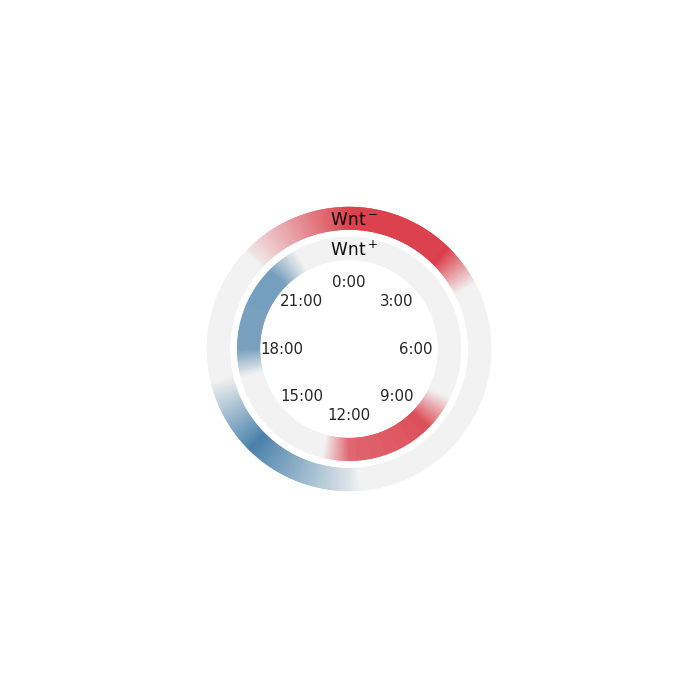

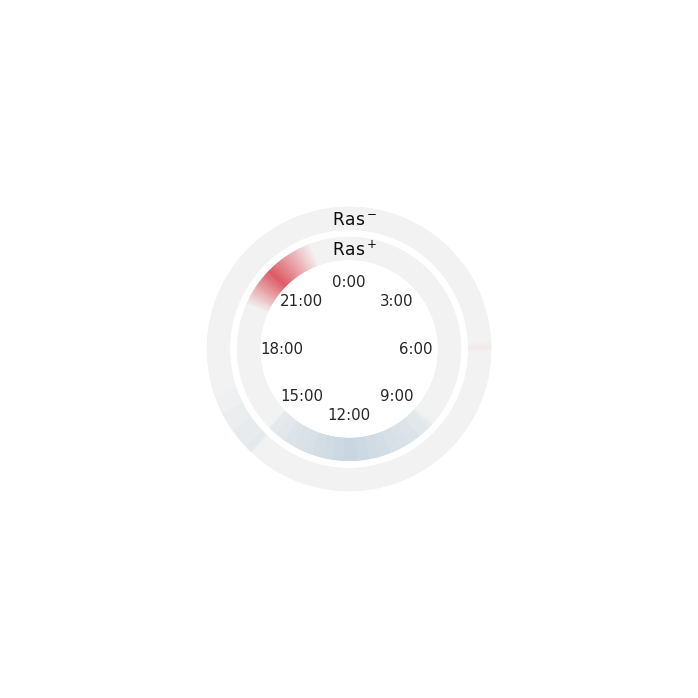

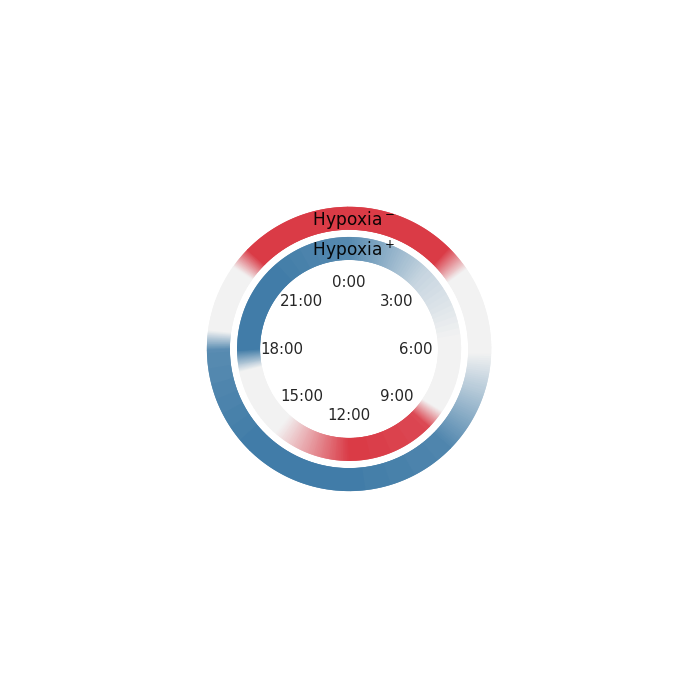

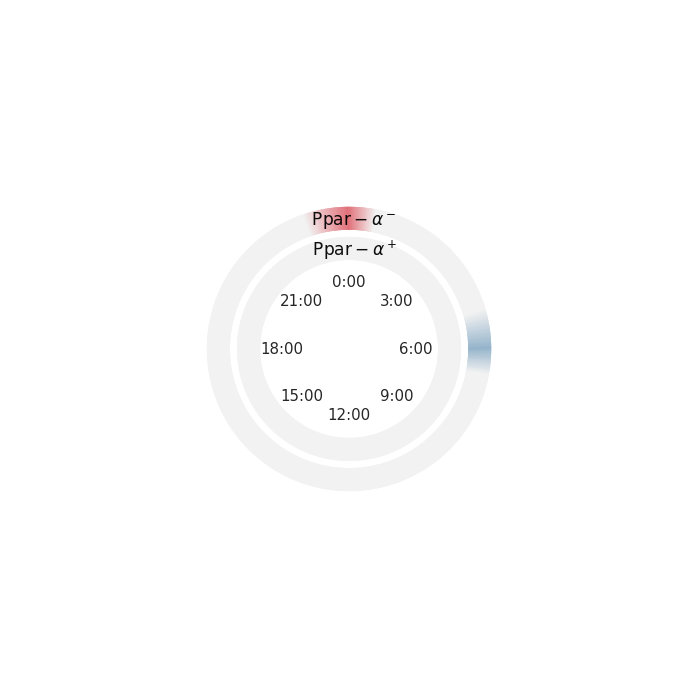

In [47]:
#create list of lists of 2 pathways
ll_name_pathways = [l_name_pathways[i:i+2] for i in range(0,len(l_name_pathways),2)]
ll_name_pathways_clean = [l_name_pathways_clean[i:i+2] for i in range(0,len(l_name_pathways_clean),2)]

for l_name_pathways_sep, l_name_pathways_clean_sep in zip(ll_name_pathways, ll_name_pathways_clean):
    #scatter plot to sum up eveyything
    fig = plt.figure(figsize=(10,10))    
    ax = fig.add_subplot(111, projection='polar')    

    # set the lable go clockwise and start from the top
    ax.set_theta_zero_location("N")
    # clockwise
    ax.set_theta_direction(-1)
    ax.set_rlabel_position(60)  # get radial labels away from plotted line
    ax.set_yticklabels([])
    ax.set_ylim([84,118])
    # set the label
    ticks = ['0:00', '3:00', '6:00', '9:00', '12:00', '15:00', '18:00', '21:00']
    ax.set_xticklabels(ticks, fontsize=15)
    ax.tick_params(pad=20)

    set_label = set([])
    for idx, label in enumerate(l_name_pathways_sep):
        ll_phase = dic_l_phase[label]
        l_pv = dic_l_pv[label]
        l_pv+=[l_pv[0]]
        #print(l_pv)
        x,z = interpolate_phase_and_colors(l_phase_scal,l_pv, correct_for_z = True)

        x = np.array(x)/24*2*np.pi
        #x = np.linspace(0,2*np.pi,100,endpoint = True) 
        y = [idx*3+94]*len(x)
        lc = colorline(x, y, z = z, cmap=cmap, linewidth= 23)
        #if idx==0:
        #    plt.colorbar(lc)
        ax.text(0.0, 3*idx+94-0.7, '  '+l_name_pathways_clean_sep[idx], horizontalalignment='center', color= 'black', alpha = 0.95,fontsize=17)
        set_label.add(label)
    #plt.legend(loc='upper left', bbox_to_anchor=(1,1))
    # Hide grid lines
    ax.grid(False)
    ax.spines['polar'].set_visible(False)
    ax.tick_params(pad = -288)
    plt.tight_layout()
    plt.savefig('Output/polar_'+ l_name_pathways_sep[0]+'.pdf')
    plt.show()
    plt.close()

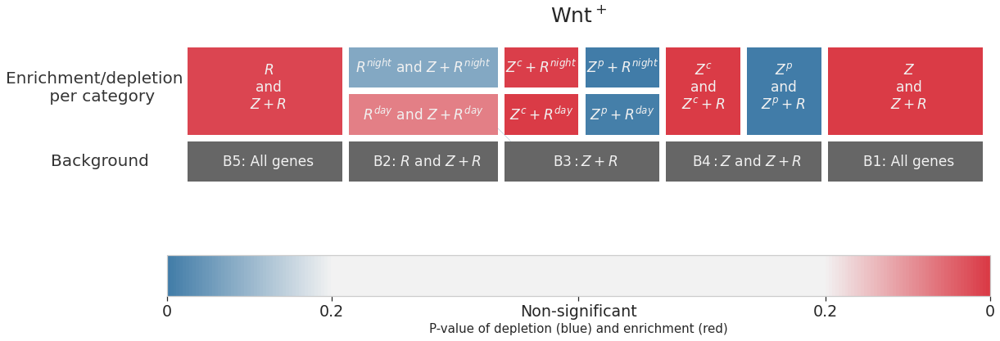

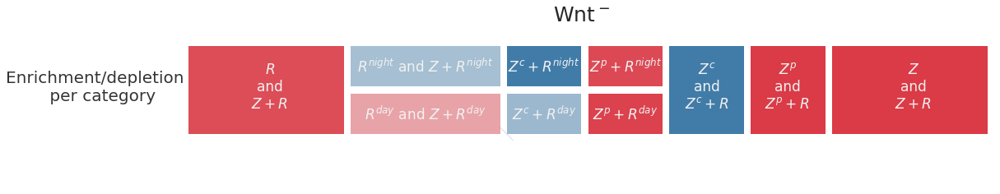

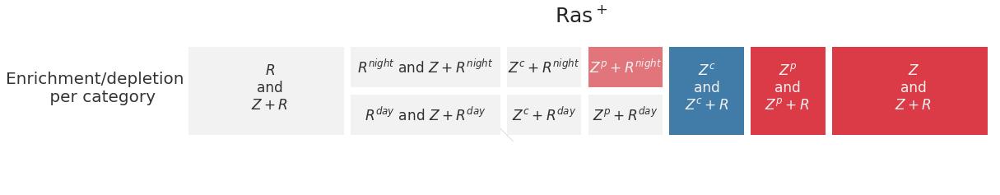

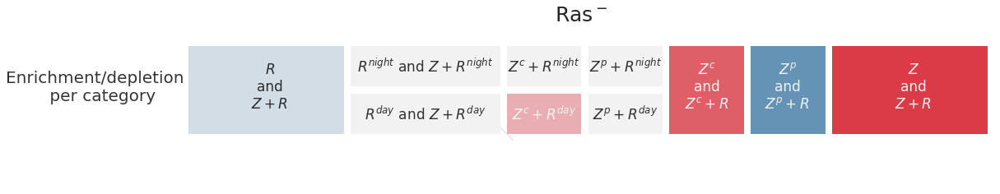

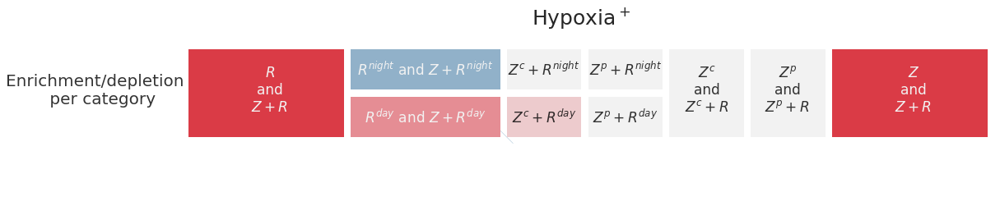

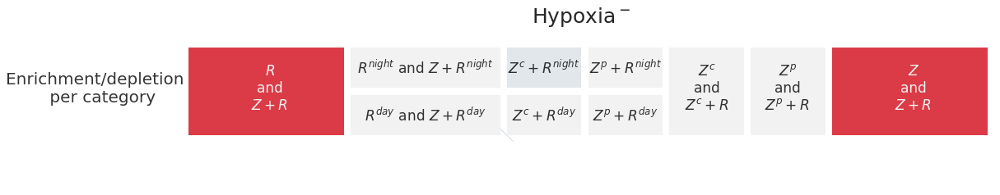

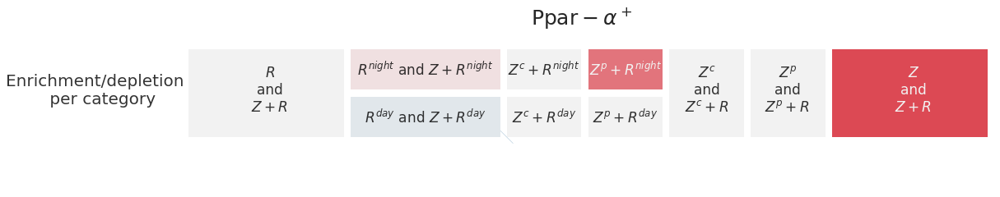

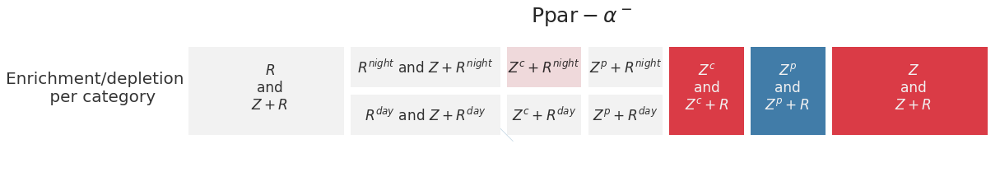

In [48]:
#WARNING: similar code use above, to be changed also if this function is changed
def correct_pv(pv):
    #correct colors
    #if abs(pv)>0.2:
    #    pv = 0.5
    if False:
        pass
    else:
        if pv>0:
            pv = 1-pv
        else:
            pv = -pv
    return pv
    
import matplotlib.colors as colors
import matplotlib.cm as cmx

for idx, label in enumerate(l_name_pathways):
    
    #square with 4 possibilities : day/night and portal/central
    pv_day_c = dic_wnt_all['Zc+Rday (zonated-rhythmic)']['Hypergeometric p-value'][idx]
    if dic_wnt_all['Zc+Rday (zonated-rhythmic)']['z'][idx]<0:
        pv_day_c = -pv_day_c
    pv_day_c = correct_pv(pv_day_c)
    
    pv_day_p = dic_wnt_all['Zp+Rday (zonated-rhythmic)']['Hypergeometric p-value'][idx]
    if dic_wnt_all['Zp+Rday (zonated-rhythmic)']['z'][idx]<0:
        pv_day_p = -pv_day_p
    pv_day_p = correct_pv(pv_day_p)
        
    pv_night_c = dic_wnt_all['Zc+Rnight (zonated-rhythmic)']['Hypergeometric p-value'][idx]
    if dic_wnt_all['Zc+Rnight (zonated-rhythmic)']['z'][idx]<0:
        pv_night_c = -pv_night_c
    pv_night_c =  correct_pv(pv_night_c)
    
    pv_night_p = dic_wnt_all['Zp+Rnight (zonated-rhythmic)']['Hypergeometric p-value'][idx]
    if dic_wnt_all['Zp+Rnight (zonated-rhythmic)']['z'][idx]<0:
        pv_night_p = -pv_night_p
    pv_night_p = correct_pv(pv_night_p)
    
    #night/day only
    pv_day = dic_wnt_all['Rday and Z+Rday (rhythmic)']['Hypergeometric p-value'][idx]
    if dic_wnt_all['Rday and Z+Rday (rhythmic)']['z'][idx]<0:
        pv_day = -pv_day
    pv_day = correct_pv(pv_day) 

    pv_night = dic_wnt_all['Rnight and Z+Rnight (rhythmic)']['Hypergeometric p-value'][idx]
    if dic_wnt_all['Rnight and Z+Rnight (rhythmic)']['z'][idx]<0:
        pv_night = -pv_night
    pv_night = correct_pv(pv_night)
    
    #central/portal only
    pv_c = dic_wnt_all['Zc and Zc+R (zonated)']['Hypergeometric p-value'][idx]
    if dic_wnt_all['Zc and Zc+R (zonated)']['z'][idx]<0:
        pv_c = -pv_c
    pv_c = correct_pv(pv_c)   
    
    pv_p = dic_wnt_all['Zp and Zp+R (zonated)']['Hypergeometric p-value'][idx]
    if dic_wnt_all['Zp and Zp+R (zonated)']['z'][idx]<0:
        pv_p = -pv_p
    pv_p = correct_pv(pv_p) 
    
    #zonation only
    pv_z = dic_wnt_all['Z and Z+R (all)']['Hypergeometric p-value'][idx]
    if dic_wnt_all['Z and Z+R (all)']['z'][idx]<0:
        pv_z = -pv_z
    pv_z = correct_pv(pv_z)   
    
    #rhythm only
    pv_r = dic_wnt_all['R and Z+R (all)']['Hypergeometric p-value'][idx]
    if dic_wnt_all['R and Z+R (all)']['z'][idx]<0:
        pv_r = -pv_r
    pv_r = correct_pv(pv_r)  
    
    fontsize = 17
    
    cNorm  = colors.Normalize(vmin=0, vmax=1)
    scalarMap = cmx.ScalarMappable(norm=cNorm, cmap=cmap)
    #print(pv_day_c, pv_day_p, pv_night_c, pv_night_p)
    import matplotlib.patches as patches
    fig = plt.figure(figsize = (18,10))
    ax1 = fig.add_subplot(111, aspect='equal')
    
    # day/night and portal/central
    ax1.add_patch(patches.Rectangle((0, 0), 5.5, 3, linewidth=0,edgecolor='none',facecolor=scalarMap.to_rgba(pv_day_c)))
    color_text = scalarMap.to_rgba(0.5) if pv_day_c>0.85 or pv_day_c<0.15 else 'black'
    alpha_text = 1 if pv_day_c>0.85 or pv_day_c<0.15 else 0.8
    ax1.text(5.5/2,3/2, r'$Z^c+R^{day}$' , color = color_text, alpha = alpha_text, horizontalalignment='center', verticalalignment='center',fontsize=fontsize)
    
    ax1.add_patch(patches.Rectangle((6, 0), 5.5, 3, linewidth=0,edgecolor='none',facecolor=scalarMap.to_rgba(pv_day_p)))
    color_text = scalarMap.to_rgba(0.5) if pv_day_p>0.85 or pv_day_p<0.15 else 'black'
    alpha_text = 1 if pv_day_p>0.85 or pv_day_p<0.15 else 0.8
    ax1.text(6+5.5/2,3/2, r'$Z^p+R^{day}$', color = color_text, alpha = alpha_text, horizontalalignment='center', verticalalignment='center',fontsize=fontsize)
    
    ax1.add_patch(patches.Rectangle((0, 3.5), 5.5, 3, linewidth=0,edgecolor='none',facecolor=scalarMap.to_rgba(pv_night_c)))
    color_text = scalarMap.to_rgba(0.5) if pv_night_c>0.85 or pv_night_c<0.15 else 'black'
    alpha_text = 1 if pv_night_c>0.85 or pv_night_c<0.15 else 0.8
    ax1.text(5.5/2,3.5+3/2, r'$Z^c+R^{night}$', color = color_text, alpha = alpha_text, horizontalalignment='center', verticalalignment='center',fontsize=fontsize)
    
    ax1.add_patch(patches.Rectangle((6, 3.5), 5.5, 3, linewidth=0,edgecolor='none',facecolor=scalarMap.to_rgba(pv_night_p)))
    color_text = scalarMap.to_rgba(0.5) if pv_night_p>0.85 or pv_night_p<0.15 else 'black'
    alpha_text = 1 if pv_night_p>0.85 or pv_night_p<0.15 else 0.8
    ax1.text(6+5.5/2,3.5+3/2, r'$Z^p+R^{night}$', color = color_text, alpha = alpha_text, horizontalalignment='center', verticalalignment='center',fontsize=fontsize)

    #night/day only
    ax1.add_patch(patches.Rectangle((-11.5, 3.5), 5.5*2, 3, linewidth=0,edgecolor='none',facecolor=scalarMap.to_rgba(pv_night)))
    color_text = scalarMap.to_rgba(0.5) if pv_night>0.85 or pv_night<0.15 else 'black'
    alpha_text = 1 if pv_night>0.85 or pv_night<0.15 else 0.8
    ax1.text(-6.,3.5+3/2, r'$R^{night}$ and $Z+R^{night}$' , color = color_text, alpha = alpha_text, horizontalalignment='center', verticalalignment='center',fontsize=fontsize)
    
    ax1.add_patch(patches.Rectangle((-11.5, 0), 5.5*2, 3, linewidth=0,edgecolor='none',facecolor=scalarMap.to_rgba(pv_day)))
    color_text = scalarMap.to_rgba(0.5) if pv_day>0.85 or pv_day<0.15 else 'black'
    alpha_text = 1 if pv_day>0.85 or pv_day<0.15 else 0.8
    ax1.text(-6.,3/2, r'$R^{day}$ and $Z+R^{day}$' , color = color_text, alpha = alpha_text, horizontalalignment='center', verticalalignment='center',fontsize=fontsize)
    
    #central/portal only
    ax1.add_patch(patches.Rectangle((6*2, 0), 5.5, 6.5, linewidth=0,edgecolor='none',facecolor=scalarMap.to_rgba(pv_c)))
    color_text = scalarMap.to_rgba(0.5) if pv_c>0.85 or pv_c<0.15 else 'black'
    alpha_text = 1 if pv_c>0.85 or pv_c<0.15 else 0.8
    ax1.text(6*2.46,3.5, r'$Z^c$'+'\nand\n'r'$Z^c+R$' , color = color_text, alpha = alpha_text, horizontalalignment='center', verticalalignment='center',fontsize=fontsize)

    ax1.add_patch(patches.Rectangle((6*3, 0), 5.5, 6.5, linewidth=0,edgecolor='none',facecolor=scalarMap.to_rgba(pv_p)))
    color_text = scalarMap.to_rgba(0.5) if pv_p>0.85 or pv_p<0.15 else 'black'
    alpha_text = 1 if pv_p>0.85 or pv_p<0.15 else 0.8
    ax1.text(6*3.45,3.5, r'$Z^p$'+'\nand\n'r'$Z^p+R$' , color = color_text, alpha = alpha_text, horizontalalignment='center', verticalalignment='center',fontsize=fontsize)
    
    #zonation only
    ax1.add_patch(patches.Rectangle((6*4, 0), 6*2-0.5, 6.5, linewidth=0,edgecolor='none',facecolor=scalarMap.to_rgba(pv_z)))
    color_text = scalarMap.to_rgba(0.5) if pv_z>0.85 or pv_z<0.15 else 'black'
    alpha_text = 1 if pv_z>0.85 or pv_z<0.15 else 0.8
    ax1.text(6*5,3.5, r'$Z$'+'\nand\n'r'$Z+R$' , color = color_text, alpha = alpha_text, horizontalalignment='center', verticalalignment='center',fontsize=fontsize)
  
    #rhythm only
    ax1.add_patch(patches.Rectangle((-6*4+0.5, 0), 6*2-0.5, 6.5, linewidth=0,edgecolor='none',facecolor=scalarMap.to_rgba(pv_r)))
    color_text = scalarMap.to_rgba(0.5) if pv_r>0.85 or pv_r<0.15 else 'black'
    alpha_text = 1 if pv_r>0.85 or pv_r<0.15 else 0.8
    ax1.text(-18+0.5,3.5, r'$R$'+'\nand\n'r'$Z+R$' , color = color_text, alpha = alpha_text, horizontalalignment='center', verticalalignment='center',fontsize=fontsize)
 
    if idx==0:
        #show backgrounds
        ax1.add_patch(patches.Rectangle((-6*4+0.5, -3.5), 6*2-0.5, 3, linewidth=0,edgecolor='none',facecolor='black', alpha = 0.6))
        ax1.text(-6*3+0.5, -2., 'B5: All genes' , color = scalarMap.to_rgba(0.5), horizontalalignment='center', verticalalignment='center',fontsize=fontsize)

        ax1.add_patch(patches.Rectangle((-11.5, -3.5), 11, 3, linewidth=0,edgecolor='none',facecolor='black', alpha = 0.6))
        ax1.text(-6+0.25, -2, r'B2: $R$'+' and 'r'$Z+R$' , color = scalarMap.to_rgba(0.5), horizontalalignment='center', verticalalignment='center',fontsize=fontsize)

        ax1.add_patch(patches.Rectangle((0, -3.5), 11.5, 3, linewidth=0,edgecolor='none',facecolor='black', alpha = 0.6))
        ax1.text(6, -2, r'B3$: Z+R$' , color = scalarMap.to_rgba(0.5), horizontalalignment='center', verticalalignment='center',fontsize=fontsize)

        ax1.add_patch(patches.Rectangle((12, -3.5), 11.5, 3, linewidth=0,edgecolor='none',facecolor='black', alpha = 0.6))
        ax1.text(18, -2, r'B4$: Z$'+' and 'r'$Z+R$' , color = scalarMap.to_rgba(0.5), horizontalalignment='center', verticalalignment='center',fontsize=fontsize)

        ax1.add_patch(patches.Rectangle((24, -3.5), 11.5, 3, linewidth=0,edgecolor='none',facecolor='black', alpha = 0.6))
        ax1.text(30, -2, 'B1: All genes' , color = scalarMap.to_rgba(0.5), horizontalalignment='center', verticalalignment='center',fontsize=fontsize)
        
        ax1.text(-6*5, -2, 'Background' , color = 'black', horizontalalignment='center', verticalalignment='center', alpha = 0.8, fontsize=20)
    
    #left text
    ax1.text(-6*5, 3.5, 'Enrichment/depletion  \n per category' , color = 'black', horizontalalignment='center', verticalalignment='center', alpha = 0.8, fontsize=20)

    plt.xlim([-25,36])
    plt.ylim([-4,8])
    plt.title(l_name_pathways_clean[idx],fontsize=25)
    ax1.grid(False)
    plt.axis('off')
    
    lc = colorline([0,0], [0,0], z = [0,1], cmap=cmap, linewidth= 22)
    if idx==0: #False:
        cbar = plt.colorbar(lc, ticks=[0, 0.2, 0.5, 0.8, 1], orientation='horizontal')
        cbar.ax.set_xticklabels(['0', '0.2', 'Non-significant', '0.2', '0'])
        cbar.set_label('P-value of depletion (blue) and enrichment (red)', fontsize=15)#, rotation=270)
    plt.savefig('Output/squares_'+label+'.pdf')
    plt.show()